<h1 style='color:crimson'>Problem Statement </h1>

<b><p style='color:black'>Developing an accurate and scalable machine learning model for predicting Customer Lifetime Value (CLV) is crucial for Vehicle Insurance Company. The challenge lies in leveraging historical customer data to forecast the future value each customer will bring to our business, considering factors such as policy type, Renew Offer Type, Coverage, Response, Number Of Policies each customer holds etc.</p></b>

<h1 style='color:crimson'>Objective </h1>

<b><p style='color:black'>The objective of this study is to assess the company's sales performance and forecast Customer Lifetime Value (CLV) by employing appropriate Machine Learning predictive methodologies. This endeavor aims to leverage data-driven insights to enhance business decision-making and optimize customer-centric strategies. The goal is to optimize marketing and customer relationship management efforts, retaining the previous ones and adding new ones, ultimately maximizing revenue and profitability while providing excellent service to policyholders.</p></b>

<h1 style='color:crimson'>About Dataset </h1>

<b><p style='color:black'>The dataset encompasses transactional records dating back to the year 2011, comprising a substantial 9,134 entries distributed across 24 columns. The paramount importance of our project lies in the meticulous acquisition and adept utilization of this data, serving as the cornerstone for this project.</p></b>

## 1. Import Libraries

In [153]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

import statsmodels.api as sm

from scipy.stats import skew,boxcox,yeojohnson

from sklearn.feature_selection import mutual_info_classif, mutual_info_regression
from statsmodels.stats.outliers_influence import variance_inflation_factor

#import regression algorithm
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.tree import DecisionTreeRegressor,plot_tree
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor,RandomForestRegressor
import statsmodels.api as sm

#import evaluation metrics
from sklearn.metrics import accuracy_score,mean_absolute_error,mean_squared_error,r2_score

# for hyper parameter tunning
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV,train_test_split

import warnings
warnings.filterwarnings('ignore')



## 2. Data Gathering

In [154]:
clv_df = pd.read_csv('Customer Lifetime Value.csv')
clv_df.head()

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,...,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,...,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,...,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,...,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,...,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,3/2/2011,Employed,M,43836,...,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


In [155]:
clv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Customer                       9134 non-null   object 
 1   State                          9134 non-null   object 
 2   Customer Lifetime Value        9134 non-null   float64
 3   Response                       9134 non-null   object 
 4   Coverage                       9134 non-null   object 
 5   Education                      9134 non-null   object 
 6   Effective To Date              9134 non-null   object 
 7   EmploymentStatus               9134 non-null   object 
 8   Gender                         9134 non-null   object 
 9   Income                         9134 non-null   int64  
 10  Location Code                  9134 non-null   object 
 11  Marital Status                 9134 non-null   object 
 12  Monthly Premium Auto           9134 non-null   i

In [156]:
print('Number of rows in a dataframe:',clv_df.shape[0])
print('Number of column in a dataframe:',clv_df.shape[1])

Number of rows in a dataframe: 9134
Number of column in a dataframe: 24


## 3. Exploratory Data Analysis (EDA)

In [158]:
clv_df.rename(columns={'Customer Lifetime Value':'CLV','Location Code':'Location_Code','Marital Status':'Marital_Status','Monthly Premium Auto':'Monthly_Premium_Auto','Months Since Last Claim':'Months_Since_Last_Claim','Months Since Policy Inception':'Months_Since_Policy_Inception','Number of Open Complaints':'Number_of_Open_Complaints','Number of Policies':'Number_of_Policies','Policy Type':'Policy_Type','Renew Offer Type':'Renew_Offer_Type','Sales Channel':'Sales_Channel','Total Claim Amount':'Total_Claim_Amount','Vehicle Class':'Vehicle_Class','Vehicle Size':'Vehicle_Size'},inplace=True)

In [159]:
clv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Customer                       9134 non-null   object 
 1   State                          9134 non-null   object 
 2   CLV                            9134 non-null   float64
 3   Response                       9134 non-null   object 
 4   Coverage                       9134 non-null   object 
 5   Education                      9134 non-null   object 
 6   Effective To Date              9134 non-null   object 
 7   EmploymentStatus               9134 non-null   object 
 8   Gender                         9134 non-null   object 
 9   Income                         9134 non-null   int64  
 10  Location_Code                  9134 non-null   object 
 11  Marital_Status                 9134 non-null   object 
 12  Monthly_Premium_Auto           9134 non-null   i

In [7]:
clv_df.duplicated().sum()    #no duplicated value

0

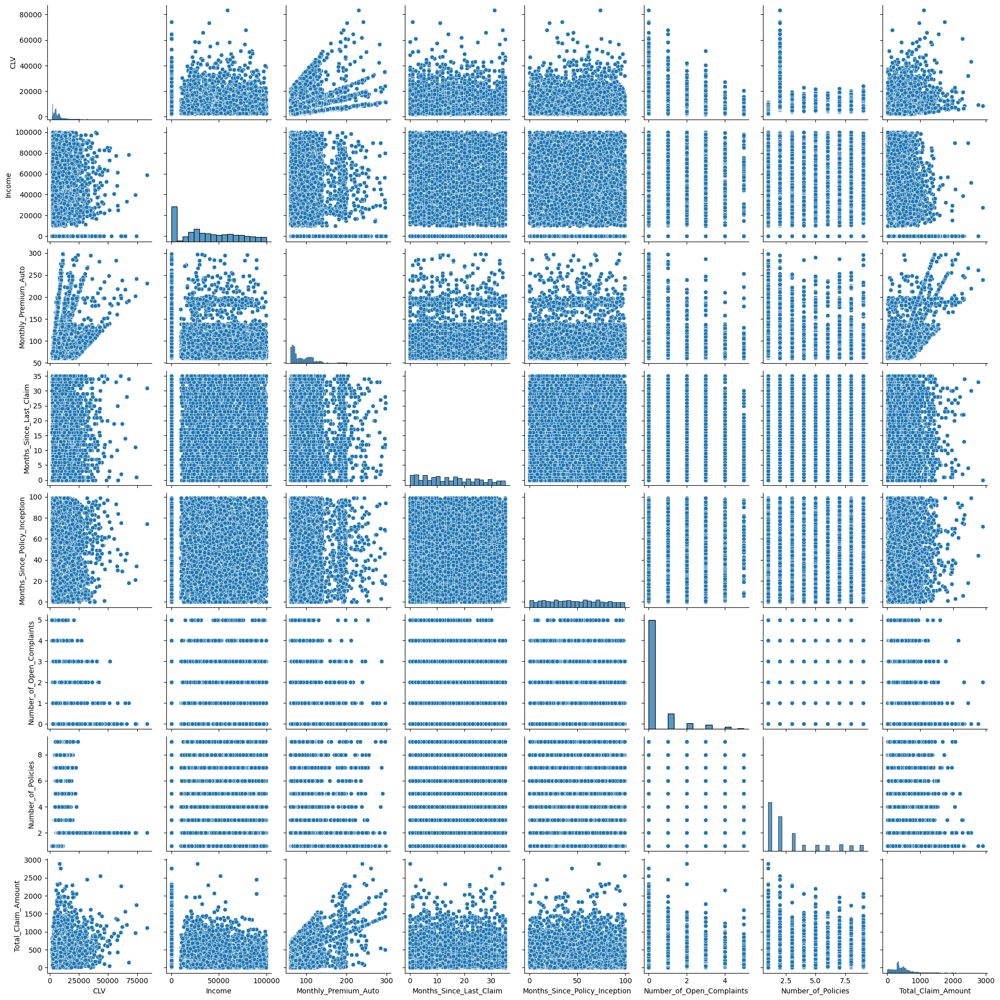

In [8]:
sns.pairplot(clv_df)

In [160]:
clv_df.columns

Index(['Customer', 'State', 'CLV', 'Response', 'Coverage', 'Education',
       'Effective To Date', 'EmploymentStatus', 'Gender', 'Income',
       'Location_Code', 'Marital_Status', 'Monthly_Premium_Auto',
       'Months_Since_Last_Claim', 'Months_Since_Policy_Inception',
       'Number_of_Open_Complaints', 'Number_of_Policies', 'Policy_Type',
       'Policy', 'Renew_Offer_Type', 'Sales_Channel', 'Total_Claim_Amount',
       'Vehicle_Class', 'Vehicle_Size'],
      dtype='object')

# 3.1 Numerical Features

In [161]:
Numerical_columns = clv_df.select_dtypes(exclude=['object']).columns
Numerical_columns

Index(['CLV', 'Income', 'Monthly_Premium_Auto', 'Months_Since_Last_Claim',
       'Months_Since_Policy_Inception', 'Number_of_Open_Complaints',
       'Number_of_Policies', 'Total_Claim_Amount'],
      dtype='object')

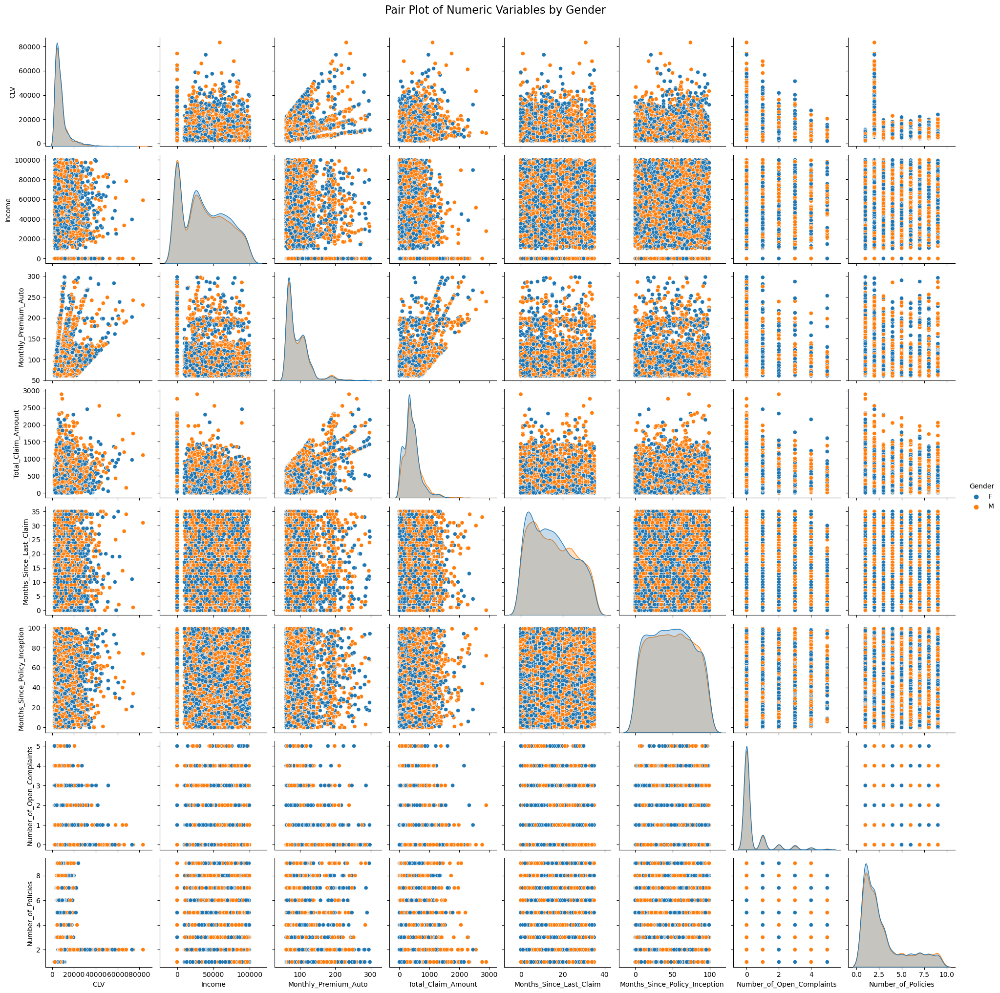

In [11]:
num_vars = ["CLV", "Income", "Monthly_Premium_Auto", "Total_Claim_Amount","Months_Since_Last_Claim","Months_Since_Policy_Inception","Number_of_Open_Complaints",'Number_of_Policies']
sns.pairplot(clv_df, vars=num_vars, hue="Gender")
plt.suptitle("Pair Plot of Numeric Variables by Gender", y=1.02, fontsize=16)
plt.show()

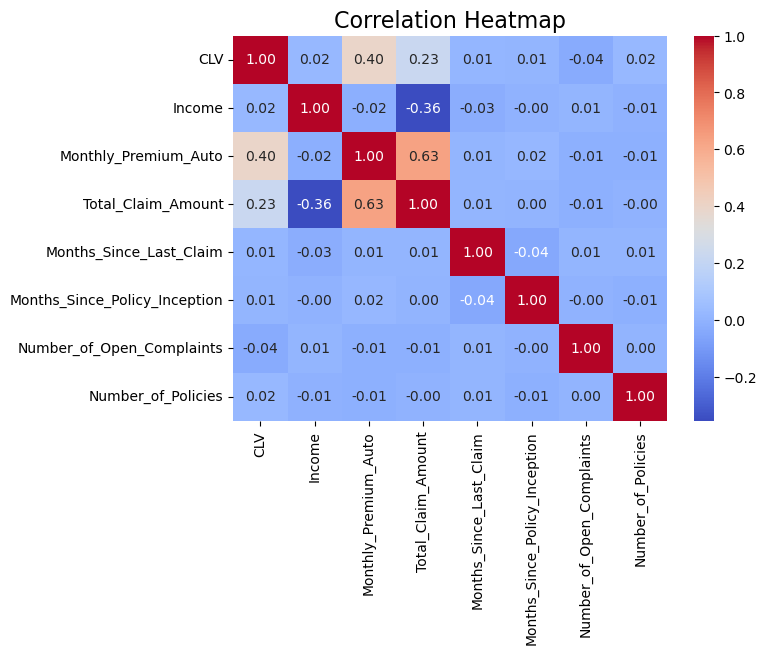

In [12]:
num_vars = ["CLV", "Income", "Monthly_Premium_Auto", "Total_Claim_Amount","Months_Since_Last_Claim","Months_Since_Policy_Inception","Number_of_Open_Complaints",'Number_of_Policies']
corr_matrix = clv_df[num_vars].corr()
plt.figure(figsize=(7, 5))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap", fontsize=16)
plt.show()


## Univariate Analysis

In [13]:
## 3.1.1 CLV

In [14]:
clv_df['CLV']

0        2763.519279
1        6979.535903
2       12887.431650
3        7645.861827
4        2813.692575
            ...     
9129    23405.987980
9130     3096.511217
9131     8163.890428
9132     7524.442436
9133     2611.836866
Name: CLV, Length: 9134, dtype: float64

<Axes: >

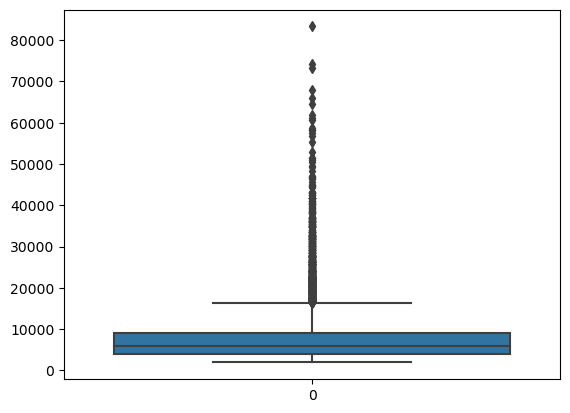

In [15]:
sns.boxplot(clv_df['CLV'])

<Axes: ylabel='Density'>

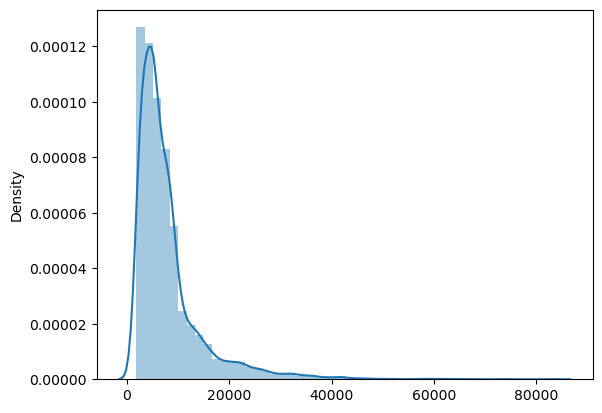

In [16]:
sns.distplot(x=clv_df['CLV'])

# 3.1.2 Income

In [17]:
clv_df['Income']

0       56274
1           0
2       48767
3           0
4       43836
        ...  
9129    71941
9130    21604
9131        0
9132    21941
9133        0
Name: Income, Length: 9134, dtype: int64

In [18]:
clv_df['Income'].isna().sum()

0

<Axes: xlabel='Income', ylabel='Density'>

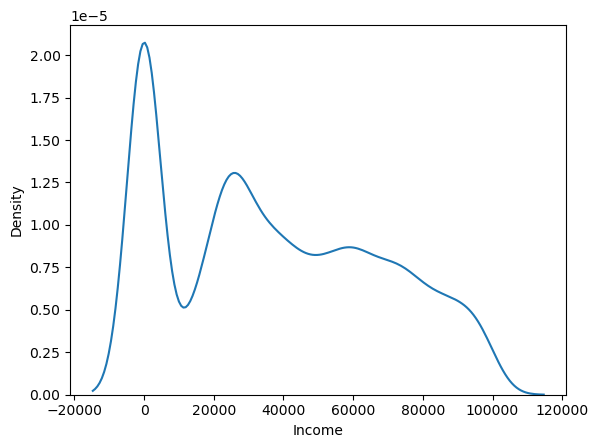

In [19]:
sns.kdeplot(clv_df['Income'])

In [20]:
clv_df['Income'].skew()

0.28688727581189166

<Axes: ylabel='Income'>

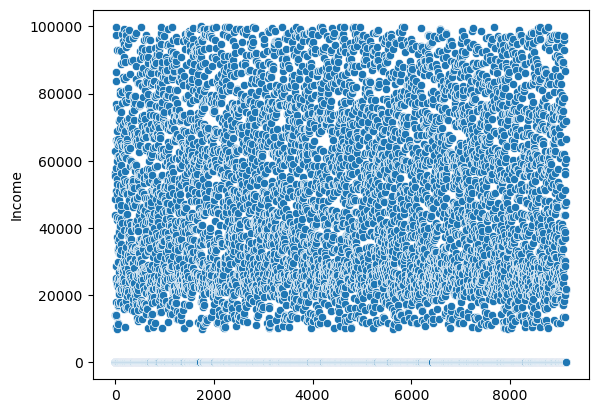

In [21]:
sns.scatterplot(clv_df['Income'])

<h3 style="color:orangered">Scrutiny: There is no linear relationship between income & CLV.</h3>

<Axes: xlabel='Income'>

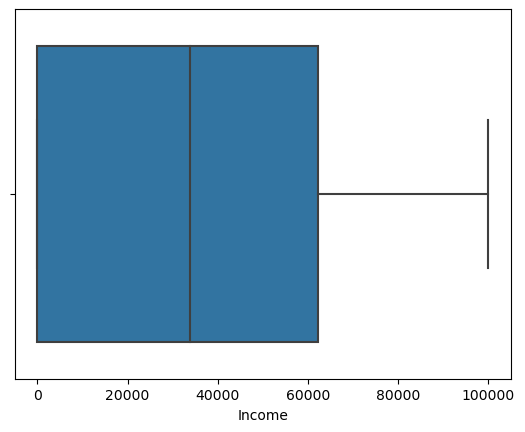

In [22]:
sns.boxplot(x=clv_df['Income'])

<h3 style='color:darkblue'># There is NO Outlier</h3>

<Axes: xlabel='Income', ylabel='Density'>

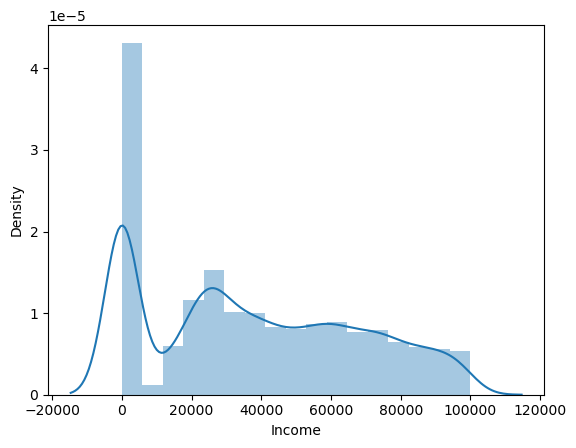

In [23]:
sns.distplot(clv_df['Income'])

## 3.1.3 Monthly_Premium_Auto

In [24]:
clv_df['Monthly_Premium_Auto']

0        69
1        94
2       108
3       106
4        73
       ... 
9129     73
9130     79
9131     85
9132     96
9133     77
Name: Monthly_Premium_Auto, Length: 9134, dtype: int64

<Axes: xlabel='Monthly_Premium_Auto', ylabel='Density'>

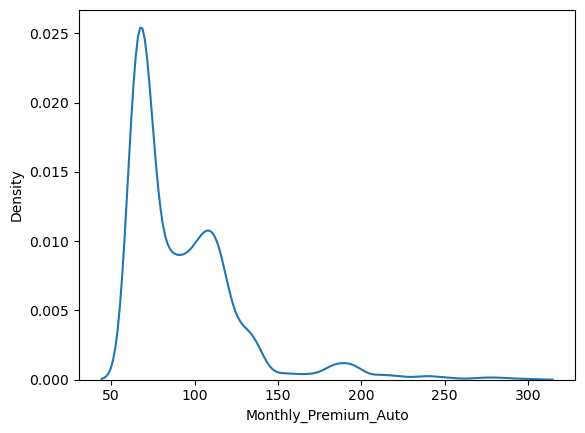

In [25]:
sns.kdeplot(clv_df['Monthly_Premium_Auto'])

In [26]:
clv_df['Monthly_Premium_Auto'].skew()           # Data is not normally distributed

2.1235464499475345

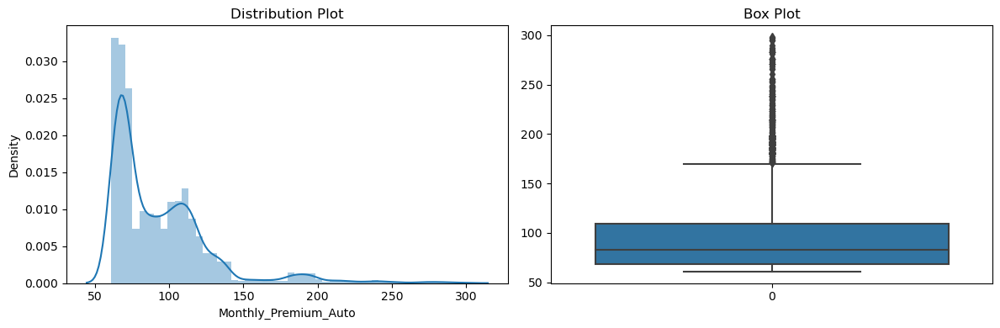

In [27]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

sns.distplot(clv_df['Monthly_Premium_Auto'], ax=axs[0])
axs[0].set_title('Distribution Plot')

sns.boxplot(clv_df['Monthly_Premium_Auto'], ax=axs[1])
axs[1].set_title('Box Plot')

plt.tight_layout()

plt.show()


<Axes: >

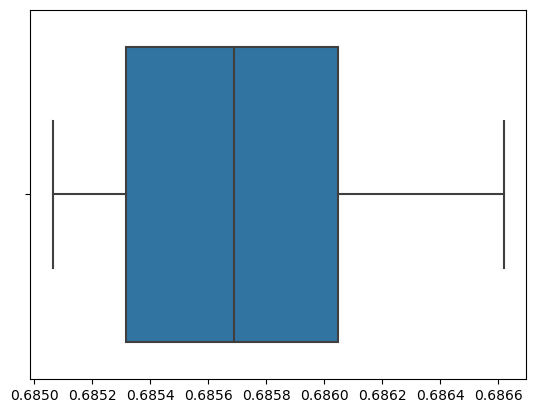

In [28]:
sns.boxplot(x=boxcox(clv_df['Monthly_Premium_Auto'])[0])

## 3.1.4 Month_Since_Last_Claim

In [29]:
clv_df['Months_Since_Last_Claim']

0       32
1       13
2       18
3       18
4       12
        ..
9129    18
9130    14
9131     9
9132    34
9133     3
Name: Months_Since_Last_Claim, Length: 9134, dtype: int64

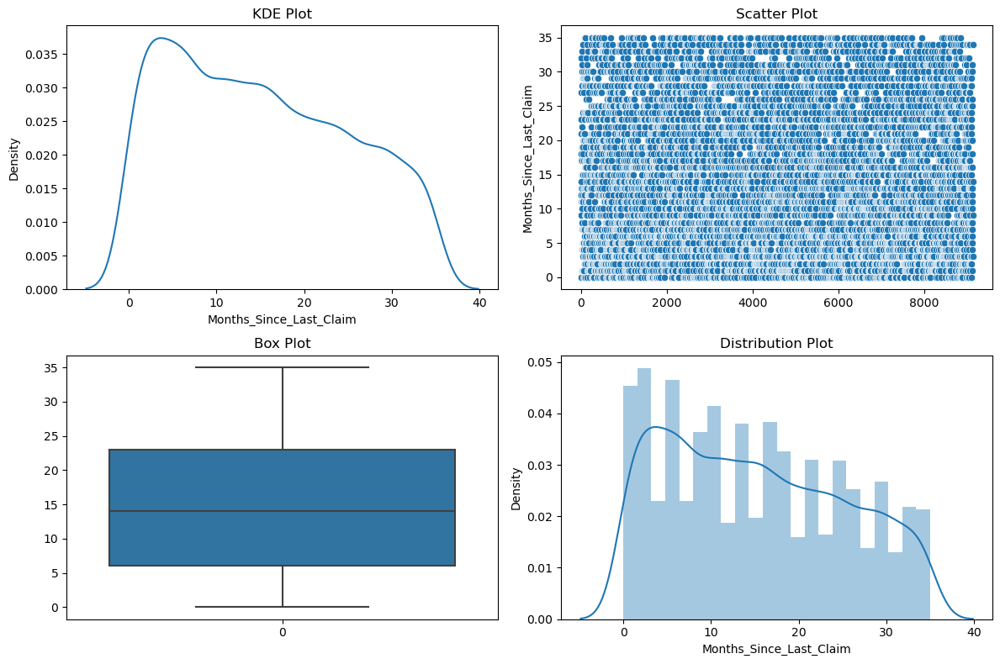

In [30]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

sns.kdeplot(clv_df['Months_Since_Last_Claim'], ax=axs[0, 0])
axs[0, 0].set_title('KDE Plot')

sns.scatterplot(clv_df['Months_Since_Last_Claim'], ax=axs[0, 1])
axs[0, 1].set_title('Scatter Plot')

sns.boxplot(clv_df['Months_Since_Last_Claim'], ax=axs[1, 0])
axs[1, 0].set_title('Box Plot')

sns.distplot(clv_df['Months_Since_Last_Claim'], ax=axs[1, 1])
axs[1, 1].set_title('Distribution Plot')


plt.tight_layout()

plt.show()


In [31]:
clv_df['Months_Since_Last_Claim'].skew()

0.2785863118107981

## 3.1.5 Months_Since_Policy_Inception

In [32]:
clv_df['Months_Since_Policy_Inception']

0        5
1       42
2       38
3       65
4       44
        ..
9129    89
9130    28
9131    37
9132     3
9133    90
Name: Months_Since_Policy_Inception, Length: 9134, dtype: int64

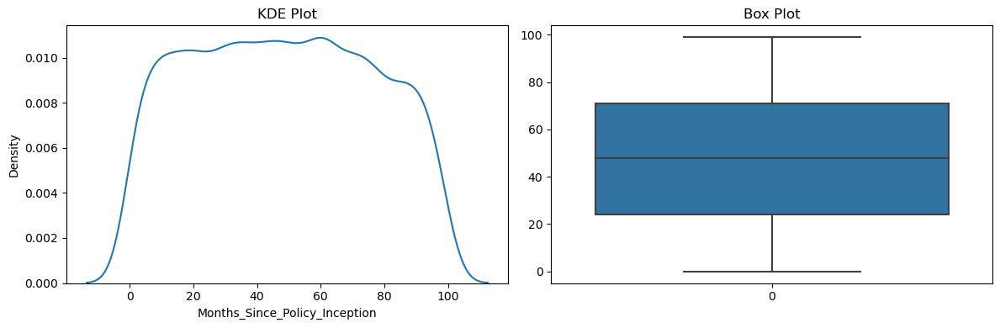

In [33]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

sns.kdeplot(clv_df['Months_Since_Policy_Inception'], ax=axs[0])
axs[0].set_title('KDE Plot')

sns.boxplot(clv_df['Months_Since_Policy_Inception'], ax=axs[1])
axs[1].set_title('Box Plot')

plt.tight_layout()

plt.show()


In [34]:
clv_df['Months_Since_Policy_Inception'].skew()

0.040164961597799524

<h3 style='color:darkblue'># Data Is Normally Distributed</h3>

## 3.1.6 Number_Of_Open_Complaints

In [35]:
clv_df['Number_of_Open_Complaints']

0       0
1       0
2       0
3       0
4       0
       ..
9129    0
9130    0
9131    3
9132    0
9133    0
Name: Number_of_Open_Complaints, Length: 9134, dtype: int64

In [36]:
clv_df['Number_of_Open_Complaints'].value_counts()

0    7252
1    1011
2     374
3     292
4     149
5      56
Name: Number_of_Open_Complaints, dtype: int64

<Axes: xlabel='Number_of_Open_Complaints', ylabel='count'>

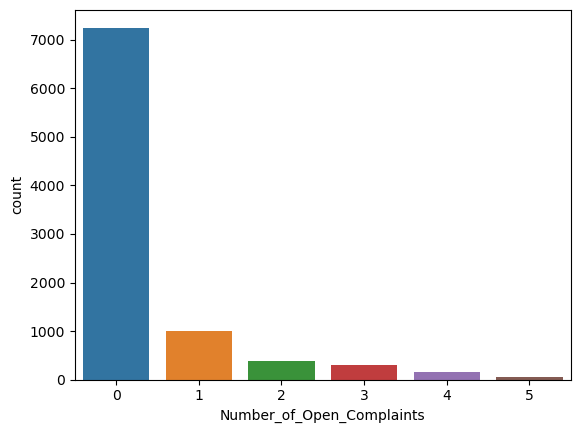

In [37]:
sns.countplot(x=clv_df['Number_of_Open_Complaints'])

## 3.1.7 Number of Policies

In [38]:
clv_df['Number_of_Policies']

0       1
1       8
2       2
3       7
4       1
       ..
9129    2
9130    1
9131    2
9132    3
9133    1
Name: Number_of_Policies, Length: 9134, dtype: int64

In [39]:
clv_df['Number_of_Policies'].value_counts()

1    3251
2    2294
3    1168
7     433
9     416
4     409
5     407
8     384
6     372
Name: Number_of_Policies, dtype: int64

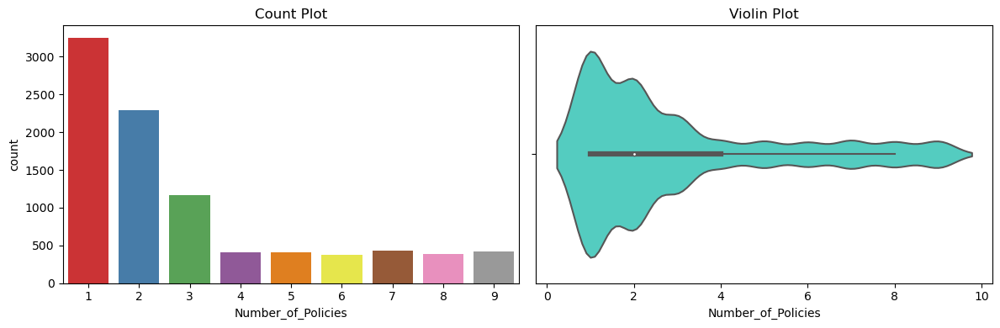

In [40]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

unique_values = clv_df['Number_of_Policies'].unique()
colors = sns.color_palette("Set1", len(unique_values))

sns.countplot(x=clv_df['Number_of_Policies'], ax=axs[0], palette = colors )
axs[0].set_title('Count Plot')

sns.violinplot(x=clv_df['Number_of_Policies'], ax=axs[1], color = 'turquoise')
axs[1].set_title('Violin Plot')

plt.tight_layout()

plt.show()


## 3.1.8 Total_Claim_Amounts

In [41]:
clv_df['Total_Claim_Amount']

0        384.811147
1       1131.464935
2        566.472247
3        529.881344
4        138.130879
           ...     
9129     198.234764
9130     379.200000
9131     790.784983
9132     691.200000
9133     369.600000
Name: Total_Claim_Amount, Length: 9134, dtype: float64

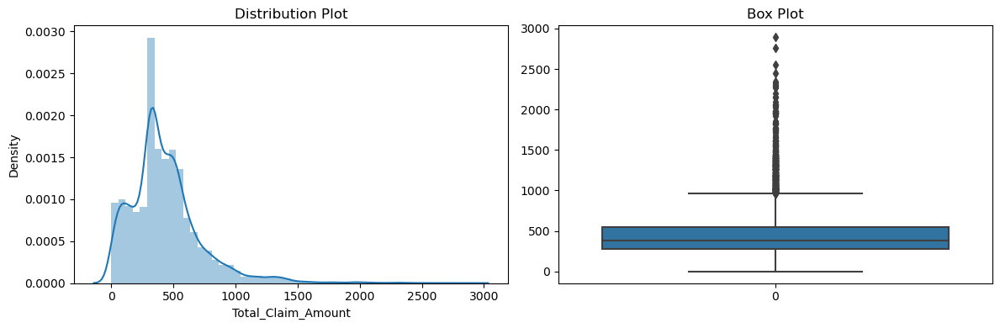

In [42]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

sns.distplot(clv_df['Total_Claim_Amount'], ax=axs[0])
axs[0].set_title('Distribution Plot')

sns.boxplot(clv_df['Total_Claim_Amount'], ax=axs[1])
axs[1].set_title('Box Plot')

plt.tight_layout()

plt.show()



In [43]:
clv_df['Total_Claim_Amount'].skew()

1.7149658097209557

<h3 style="color:darkblue">This feature has multiple peak's so to remove those peaks we can apply any of the power transformation (SQUARE / CUBE), we have tried Square, Cube & Yeojohnson.</h3>

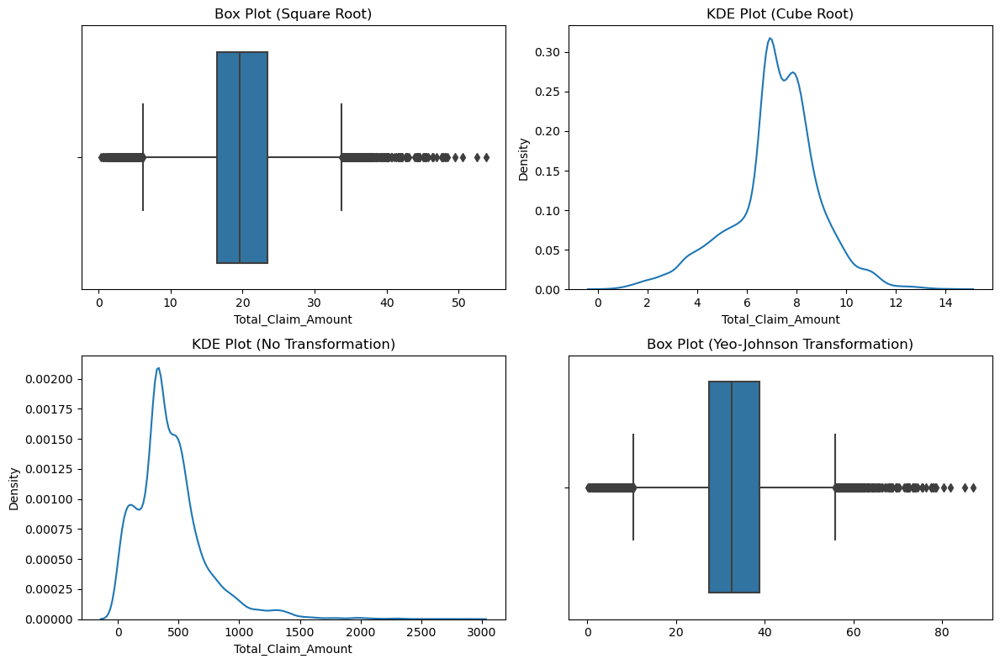

In [44]:
# Create a figure with two subplots in a 2x2 grid
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Plot a boxplot with square root transformation
sns.boxplot(x=np.sqrt(clv_df['Total_Claim_Amount']), ax=axs[0, 0])
axs[0, 0].set_title('Box Plot (Square Root)')

# Plot a KDE plot with cube root transformation
sns.kdeplot(x=np.cbrt(clv_df['Total_Claim_Amount']), ax=axs[0, 1])
axs[0, 1].set_title('KDE Plot (Cube Root)')

# Plot a KDE plot without transformation
sns.kdeplot(x=clv_df['Total_Claim_Amount'], ax=axs[1, 0])
axs[1, 0].set_title('KDE Plot (No Transformation)')

# Apply the Yeo-Johnson transformation and plot a boxplot
transformed_data, _ = yeojohnson(clv_df['Total_Claim_Amount'])
sns.boxplot(x=transformed_data, ax=axs[1, 1])
axs[1, 1].set_title('Box Plot (Yeo-Johnson Transformation)')

# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()


# Bivariate Analysis

## 3.2 Income

#### Income Vs CLV

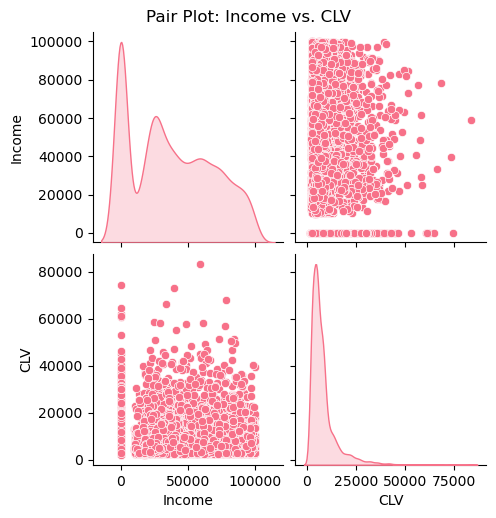

In [45]:
sns.set_palette("husl")

sns.pairplot(clv_df[['Income', 'CLV']], diag_kind='kde')

plt.suptitle('Pair Plot: Income vs. CLV', y=1.02)

plt.show()


<h2 style="color:orangered">Scrutiny :There is no linear relationship between income & CLV.</h3>

## 3.3 Monthly_Premium_Auto

#### Monthly_Premium_Auto Vs CLV

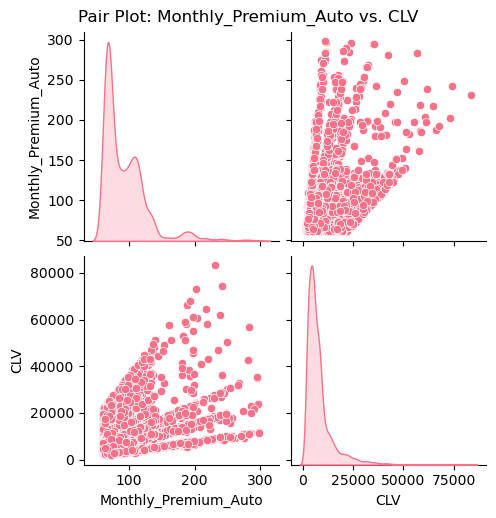

In [46]:
sns.pairplot(clv_df[['Monthly_Premium_Auto', 'CLV']], diag_kind='kde')
plt.suptitle('Pair Plot: Monthly_Premium_Auto vs. CLV', y=1.02)
plt.show()

<h2 style="color:red">Observation : There is linear relationship between Monthly Premium Auto & CLV.</h3>

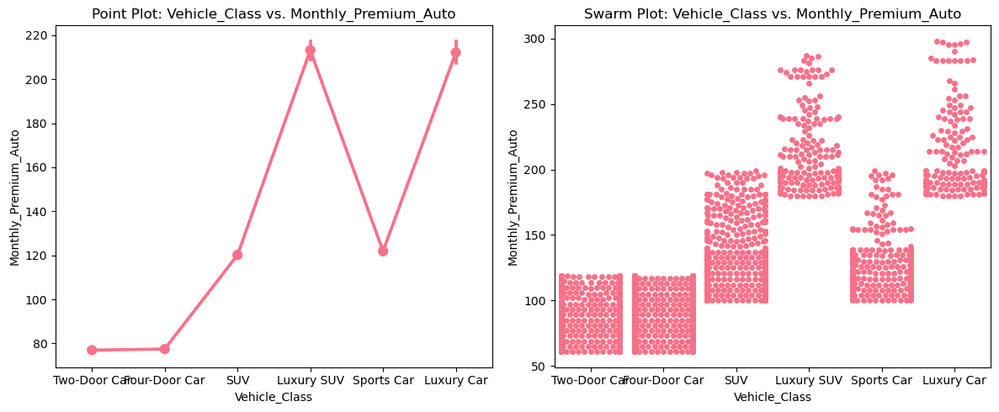

In [47]:
#TIME TAKING

fig, axes = plt.subplots(1, 2, figsize=(12, 5)) #CLV 

sns.pointplot(x=clv_df['Vehicle_Class'], y=clv_df['Monthly_Premium_Auto'], ax=axes[0])
axes[0].set_title('Point Plot: Vehicle_Class vs. Monthly_Premium_Auto')

sns.swarmplot(x=clv_df['Vehicle_Class'], y=clv_df['Monthly_Premium_Auto'], ax=axes[1])
axes[1].set_title('Swarm Plot: Vehicle_Class vs. Monthly_Premium_Auto')

plt.tight_layout()

plt.show()


<h2 style="color:orangered">Scrutiny : From the above plots, we can see that people with Luxury Cars & Luxury SUV have more higher monthly premium than the other ones, hence they contribute more revenue over the duration of their relationship with the company.</h3>

<Axes: xlabel='Monthly_Premium_Auto', ylabel='Coverage'>

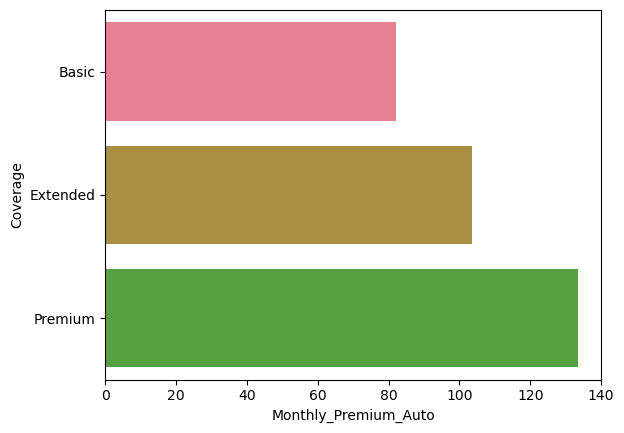

In [48]:
sns.barplot(x=clv_df['Monthly_Premium_Auto'],y=clv_df['Coverage'],orient='h',ci=None)

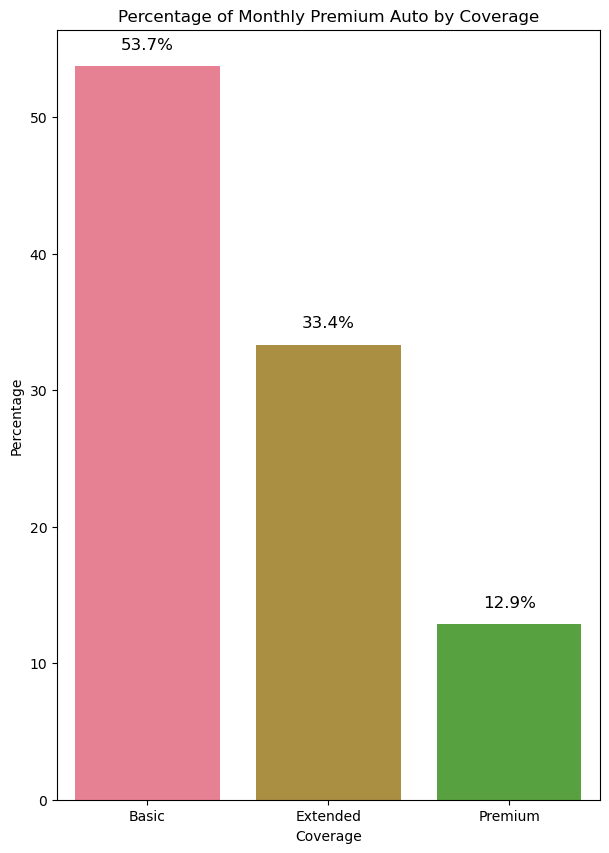

In [49]:
coverage_premium_totals = clv_df.groupby('Coverage')['Monthly_Premium_Auto'].sum()

total_sum = coverage_premium_totals.sum()

percentages = (coverage_premium_totals / total_sum) * 100

plt.figure(figsize=(7,10))
sns.barplot(x=percentages.index, y=percentages.values, ci=None)

# Add percentage labels above each bar
for i, v in enumerate(percentages):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center', va='bottom', fontsize=12)

# Add labels and title
plt.xlabel('Coverage')
plt.ylabel('Percentage')
plt.title('Percentage of Monthly Premium Auto by Coverage')

# Show the plot
plt.show()


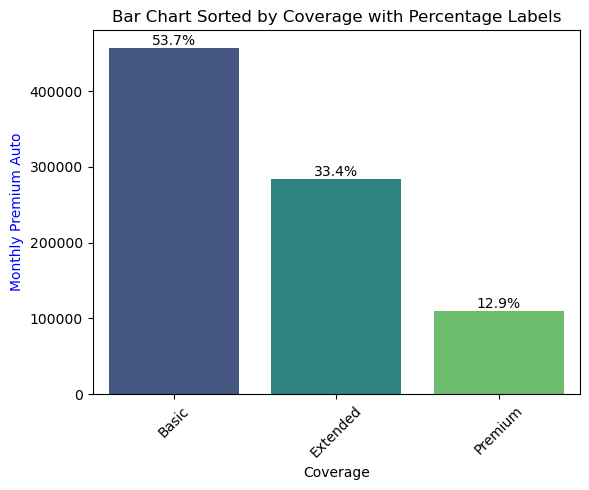

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming clv_df contains your data

# Create a crosstab to calculate the sum of 'Monthly_Premium_Auto' for each 'Coverage' category
ct = pd.crosstab(clv_df['Coverage'], columns='Monthly_Premium_Auto', values=clv_df['Monthly_Premium_Auto'], aggfunc='sum')
ct.reset_index(inplace=True)

# Sort the data by 'Monthly_Premium_Auto' in descending order
ct = ct.sort_values(by='Monthly_Premium_Auto', ascending=False)

# Calculate the total sum of 'Monthly_Premium_Auto'
total = ct['Monthly_Premium_Auto'].sum()

# Create a bar plot with sorted data
plt.figure(figsize=(6,5))
ax = sns.barplot(x='Coverage', y='Monthly_Premium_Auto', data=ct, palette='viridis', ci=None)

# Add percentage labels above the bars
for p in ax.patches:
    percentage = f'{100 * p.get_height() / total:.1f}%'
    x_pos = p.get_x() + p.get_width() / 2
    y_pos = p.get_height()
    ax.annotate(percentage, (x_pos, y_pos), ha='center', va='bottom')

# Customize the plot
ax.set_xlabel('Coverage')
ax.set_ylabel('Monthly Premium Auto', color='blue')

# Show the plot
plt.title('Bar Chart Sorted by Coverage with Percentage Labels')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### 3.4 Month Since Last CLaim

<Axes: xlabel='Months_Since_Last_Claim', ylabel='CLV'>

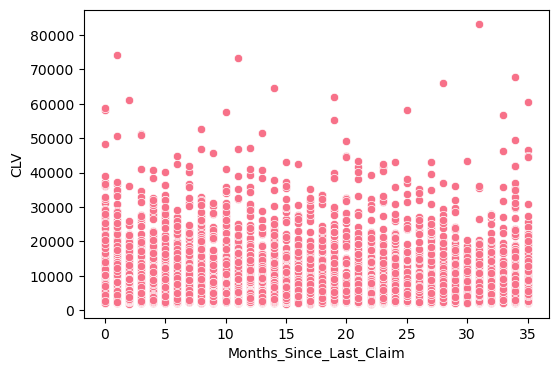

In [51]:
plt.figure(figsize=(6,4))
sns.scatterplot(x=clv_df['Months_Since_Last_Claim'],y=clv_df['CLV'])

<h2 style="color:orangered">Scrutiny : This feature doesn't have any relationship with CLV.</h2>

## 3.5 Months_Since_Policy_Inception

<Axes: xlabel='Months_Since_Policy_Inception', ylabel='CLV'>

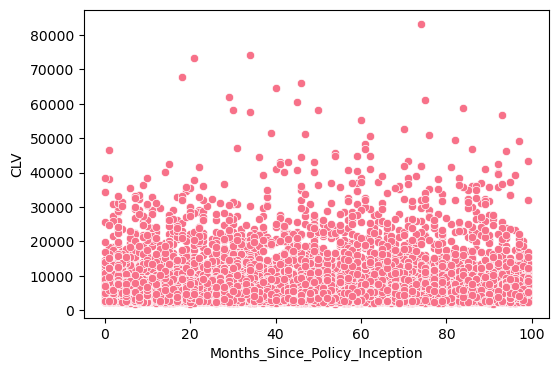

In [52]:
plt.figure(figsize=(6,4))
sns.scatterplot(x=clv_df['Months_Since_Policy_Inception'],y=clv_df['CLV'])

## 3.6 Number_Of_Open_Complaints

<Axes: xlabel='Number_of_Open_Complaints', ylabel='CLV'>

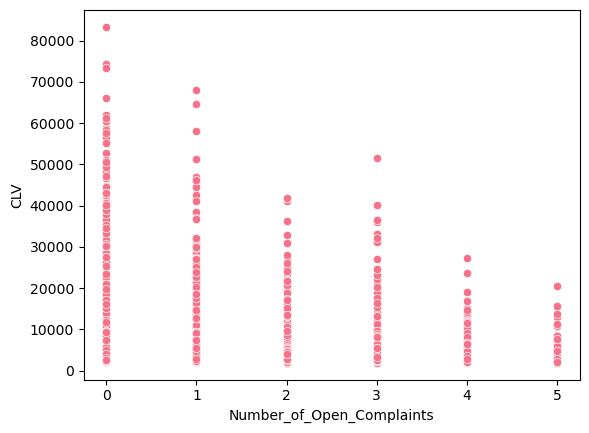

In [53]:
sns.scatterplot(x=clv_df['Number_of_Open_Complaints'],y=clv_df['CLV'])

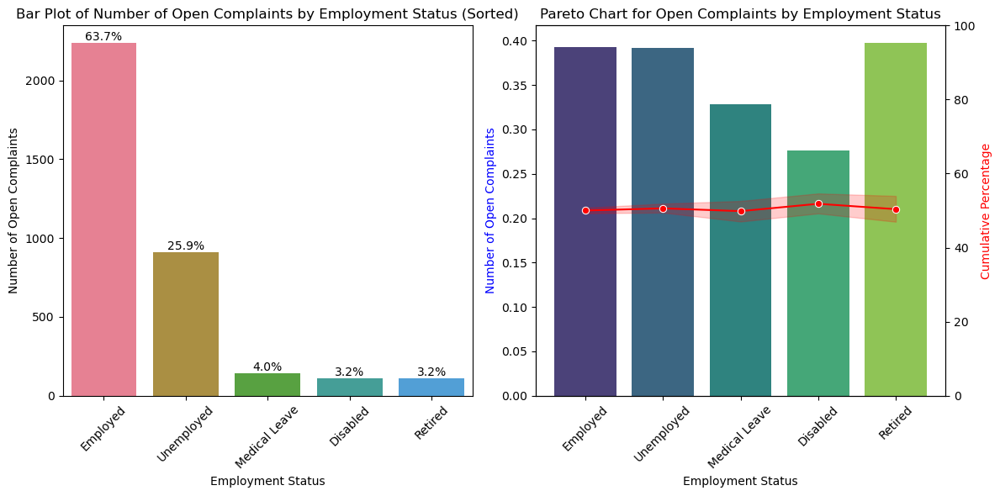

In [54]:
clv_df.sort_values(by='Number_of_Open_Complaints', ascending=False)

clv_df['cumulative_percentage'] = (clv_df['Number_of_Open_Complaints'].cumsum() / clv_df['Number_of_Open_Complaints'].sum()) * 100

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

total_complaints_by_status = clv_df.groupby('EmploymentStatus')['Number_of_Open_Complaints'].sum()
total = total_complaints_by_status.sum()
ax1 = sns.barplot(
    x=total_complaints_by_status.index,
    y=total_complaints_by_status.values,
    ci=None,
    order=total_complaints_by_status.sort_values(ascending=False).index,
    ax=ax1
)
for p in ax1.patches:
    percentage = f'{100 * p.get_height() / total:.1f}%'
    x_pos = p.get_x() + p.get_width() / 2
    y_pos = p.get_height()
    ax1.annotate(percentage, (x_pos, y_pos), ha='center', va='bottom')
ax1.set_xlabel('Employment Status')
ax1.set_ylabel('Number of Open Complaints')
ax1.set_title('Bar Plot of Number of Open Complaints by Employment Status (Sorted)')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)

ax2 = sns.barplot(x='EmploymentStatus', y='Number_of_Open_Complaints', data=clv_df, palette='viridis', ci=None, ax=ax2)
ax2.set_xlabel('Employment Status')
ax2.set_ylabel('Number of Open Complaints', color='blue')
ax2.set_title('Pareto Chart for Open Complaints by Employment Status')
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)

ax2_2 = ax2.twinx()
sns.lineplot(x='EmploymentStatus', y='cumulative_percentage', data=clv_df, ax=ax2_2, color='red', marker='o')
ax2_2.set_ylabel('Cumulative Percentage', color='red')
ax2_2.set_ylim(0, 100)

plt.tight_layout()

plt.show()


## 3.7 Number_Of_Policies

<Axes: xlabel='Number_of_Policies', ylabel='CLV'>

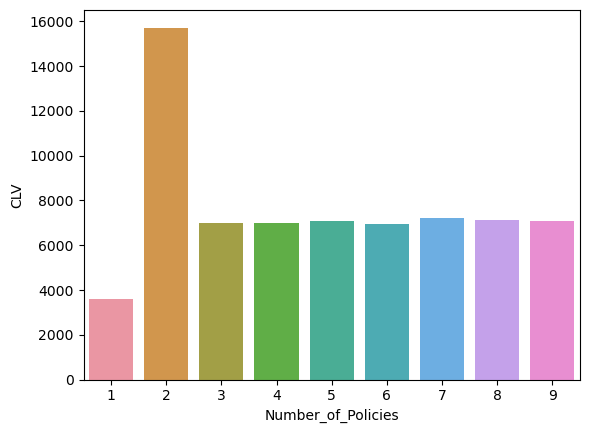

In [55]:
sns.barplot(x=clv_df['Number_of_Policies'],y=clv_df['CLV'],ci=None)

<h2 style="color:orangered">Scrutiny : Customers who hold two policies are contributing more significantly to the company's profitability.</h2>

## 3.8 Total_Claim_Amounts

<Axes: xlabel='Total_Claim_Amount', ylabel='CLV'>

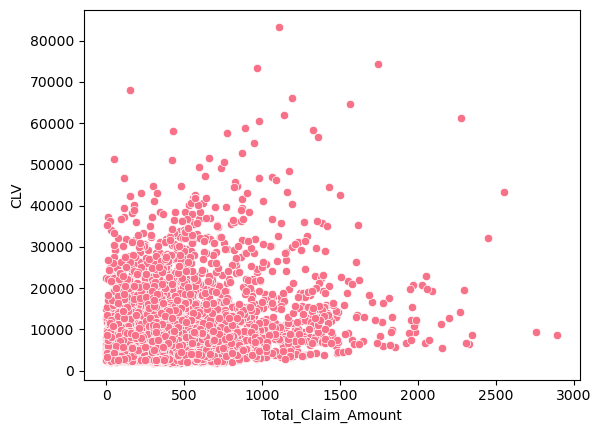

In [56]:
sns.scatterplot(x=clv_df['Total_Claim_Amount'],y=clv_df['CLV'])

In [57]:
clv_df['EmploymentStatus'].value_counts()

Employed         5698
Unemployed       2317
Medical Leave     432
Disabled          405
Retired           282
Name: EmploymentStatus, dtype: int64

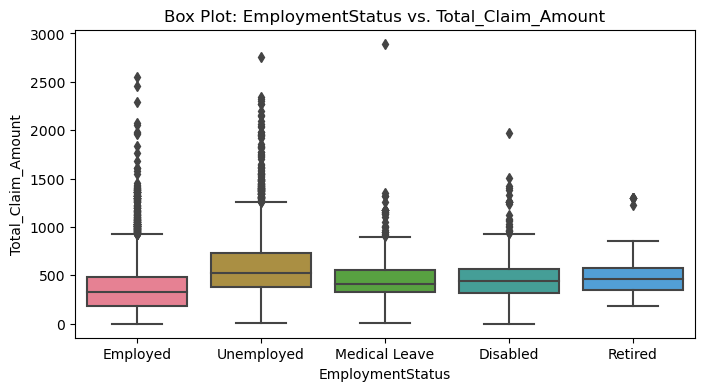

In [58]:
plt.figure(figsize=(8, 4))
sns.boxplot(x=clv_df['EmploymentStatus'], y=clv_df['Total_Claim_Amount'])
plt.title('Box Plot: EmploymentStatus vs. Total_Claim_Amount')
plt.show()

<h2 style="color:red">Scrutiny : Unemployed customers tend to have higher total claim amounts compared to others.</h2> 

<Axes: xlabel='Education', ylabel='Total_Claim_Amount'>

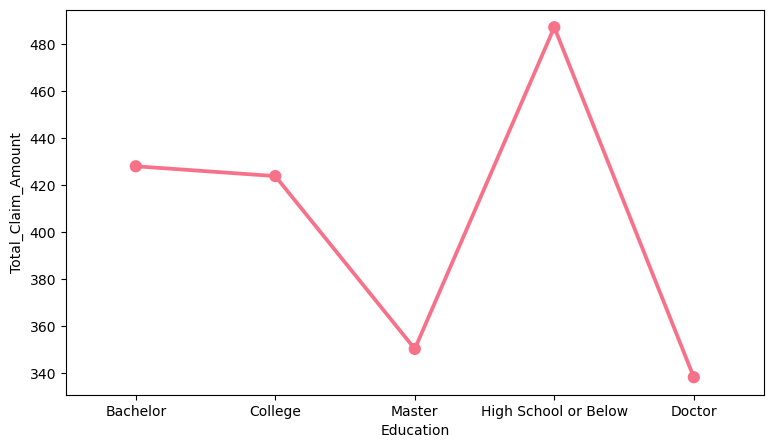

In [59]:
plt.figure(figsize=(9,5))
sns.pointplot(x=clv_df['Education'],y=clv_df['Total_Claim_Amount'],ci=None) 

<h2 style="color:red">Scrutiny : Customers with an educational background of high school or below are showing higher total claim amounts compared to others.</h2> 

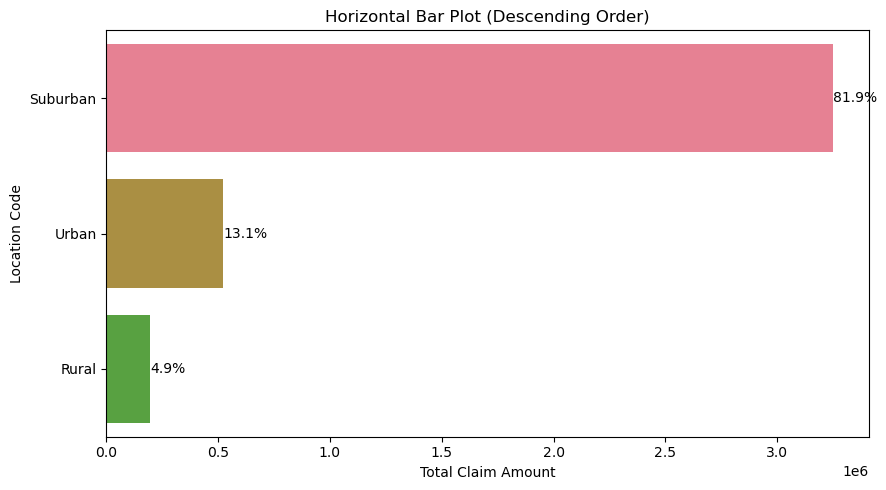

In [60]:
fig, ax = plt.subplots(figsize=(9,5))

location_claim_totals = clv_df.groupby('Location_Code')['Total_Claim_Amount'].sum()
total = location_claim_totals.sum()

location_claim_totals = location_claim_totals.sort_values(ascending=False)
location_labels = location_claim_totals.index
location_values = location_claim_totals.values

sns.barplot(x=location_values, y=location_labels, ci=None, ax=ax)
ax.set_xlabel('Total Claim Amount')
ax.set_ylabel('Location Code')
ax.set_title('Horizontal Bar Plot (Descending Order)')

for i, v in enumerate(location_values):
    percentage = f'{(v / total * 100):.1f}%'
    ax.text(v, i, percentage, va='center')

plt.tight_layout()
plt.show()


## Multivariate Analysis

<Axes: >

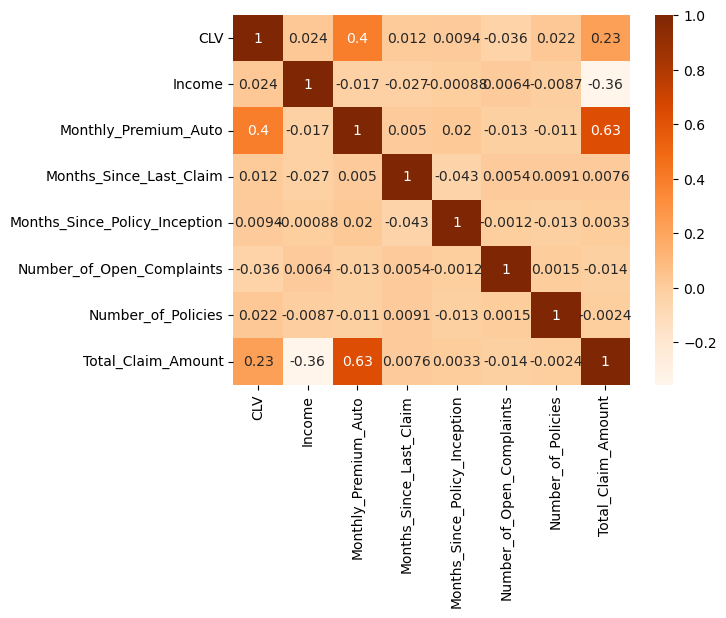

In [61]:
num_var1 = clv_df[['CLV', 'Income', 'Monthly_Premium_Auto','Months_Since_Last_Claim','Months_Since_Policy_Inception','Number_of_Open_Complaints','Number_of_Policies','Total_Claim_Amount']]
sns.heatmap(num_var1.corr(),annot=True,cmap='Oranges')

<h2 style="color:orangered">Scrutiny : The heatmap analysis conspicuously reveals that Customer Lifetime Value exhibits a stronger correlation with Monthly Premium Auto and maintains a reasonably significant association with Total Claim Amount.</h2> 

# Statistical Analysis

In [62]:
clv_df.describe().style.background_gradient(axis=None,cmap='YlOrRd')  

,CLV,Income,Monthly_Premium_Auto,Months_Since_Last_Claim,Months_Since_Policy_Inception,Number_of_Open_Complaints,Number_of_Policies,Total_Claim_Amount,cumulative_percentage
count,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000
mean,8004.940475,37657.380009,93.219291,15.097000,48.064594,0.384388,2.966170,434.088794,50.261669
std,6870.967608,30379.904734,34.407967,10.073257,27.905991,0.910384,2.390182,290.500092,29.091191
min,1898.007675,0.000000,61.000000,0.000000,0.000000,0.000000,1.000000,0.099007,0.000000
25%,3994.251794,0.000000,68.000000,6.000000,24.000000,0.000000,1.000000,272.258244,25.178012
50%,5780.182197,33889.500000,83.000000,14.000000,48.000000,0.000000,2.000000,383.945434,49.416121
75%,8962.167041,62320.000000,109.000000,23.000000,71.000000,0.000000,4.000000,547.514839,75.363144
max,83325.381190,99981.000000,298.000000,35.000000,99.000000,5.000000,9.000000,2893.239678,100.000000


# 3.2 Categorical Features

In [162]:
categorical_columns = clv_df.select_dtypes(include=['object']).columns
categorical_columns

Index(['Customer', 'State', 'Response', 'Coverage', 'Education',
       'Effective To Date', 'EmploymentStatus', 'Gender', 'Location_Code',
       'Marital_Status', 'Policy_Type', 'Policy', 'Renew_Offer_Type',
       'Sales_Channel', 'Vehicle_Class', 'Vehicle_Size'],
      dtype='object')

# Univariate Analysis

## 3.2.1 Customer

In [64]:
clv_df['Customer']

0       BU79786
1       QZ44356
2       AI49188
3       WW63253
4       HB64268
         ...   
9129    LA72316
9130    PK87824
9131    TD14365
9132    UP19263
9133    Y167826
Name: Customer, Length: 9134, dtype: object

## 3.2.2 State

In [65]:
clv_df['State']

0       Washington
1          Arizona
2           Nevada
3       California
4       Washington
           ...    
9129    California
9130    California
9131    California
9132    California
9133    California
Name: State, Length: 9134, dtype: object

In [66]:
clv_df['State'].value_counts()

California    3150
Oregon        2601
Arizona       1703
Nevada         882
Washington     798
Name: State, dtype: int64

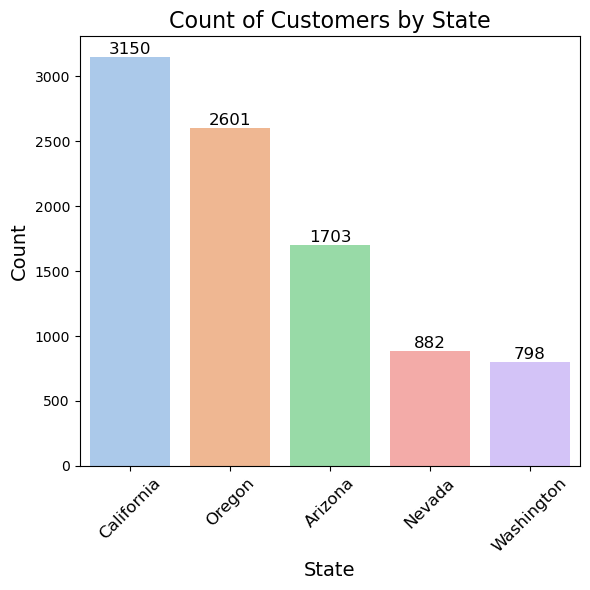

In [67]:
custom_palette = sns.color_palette("pastel")

plt.figure(figsize=(6, 6))
sns.countplot(x=clv_df['State'], palette=custom_palette, order=clv_df['State'].value_counts().index)
plt.title('Count of Customers by State', fontsize=16)
plt.xlabel('State', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, fontsize=12) 

for p in plt.gca().patches:
    height = p.get_height()
    plt.gca().annotate(f'{int(height)}', (p.get_x() + p.get_width() / 2., height), ha='center', va='bottom', fontsize=12)

plt.tight_layout()

plt.show()


<h2 style="color:orangered">Scrutiny : Most of the Customer Base is from California.</h2> 

# Bivariate Analysis

## 3.2.2 State

In [68]:
clv_df['State'].value_counts()

California    3150
Oregon        2601
Arizona       1703
Nevada         882
Washington     798
Name: State, dtype: int64

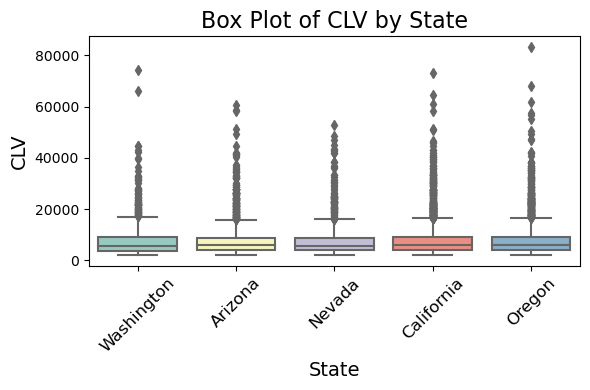

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 4))
sns.boxplot(data=clv_df, x="State", y="CLV", palette="Set3")
plt.title('Box Plot of CLV by State', fontsize=16)
plt.xlabel('State', fontsize=14)
plt.ylabel('CLV', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.tight_layout()
plt.show()


<h2 style="color:orangered">Scrutiny : CLV value for each of these category is similar over here irrespective of their customer base depending on States.</h2> 

## 3.2.3 Response

In [70]:
clv_df['Response'].value_counts()

No     7826
Yes    1308
Name: Response, dtype: int64

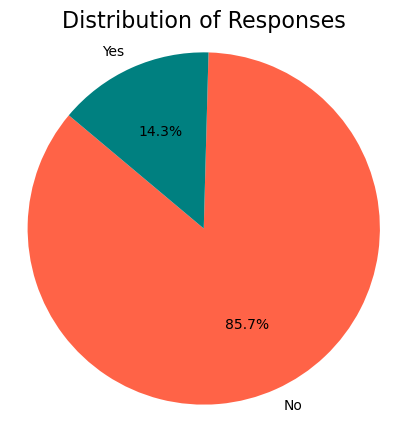

In [71]:
response_counts = clv_df['Response'].value_counts()

colors = ['tomato', 'teal']

plt.figure(figsize=(5,5))
plt.pie(response_counts, labels=response_counts.index, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title('Distribution of Responses', fontsize=16)
plt.axis('equal')
plt.show()


<h2 style="color:orangered">Scrutiny : From CLV perspective, there is distinction between customers who responded positively ('Yes') and those who did not ('No')."</h2> 

## 3.2.4 Coverage

In [72]:
clv_df['Coverage'].value_counts()

Basic       5568
Extended    2742
Premium      824
Name: Coverage, dtype: int64

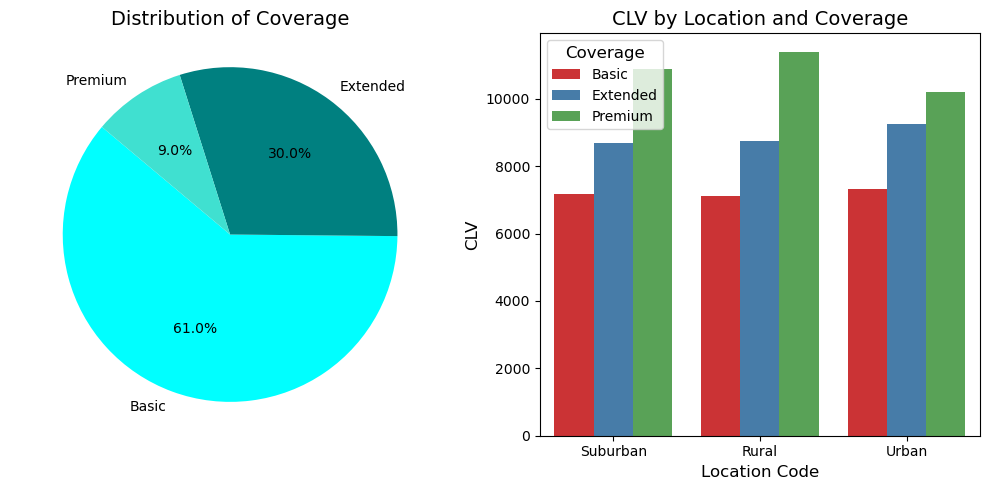

In [73]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

coverage_counts = clv_df['Coverage'].value_counts()
colors = ['aqua', 'teal', 'turquoise']
axes[0].pie(coverage_counts, labels=coverage_counts.index, autopct='%1.1f%%', colors=colors, startangle=140)
axes[0].set_title('Distribution of Coverage', fontsize=14)
axes[0].axis('equal')

sns.barplot(data=clv_df, x="Location_Code", y="CLV", hue="Coverage", ci=None, palette="Set1", ax=axes[1])
axes[1].set_title('CLV by Location and Coverage', fontsize=14)
axes[1].set_xlabel('Location Code', fontsize=12)
axes[1].set_ylabel('CLV', fontsize=12)
axes[1].legend(title='Coverage', title_fontsize=12, fontsize=10)

plt.tight_layout()

plt.show()


<h2 style="color:orangered">Scrutiny : With the help of above plot, we can say that , customer with Premium coverage add more average CLV compared to Basic and Extended coverage.</h3>

## 3.2.5 Education

In [74]:
clv_df['Education'].value_counts()

Bachelor                2748
College                 2681
High School or Below    2622
Master                   741
Doctor                   342
Name: Education, dtype: int64

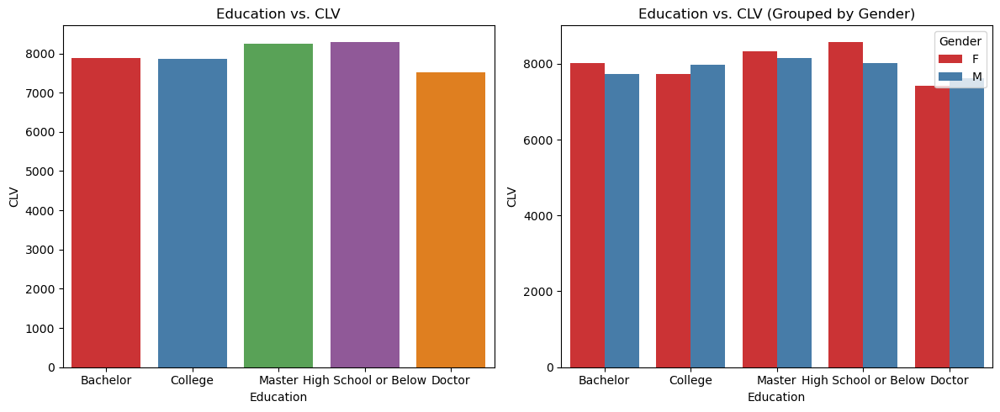

In [75]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(12,5))

# Create the first subplot on the left
sns.barplot(x=clv_df['Education'], y=clv_df['CLV'], ax=axes[0], ci=None,palette='Set1')
axes[0].set_title('Education vs. CLV')

# Create the second subplot on the right as a grouped bar plot
sns.barplot(data=clv_df, x='Education', y='CLV', hue='Gender', ax=axes[1], ci=None, palette='Set1')
axes[1].set_title('Education vs. CLV (Grouped by Gender)')

# Adjust spacing between subplots
plt.tight_layout()

# Show the combined figure with both subplots
plt.show()


<h2 style="color:orangered">Conclusion : Females who holds Masters & high school degree gives identical CLV value but higher than Males.</h2>

## 3.2.6 Effective To Date

<h3 style='color:darkblue'>We are going to drop this feature as it doesn't hold much important information.</h3>

## 3.2.7 Employement Status

In [76]:
clv_df['EmploymentStatus'].value_counts()

Employed         5698
Unemployed       2317
Medical Leave     432
Disabled          405
Retired           282
Name: EmploymentStatus, dtype: int64

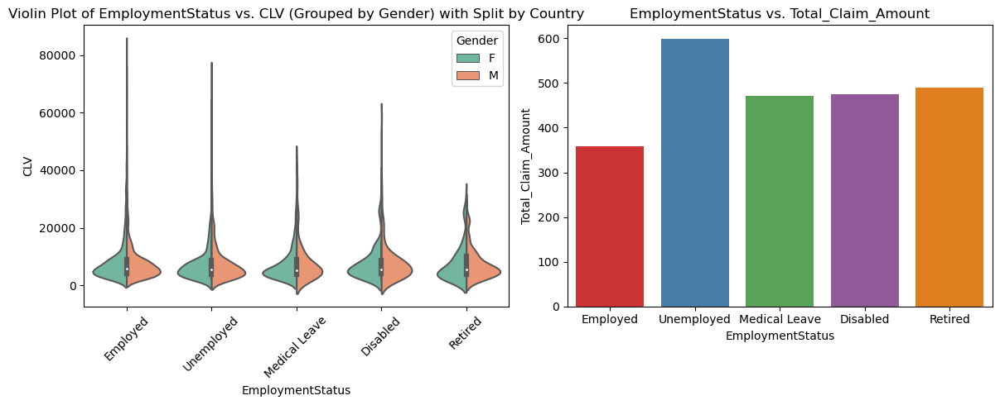

In [77]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.violinplot(x='EmploymentStatus', y='CLV', hue='Gender', data=clv_df, palette='Set2', split=True, ax=axes[0])
axes[0].set_title('Violin Plot of EmploymentStatus vs. CLV (Grouped by Gender) with Split by Country')
axes[0].set_xlabel('EmploymentStatus')
axes[0].set_ylabel('CLV')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45)
axes[0].legend(title='Gender', title_fontsize=10, loc='upper right')

sns.barplot(x='EmploymentStatus', y='Total_Claim_Amount', data=clv_df, ax=axes[1], ci=None, palette = 'Set1')
axes[1].set_title('EmploymentStatus vs. Total_Claim_Amount')
axes[1].set_xlabel('EmploymentStatus')
axes[1].set_ylabel('Total_Claim_Amount')

plt.tight_layout()

plt.show()


<h2 style="color:orangered">Scrutiny : Customers who are employeed, have more income and are more profitable to the company as they are also less likely to claim.</h2>

## 3.2.8 Gender

In [78]:
clv_df['Gender'].value_counts()

F    4658
M    4476
Name: Gender, dtype: int64

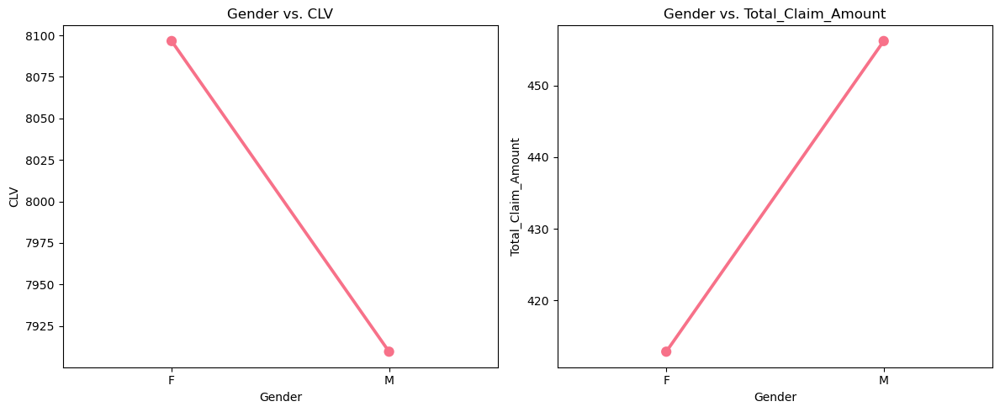

In [79]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.pointplot(x=clv_df['Gender'],y=clv_df['CLV'], ax=axes[0],ci=None)
axes[0].set_title('Gender vs. CLV')

sns.pointplot(x=clv_df['Gender'],y=clv_df['Total_Claim_Amount'], ax=axes[1],ci=None)
axes[1].set_title('Gender vs. Total_Claim_Amount')

plt.tight_layout()

plt.show()


<h2 style="color:orangered">Observation : CLV is more for Female, they are less likely to claim as compared to Male.</h3>

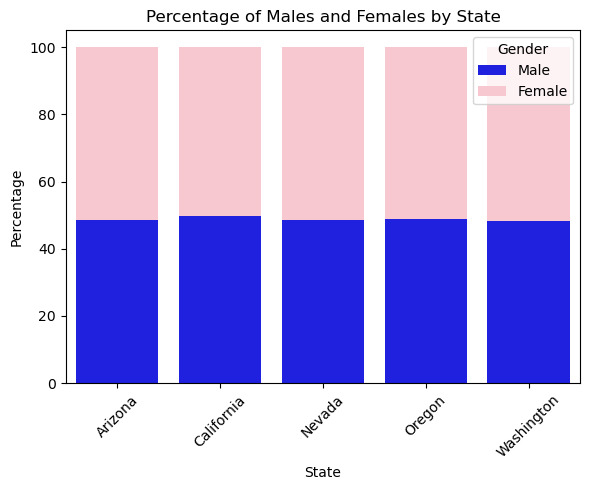

In [80]:
state_gender_counts = clv_df.groupby(['State', 'Gender']).size().unstack(fill_value=0)

total_counts = state_gender_counts.sum(axis=1)

state_gender_percentages = state_gender_counts.div(total_counts, axis=0) * 100

state_gender_percentages.columns = ['Female_Percentage', 'Male_Percentage']

plt.figure(figsize=(6, 5))
sns.barplot(data=state_gender_percentages.reset_index(), x='State', y='Male_Percentage', label='Male', color='blue')
sns.barplot(data=state_gender_percentages.reset_index(), x='State', y='Female_Percentage', label='Female', bottom=state_gender_percentages['Male_Percentage'], color='pink')

plt.title('Percentage of Males and Females by State')
plt.xlabel('State')
plt.ylabel('Percentage')
plt.legend(title='Gender')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## 3.2.9 Location Code

In [81]:
clv_df['Location_Code'].value_counts()

Suburban    5779
Rural       1773
Urban       1582
Name: Location_Code, dtype: int64

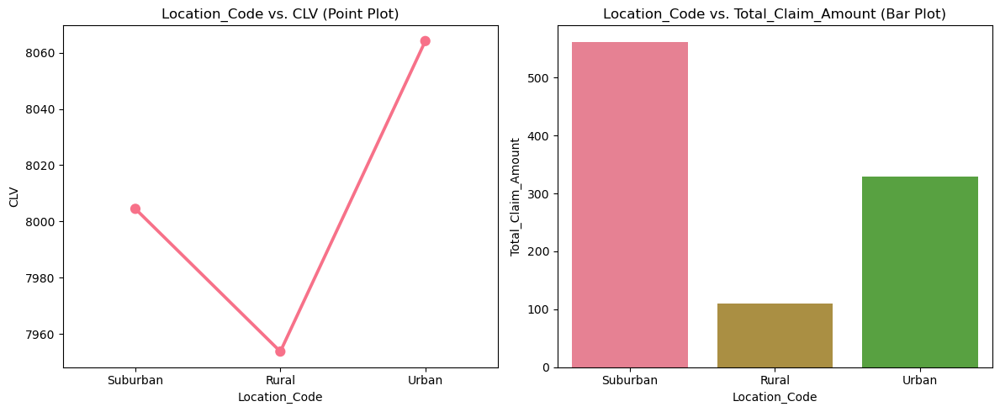

In [82]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.pointplot(x=clv_df['Location_Code'], y=clv_df['CLV'], ax=axes[0], ci=None)
axes[0].set_title('Location_Code vs. CLV (Point Plot)')

sns.barplot(x=clv_df['Location_Code'], y=clv_df['Total_Claim_Amount'], ax=axes[1], ci=None)
axes[1].set_title('Location_Code vs. Total_Claim_Amount (Bar Plot)')

plt.tight_layout()

plt.show()


<h2 style="color:orangered">Observation : All the 3 categories of location code are important in terms of CLV, rural customers are the most less likely to claim the insurance.</h2>

## 3.2.10 Marital Status

In [83]:
clv_df['Marital_Status'].value_counts()

Married     5298
Single      2467
Divorced    1369
Name: Marital_Status, dtype: int64

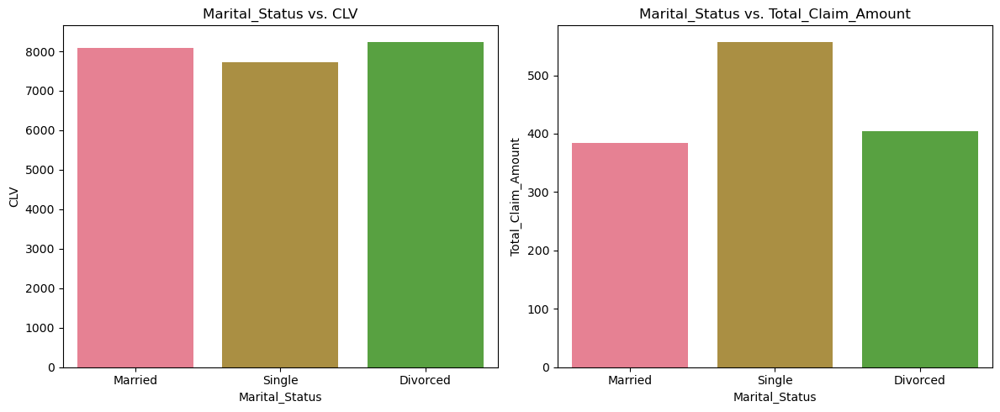

In [84]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Create the first subplot on the left
sns.barplot(x=clv_df['Marital_Status'],y=clv_df['CLV'], ax=axes[0],ci=None)
axes[0].set_title('Marital_Status vs. CLV')

# Create the second subplot on the right
sns.barplot(x=clv_df['Marital_Status'],y=clv_df['Total_Claim_Amount'], ax=axes[1],ci=None)
axes[1].set_title('Marital_Status vs. Total_Claim_Amount')

# Adjust spacing between subplots
plt.tight_layout()

# Show the combined figure with both subplots
plt.show()


<h2 style="color:orangered">Observation : This is not affecting the CLV value.</h2>

## 3.2.11 Policy Type

In [85]:
clv_df['Policy_Type'].value_counts()

Personal Auto     6788
Corporate Auto    1968
Special Auto       378
Name: Policy_Type, dtype: int64

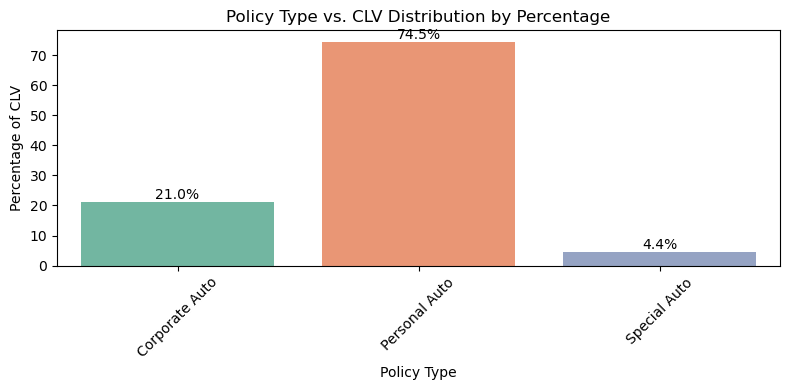

In [86]:
percentage_by_policy_type = (clv_df.groupby('Policy_Type')['CLV'].sum() / clv_df['CLV'].sum()) * 100

plt.figure(figsize=(8, 4))
ax = sns.barplot(x=percentage_by_policy_type.index, y=percentage_by_policy_type.values, palette='Set2', ci=None)

for p in ax.patches:
    percentage = f'{p.get_height():.1f}%'
    x_pos = p.get_x() + p.get_width() / 2
    y_pos = p.get_height()
    ax.annotate(percentage, (x_pos, y_pos), ha='center', va='bottom', fontsize=10)

plt.title('Policy Type vs. CLV Distribution by Percentage')
plt.xlabel('Policy Type')
plt.ylabel('Percentage of CLV')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<h2 style="color:orangered">Observation : Total 6788 customers are having personal auto as their policy type hence they will be having more profitable to the company.</h2>

## 3.2.12 Policy

In [87]:
clv_df['Policy'].value_counts()

Personal L3     3426
Personal L2     2122
Personal L1     1240
Corporate L3    1014
Corporate L2     595
Corporate L1     359
Special L2       164
Special L3       148
Special L1        66
Name: Policy, dtype: int64

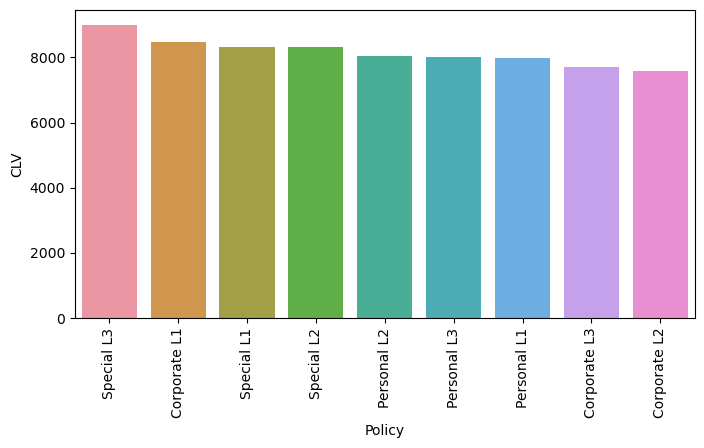

In [88]:
policy_order = clv_df.groupby('Policy')['CLV'].mean().sort_values(ascending=False).index

plt.figure(figsize=(8, 4))
sns.barplot(x=clv_df['Policy'], y=clv_df['CLV'], ci=None, order=policy_order)
plt.xticks(rotation=90) 
plt.show()


## 3.2.13 Renew Offer Type

In [89]:
clv_df['Renew_Offer_Type'].value_counts()

Offer1    3752
Offer2    2926
Offer3    1432
Offer4    1024
Name: Renew_Offer_Type, dtype: int64

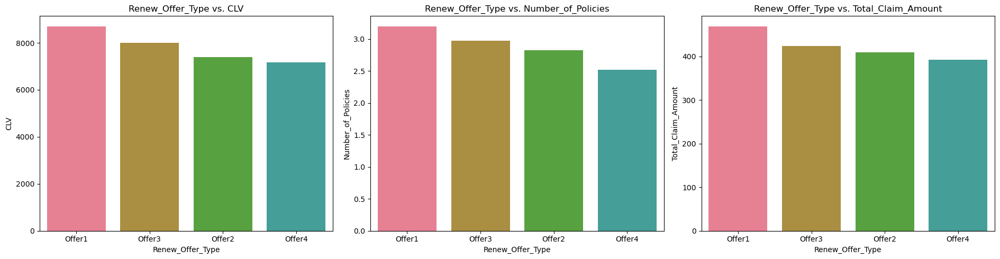

In [90]:
fig, axes = plt.subplots(1, 3, figsize=(19, 5))

sns.barplot(x=clv_df['Renew_Offer_Type'],y=clv_df['CLV'], ax=axes[0],ci=None)
axes[0].set_title('Renew_Offer_Type vs. CLV')

sns.barplot(x=clv_df['Renew_Offer_Type'],y=clv_df['Number_of_Policies'], ax=axes[1],ci=None)
axes[1].set_title('Renew_Offer_Type vs. Number_of_Policies')

sns.barplot(x=clv_df['Renew_Offer_Type'],y=clv_df['Total_Claim_Amount'], ax=axes[2],ci=None)
axes[2].set_title('Renew_Offer_Type vs. Total_Claim_Amount')

plt.tight_layout()

plt.show()


+----------------------------+-------------------------------------------+-------------------------------------------+
| Renew_Offer_Type vs. CLV   | Renew_Offer_Type vs. Number_of_Policies   | Renew_Offer_Type vs. Total_Claim_Amount   |
+============================+===========================================+===========================================+
| Higher CLV                 | More Number Of Policies                   | Total Claims                              |
+----------------------------+-------------------------------------------+-------------------------------------------+
| Offer-1                    | Offer-1                                   | Offer-1                                   |
+----------------------------+-------------------------------------------+-------------------------------------------+


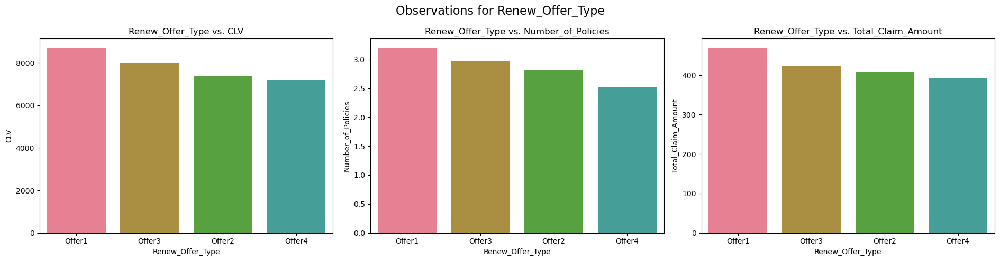

In [91]:
from tabulate import tabulate
from colorama import Fore, Style

fig, axes = plt.subplots(1, 3, figsize=(19, 5))

sns.barplot(x=clv_df['Renew_Offer_Type'], y=clv_df['CLV'], ax=axes[0], ci=None)
axes[0].set_title('Renew_Offer_Type vs. CLV')

sns.barplot(x=clv_df['Renew_Offer_Type'], y=clv_df['Number_of_Policies'], ax=axes[1], ci=None)
axes[1].set_title('Renew_Offer_Type vs. Number_of_Policies')

sns.barplot(x=clv_df['Renew_Offer_Type'], y=clv_df['Total_Claim_Amount'], ax=axes[2], ci=None)
axes[2].set_title('Renew_Offer_Type vs. Total_Claim_Amount')

fig.suptitle('Observations for Renew_Offer_Type', fontsize=16)

plt.tight_layout()

observed_info = [
    [Fore.CYAN + Style.BRIGHT + 'Renew_Offer_Type vs. CLV' + Style.RESET_ALL, Fore.CYAN + Style.BRIGHT + 'Renew_Offer_Type vs. Number_of_Policies' + Style.RESET_ALL, Fore.CYAN + Style.BRIGHT + 'Renew_Offer_Type vs. Total_Claim_Amount' + Style.RESET_ALL],
    [Fore.MAGENTA + Style.BRIGHT + 'Higher CLV' + Style.RESET_ALL, Fore.MAGENTA + Style.BRIGHT + 'More Number Of Policies' + Style.RESET_ALL, Fore.MAGENTA + Style.BRIGHT + 'Total Claims' + Style.RESET_ALL],
    [Fore.RED + Style.BRIGHT + 'Offer-1' + Style.RESET_ALL, Fore.RED + Style.BRIGHT + 'Offer-1' + Style.RESET_ALL, Fore.RED + Style.BRIGHT + 'Offer-1' + Style.RESET_ALL],
]

table = tabulate(observed_info, headers='firstrow', tablefmt='grid')
print(table)

plt.show()


<h2 style="color:orangered">Observation : Offer1 Policy is the most frequent one which got renewed and giving the highest CLV, number of policies and total claims also.</h2>

## 3.2.14 Sales Channel

In [92]:
clv_df['Sales_Channel'].value_counts()

Agent          3477
Branch         2567
Call Center    1765
Web            1325
Name: Sales_Channel, dtype: int64

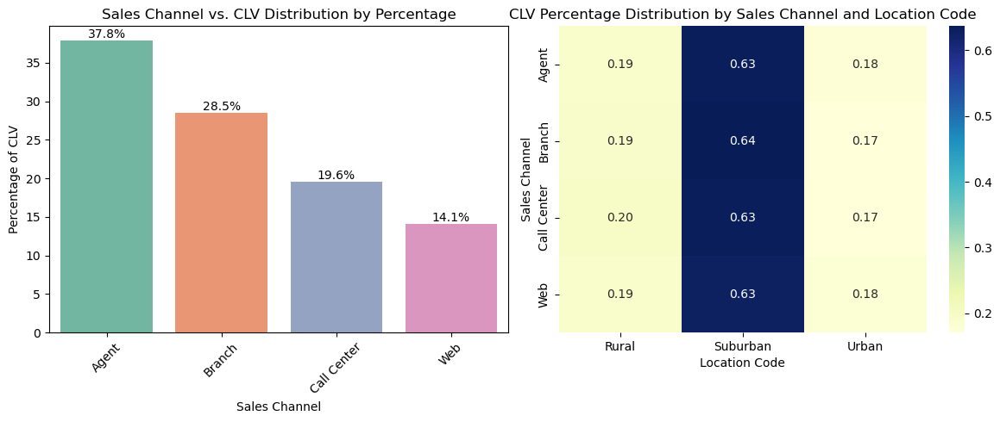

In [93]:
percentage_by_policy_type = (clv_df.groupby('Sales_Channel')['CLV'].sum() / clv_df['CLV'].sum()) * 100

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
ax = sns.barplot(x=percentage_by_policy_type.index, y=percentage_by_policy_type.values, palette='Set2', ci=None)

for p in ax.patches:
    percentage = f'{p.get_height():.1f}%'
    x_pos = p.get_x() + p.get_width() / 2
    y_pos = p.get_height()
    ax.annotate(percentage, (x_pos, y_pos), ha='center', va='bottom', fontsize=10)

plt.title('Sales Channel vs. CLV Distribution by Percentage')
plt.xlabel('Sales Channel')
plt.ylabel('Percentage of CLV')
plt.xticks(rotation=45)

total_clv = clv_df['CLV'].sum()

a= (clv_df['CLV'] / total_clv) * 100

cross_tab = pd.crosstab(index=clv_df['Sales_Channel'], columns=clv_df['Location_Code'], values=a, aggfunc='sum', normalize='index')

plt.subplot(1, 2, 2)
sns.heatmap(cross_tab, annot=True, cmap='YlGnBu', fmt=".2f")
plt.title('CLV Percentage Distribution by Sales Channel and Location Code')
plt.xlabel('Location Code')
plt.ylabel('Sales Channel')

plt.tight_layout()

plt.show()


## 3.2.15 Vehicle Class

In [94]:
clv_df['Vehicle_Class'].value_counts()

Four-Door Car    4621
Two-Door Car     1886
SUV              1796
Sports Car        484
Luxury SUV        184
Luxury Car        163
Name: Vehicle_Class, dtype: int64

In [95]:
clv_df['Vehicle_Class']

0        Two-Door Car
1       Four-Door Car
2        Two-Door Car
3                 SUV
4       Four-Door Car
            ...      
9129    Four-Door Car
9130    Four-Door Car
9131    Four-Door Car
9132    Four-Door Car
9133     Two-Door Car
Name: Vehicle_Class, Length: 9134, dtype: object

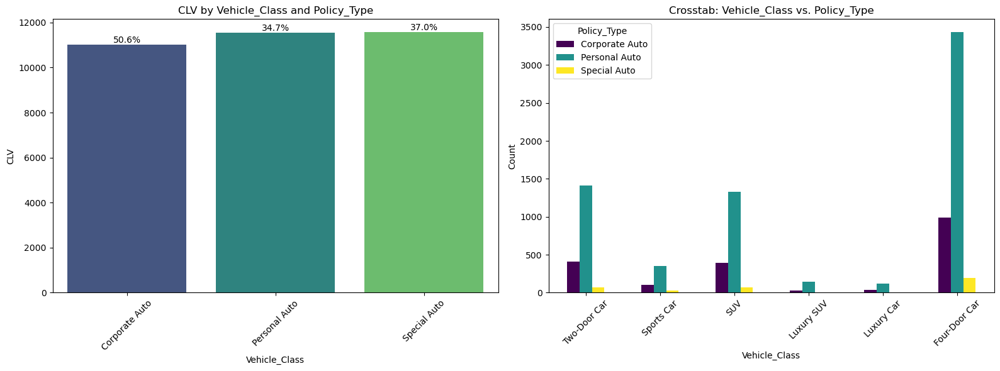

In [96]:
pivot_table = clv_df.pivot_table(values='CLV', index='Vehicle_Class', columns='Policy_Type', aggfunc='mean')

pivot_table = pivot_table.sort_index(ascending=False)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

ax1 = sns.barplot(data=pivot_table, ci=None, palette='viridis', ax=axes[0])

total = pivot_table.sum(axis=1)
for i, p in enumerate(ax1.patches):
    percentage = f'{100 * p.get_height() / total[i]:.1f}%'
    x_pos = p.get_x() + p.get_width() / 2
    y_pos = p.get_height()
    ax1.annotate(percentage, (x_pos, y_pos), ha='center', va='bottom')

ax1.set_xlabel('Vehicle_Class')
ax1.set_ylabel('CLV')
ax1.set_title('CLV by Vehicle_Class and Policy_Type')
ax1.tick_params(axis='x', rotation=45)

crosstab_df = pd.crosstab(clv_df['Vehicle_Class'], clv_df['Policy_Type']).sort_values(by='Vehicle_Class', ascending=False)
ax2 = crosstab_df.plot(kind='bar', ax=axes[1], rot=45, colormap='viridis')

ax2.set_xlabel('Vehicle_Class')
ax2.set_ylabel('Count')
ax2.set_title('Crosstab: Vehicle_Class vs. Policy_Type')

plt.tight_layout()

plt.show()


<h2 style="color:orangered">Observation : Customers having Luxury SUV and Luxury Car are the most profitable for the company as they're giving the highest CLV.</h2>

## 3.2.16 Vehicle Size

In [97]:
clv_df['Vehicle_Size'].value_counts()

Medsize    6424
Small      1764
Large       946
Name: Vehicle_Size, dtype: int64

<Axes: xlabel='Vehicle_Size', ylabel='CLV'>

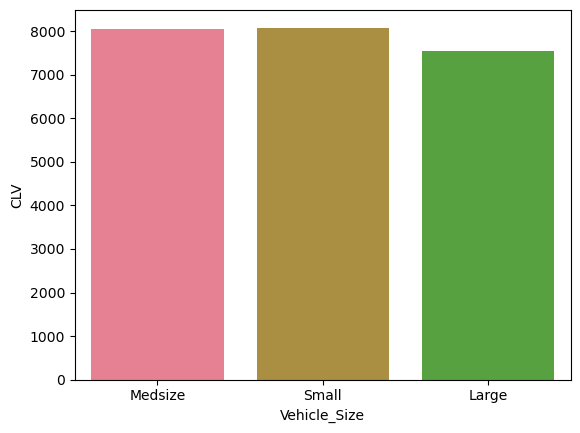

In [98]:
sns.barplot(x=clv_df['Vehicle_Size'],y=clv_df['CLV'],ci=None)

# Multivariate Analysis

## 3.2.2 State

In [99]:
clv_df['State'].value_counts()

California    3150
Oregon        2601
Arizona       1703
Nevada         882
Washington     798
Name: State, dtype: int64

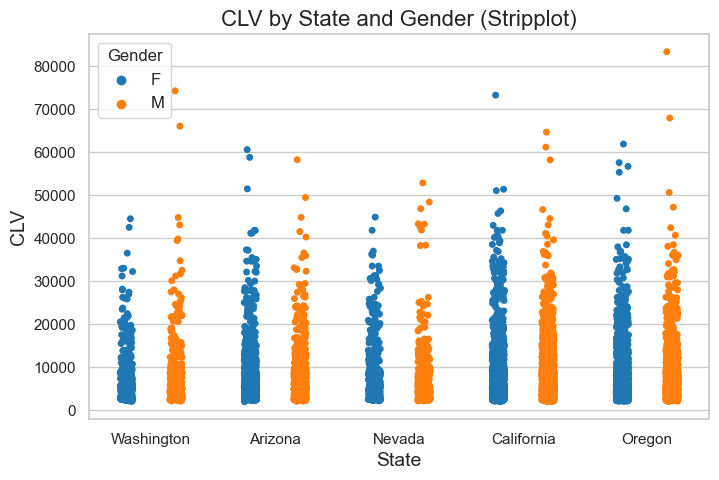

In [100]:
custom_palette = ['#1f77b4', '#ff7f0e'] 

sns.set(style="whitegrid")

plt.figure(figsize=(8, 5))
sns.stripplot(x="State", y="CLV", hue="Gender", data=clv_df, palette=custom_palette, jitter=True, dodge=True)

plt.xlabel("State", fontsize=14)
plt.ylabel("CLV", fontsize=14)
plt.title("CLV by State and Gender (Stripplot)", fontsize=16)

plt.legend(title="Gender", title_fontsize=12, fontsize=12)

plt.show()


<h2 style="color:orangered">Observation : CLV value for each of these category is similar over here irrespective of their customer base depending on States.</h2> 

## 3.2.3 Response

In [101]:
clv_df['Response'].value_counts()

No     7826
Yes    1308
Name: Response, dtype: int64

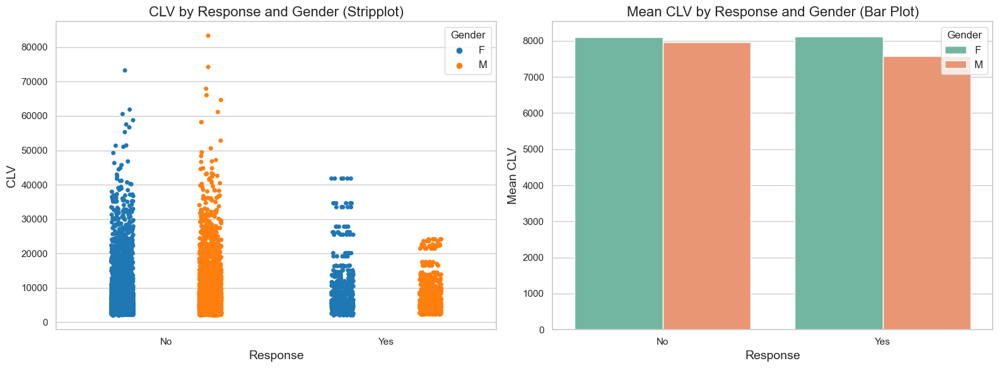

In [102]:
custom_palette = ['#1f77b4', '#ff7f0e']
sns.set(style="whitegrid")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.stripplot(x="Response", y="CLV", hue="Gender", data=clv_df, palette=custom_palette, jitter=True, dodge=True, ax=axes[0])
axes[0].set_xlabel("Response", fontsize=14)
axes[0].set_ylabel("CLV", fontsize=14)
axes[0].set_title("CLV by Response and Gender (Stripplot)", fontsize=16)
axes[0].legend(title="Gender", title_fontsize=12, fontsize=12)

sns.barplot(x="Response", y="CLV", hue="Gender", data=clv_df, palette="Set2", ci=None, ax=axes[1])
axes[1].set_xlabel("Response", fontsize=14)
axes[1].set_ylabel("Mean CLV", fontsize=14)
axes[1].set_title("Mean CLV by Response and Gender (Bar Plot)", fontsize=16)
axes[1].legend(title="Gender", title_fontsize=12, fontsize=12)

plt.tight_layout()

plt.show()


<h2 style="color:orangered">Conclusion : It's possible that while there are more "No" responses, the "Yes" responses represent a group of customers who, although smaller in number, generate significantly higher revenue or profits for the company. Quality customer responses can outweigh the quantity in terms of CLV. Furthermore,  Consider whether the CLV calculation takes into account future customer value. It's possible that the "No" responders have a lower initial value but exhibit higher retention rates or longer customer lifetimes, ultimately contributing more over time.</h2> 

## 3.2.4 Coverage

In [103]:
clv_df['Coverage'].value_counts()

Basic       5568
Extended    2742
Premium      824
Name: Coverage, dtype: int64

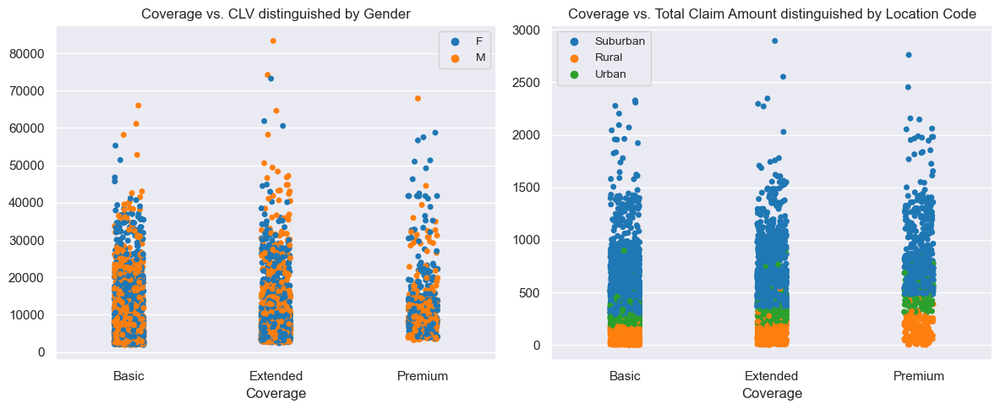

In [104]:
# Define a custom color palette with darker colors
custom_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

# Set a dark background style
sns.set_style("darkgrid")

# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot the first Stripplot with dark colors
sns.stripplot(x="Coverage", y="CLV", hue='Gender', data=clv_df, ax=axes[0], palette=custom_palette)
axes[0].set_title('Coverage vs. CLV distinguished by Gender')

# Plot the second Stripplot with dark colors
sns.stripplot(x="Coverage", y="Total_Claim_Amount", hue='Location_Code', data=clv_df, ax=axes[1], palette=custom_palette)
axes[1].set_title('Coverage vs. Total Claim Amount distinguished by Location Code')

# Set labels and legends
for ax in axes:
    ax.set_xlabel("Coverage", fontsize=12)
    ax.set_ylabel("", fontsize=12)
    ax.legend(title="", title_fontsize=10, fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()

# Show the combined figure with both subplots
plt.show()


## 3.2.5 Education

In [105]:
clv_df['Education'].value_counts()

Bachelor                2748
College                 2681
High School or Below    2622
Master                   741
Doctor                   342
Name: Education, dtype: int64

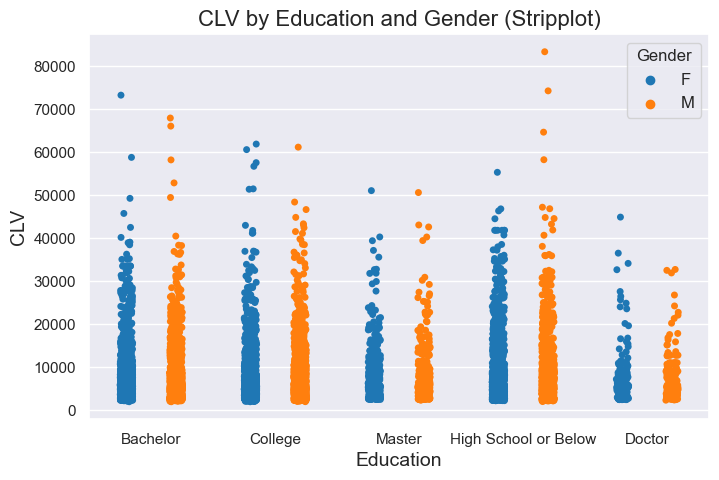

In [106]:
custom_palette = ['#1f77b4', '#ff7f0e']

sns.set_style("darkgrid")

plt.figure(figsize=(8, 5))
sns.stripplot(x="Education", y="CLV", hue="Gender", data=clv_df, palette=custom_palette, jitter=True, dodge=True)

plt.xlabel("Education", fontsize=14)
plt.ylabel("CLV", fontsize=14)
plt.title("CLV by Education and Gender (Stripplot)", fontsize=16)

plt.legend(title="Gender", title_fontsize=12, fontsize=12)

plt.show()


## 3.2.6 Effective To Date

<h3 style='color:darkblue'>We are going to drop this feature as it doesn't hold much important information.</h3>

## 3.2.7 Employement Status

In [107]:
clv_df['EmploymentStatus'].value_counts()

Employed         5698
Unemployed       2317
Medical Leave     432
Disabled          405
Retired           282
Name: EmploymentStatus, dtype: int64

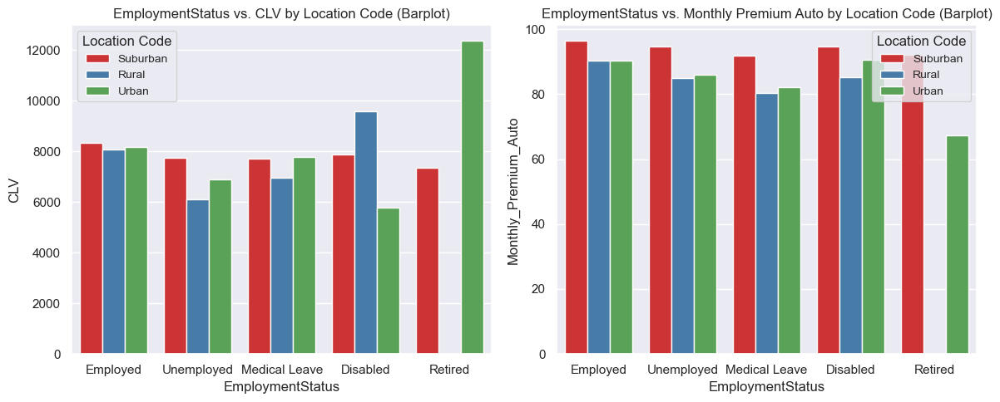

In [108]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.barplot(x='EmploymentStatus', y='CLV', hue='Location_Code', data=clv_df, ax=axes[0], ci=None, palette='Set1')
axes[0].set_title('EmploymentStatus vs. CLV by Location Code (Barplot)')

sns.barplot(x='EmploymentStatus', y='Monthly_Premium_Auto', hue='Location_Code', data=clv_df, ax=axes[1], ci=None, palette='Set1')
axes[1].set_title('EmploymentStatus vs. Monthly Premium Auto by Location Code (Barplot)')

axes[0].legend(title='Location Code', title_fontsize=12, fontsize=10)
axes[1].legend(title='Location Code', title_fontsize=12, fontsize=10)

plt.tight_layout()

plt.show()


## 3.2.8 Gender

In [109]:
clv_df['Gender'].value_counts()

F    4658
M    4476
Name: Gender, dtype: int64

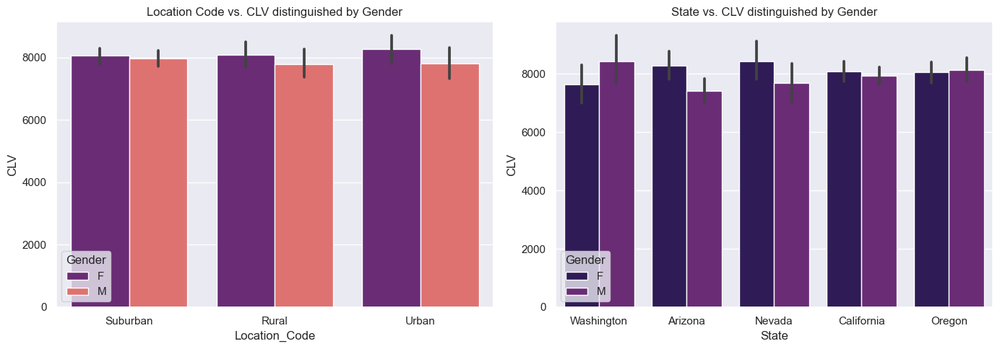

In [110]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Create a custom color palette for the plots
custom_palette_1 = sns.color_palette('magma', len(clv_df['Gender'].unique()))
custom_palette_2 = sns.color_palette('magma', len(clv_df['State'].unique()))

# Create the first subplot on the left with a custom palette using bar plots
sns.barplot(x='Location_Code', y='CLV', hue='Gender', data=clv_df, ax=axes[0], palette=custom_palette_1)
axes[0].set_title('Location Code vs. CLV distinguished by Gender')

# Create the second subplot on the right with a custom palette using bar plots
sns.barplot(x='State', y='CLV', hue='Gender', data=clv_df, ax=axes[1], palette=custom_palette_2)
axes[1].set_title('State vs. CLV distinguished by Gender')

# Adjust spacing between subplots
plt.tight_layout()

# Show the combined figure with both subplots
plt.show()


## 3.2.9 Location Code

In [111]:
clv_df['Location_Code'].value_counts()

Suburban    5779
Rural       1773
Urban       1582
Name: Location_Code, dtype: int64

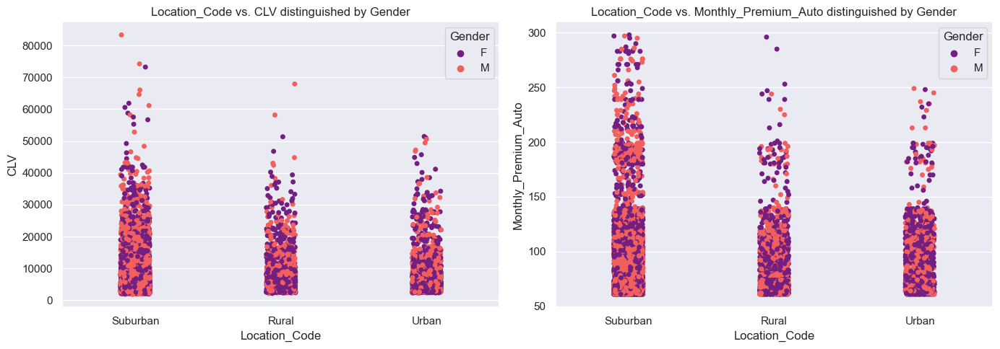

In [112]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

custom_palette_1 = sns.color_palette('magma', len(clv_df['Gender'].unique()))

sns.stripplot(x='Location_Code',y='CLV', hue = 'Gender',data=clv_df, ax=axes[0],palette=custom_palette_1)
axes[0].set_title('Location_Code vs. CLV distinguished by Gender')

sns.stripplot(x='Location_Code',y='Monthly_Premium_Auto',hue = 'Gender',data=clv_df, ax=axes[1],palette=custom_palette_1)
axes[1].set_title('Location_Code vs. Monthly_Premium_Auto distinguished by Gender')

plt.tight_layout()

plt.show()


<h2 style="color:orangered">Observation : Suburban customers are more important as they are gaining more CLV and more monthly premium as well.</h2>

## 3.2.10 Marital Status

In [113]:
clv_df['Marital_Status'].value_counts()

Married     5298
Single      2467
Divorced    1369
Name: Marital_Status, dtype: int64

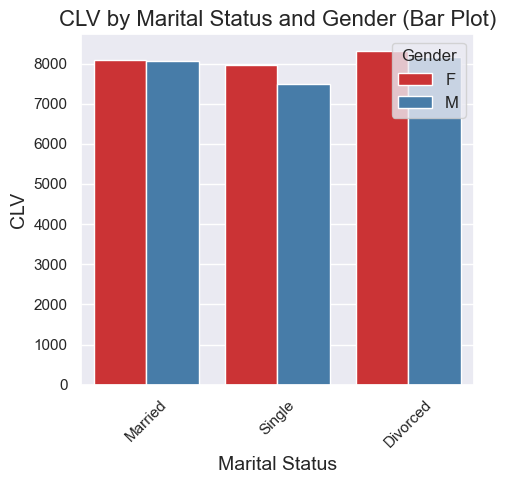

In [114]:
custom_palette = sns.color_palette('Set1', len(clv_df['Gender'].unique()))

plt.figure(figsize=(5, 5))
sns.barplot(x='Marital_Status', y='CLV', hue='Gender', data=clv_df, palette=custom_palette, ci=None)

plt.xlabel("Marital Status", fontsize=14)
plt.ylabel("CLV", fontsize=14)
plt.title("CLV by Marital Status and Gender (Bar Plot)", fontsize=16)
plt.legend(title="Gender", title_fontsize=12, fontsize=12)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## 3.2.11 Policy Type

In [115]:
clv_df['Policy_Type'].value_counts()

Personal Auto     6788
Corporate Auto    1968
Special Auto       378
Name: Policy_Type, dtype: int64

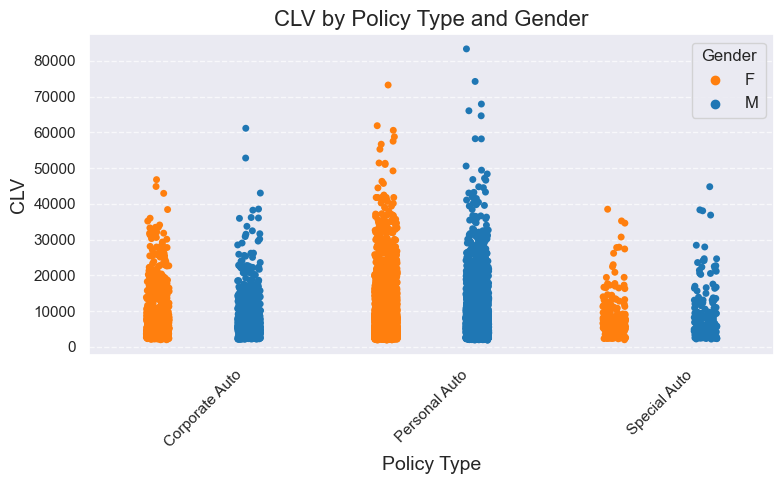

In [116]:
custom_palette = {'F': '#ff7f0e', 'M': '#1f77b4'} 

plt.figure(figsize=(8, 5))
sns.stripplot(x="Policy_Type", y="CLV", hue="Gender", data=clv_df, palette=custom_palette, dodge=True, jitter=True)

plt.xlabel("Policy Type", fontsize=14)
plt.ylabel("CLV", fontsize=14)
plt.title("CLV by Policy Type and Gender", fontsize=16)
plt.legend(title="Gender", title_fontsize=12, fontsize=12, loc="upper right")

plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.show()

<h2 style="color:orangered">Observation : Total 6788 customers are having personal auto as their policy type hence they will be more profitable to the company.</h2>

## 3.2.12 Policy

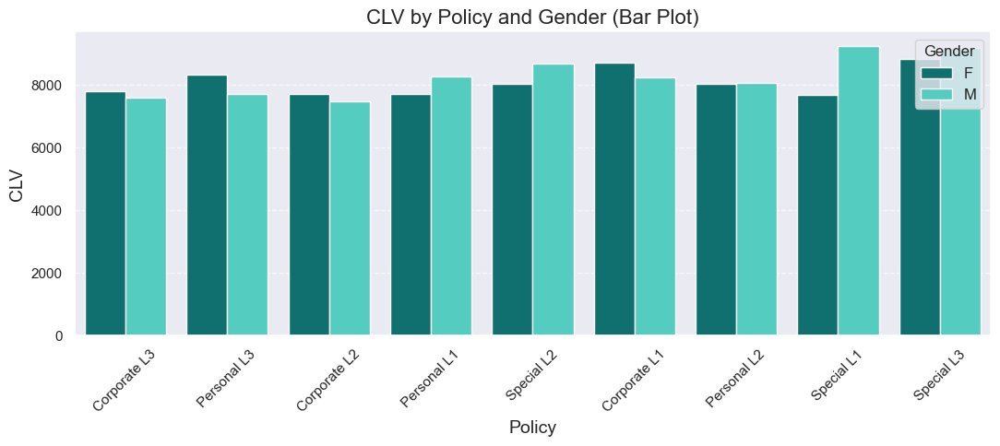

In [117]:
custom_palette = {'F': '#008080', 'M': '#40E0D0'}  # Custom colors for Gender (Orange for Female, Green for Male)

plt.figure(figsize=(11, 5))
sns.barplot(x="Policy", y="CLV", hue="Gender", data=clv_df, palette=custom_palette, ci=None)

plt.xlabel("Policy", fontsize=14)
plt.ylabel("CLV", fontsize=14)
plt.title("CLV by Policy and Gender (Bar Plot)", fontsize=16)
plt.legend(title="Gender", title_fontsize=12, fontsize=12, loc="upper right")

plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.show()


## 3.2.13 Renew Offer Type

In [118]:
clv_df['Renew_Offer_Type'].value_counts()

Offer1    3752
Offer2    2926
Offer3    1432
Offer4    1024
Name: Renew_Offer_Type, dtype: int64

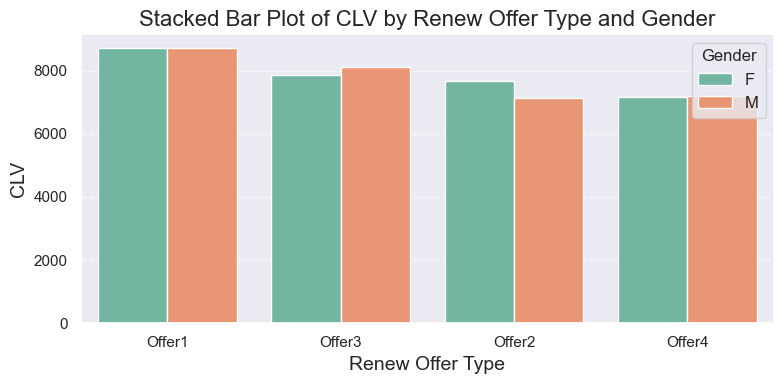

In [119]:
plt.figure(figsize=(8, 4))
sns.barplot(x="Renew_Offer_Type", y="CLV", hue="Gender", data=clv_df, palette="Set2", ci=None)

plt.xlabel("Renew Offer Type", fontsize=14)
plt.ylabel("CLV", fontsize=14)
plt.title("Stacked Bar Plot of CLV by Renew Offer Type and Gender", fontsize=16)
plt.legend(title="Gender", title_fontsize=12, fontsize=12, loc="upper right")

plt.xticks(rotation=0)
plt.tight_layout()
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.show()


<h2 style="color:orangered">Observation : Both the Male & Female customers are opting for Offer1 policy renew.</h2>

## 3.2.14 Sales Channel

In [120]:
clv_df['Sales_Channel'].value_counts()

Agent          3477
Branch         2567
Call Center    1765
Web            1325
Name: Sales_Channel, dtype: int64

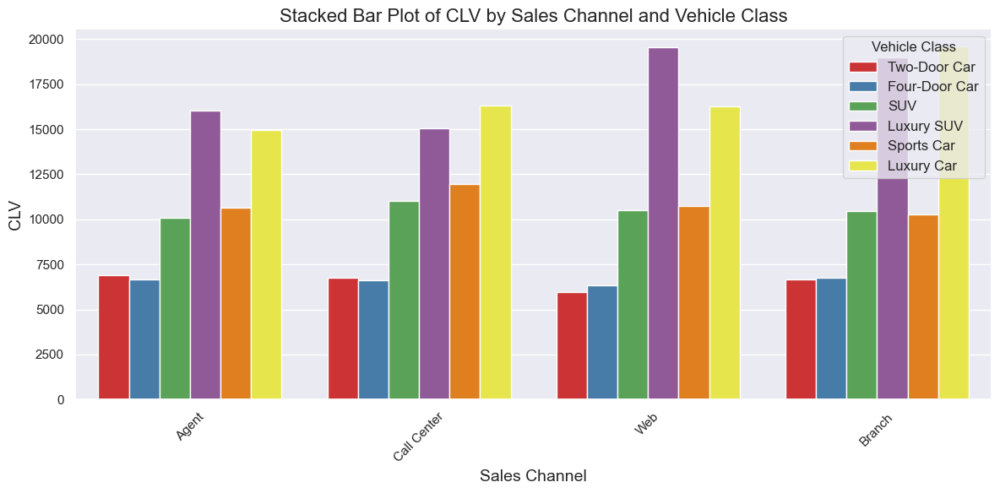

In [121]:
plt.figure(figsize=(12, 6))
sns.barplot(x="Sales_Channel", y="CLV", hue="Vehicle_Class", data=clv_df, palette="Set1", ci=None)

plt.xlabel("Sales Channel", fontsize=14)
plt.ylabel("CLV", fontsize=14)
plt.title("Stacked Bar Plot of CLV by Sales Channel and Vehicle Class", fontsize=16)
plt.legend(title="Vehicle Class", title_fontsize=12, fontsize=12, loc="upper right")

plt.xticks(rotation=45)
plt.tight_layout()

plt.show()


<h2 style="color:orangered">Observation : Majority of the customer base is coming from Agents for all vehicle type.</h2>

## 3.2.15 Vehicle Class

In [122]:
clv_df['Vehicle_Class'].value_counts()

Four-Door Car    4621
Two-Door Car     1886
SUV              1796
Sports Car        484
Luxury SUV        184
Luxury Car        163
Name: Vehicle_Class, dtype: int64

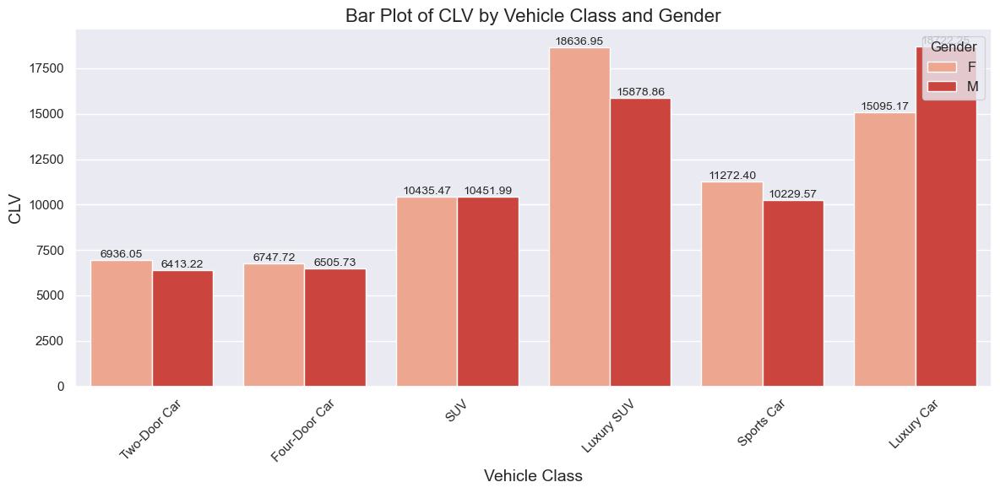

In [123]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x="Vehicle_Class", y="CLV", hue="Gender", data=clv_df, palette="Reds", ci=None)

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f"{height:.2f}", (p.get_x() + p.get_width() / 2, height), ha="center", va="bottom", fontsize=10)

plt.xlabel("Vehicle Class", fontsize=14)
plt.ylabel("CLV", fontsize=14)
plt.title("Bar Plot of CLV by Vehicle Class and Gender", fontsize=16)
plt.legend(title="Gender", title_fontsize=12, fontsize=12, loc="upper right")

plt.xticks(rotation=45)
plt.tight_layout()

plt.show()


## 3.2.16 Vehicle Size

In [124]:
clv_df['Vehicle_Size'].value_counts()

Medsize    6424
Small      1764
Large       946
Name: Vehicle_Size, dtype: int64

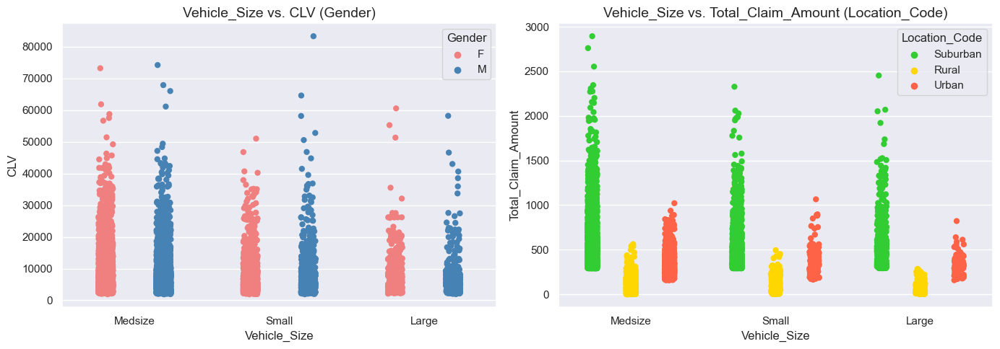

In [125]:
gender_palette = {'F': 'lightcoral', 'M': 'steelblue'}
location_palette = {'Suburban': 'limegreen', 'Rural': 'gold', 'Urban': 'tomato'}

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sns.stripplot(
    x='Vehicle_Size',
    y='CLV',
    hue='Gender',
    data=clv_df,
    ax=axes[0],
    palette=gender_palette,
    dodge=True,  
    jitter=True,  
    size=6, 
)
axes[0].set_title('Vehicle_Size vs. CLV (Gender)', fontsize=14)

sns.stripplot(
    x='Vehicle_Size',
    y='Total_Claim_Amount',
    hue='Location_Code',
    data=clv_df,
    ax=axes[1],
    palette=location_palette,
    dodge=True,
    jitter=True,
    size=6,
)
axes[1].set_title('Vehicle_Size vs. Total_Claim_Amount (Location_Code)', fontsize=14)

plt.tight_layout()

plt.show()


<h2 style="color:orangered">Conclusion : Customers with Medium Sized Vehicles are generating more CLV and customers with medsize vehicle from rural area are very lesser to claim the insurance.</h2>

<h3 style="color:darkblue">Encoding The Feature</h3>

In [163]:
clv_df = pd.get_dummies(clv_df, columns = ['State'])
clv_df.head()

,Customer,CLV,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location_Code,...,Renew_Offer_Type,Sales_Channel,Total_Claim_Amount,Vehicle_Class,Vehicle_Size,State_Arizona,State_California,State_Nevada,State_Oregon,State_Washington
0,BU79786,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,...,Offer1,Agent,384.811147,Two-Door Car,Medsize,0,0,0,0,1
1,QZ44356,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,...,Offer3,Agent,1131.464935,Four-Door Car,Medsize,1,0,0,0,0
2,AI49188,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,...,Offer1,Agent,566.472247,Two-Door Car,Medsize,0,0,1,0,0
3,WW63253,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,...,Offer1,Call Center,529.881344,SUV,Medsize,0,1,0,0,0
4,HB64268,2813.692575,No,Basic,Bachelor,3/2/2011,Employed,M,43836,Rural,...,Offer1,Agent,138.130879,Four-Door Car,Medsize,0,0,0,0,1


## 3.2.3 Response

In [164]:
clv_df['Response']

0        No
1        No
2        No
3        No
4        No
       ... 
9129     No
9130    Yes
9131     No
9132     No
9133     No
Name: Response, Length: 9134, dtype: object

In [165]:
clv_df['Response'].value_counts()

No     7826
Yes    1308
Name: Response, dtype: int64

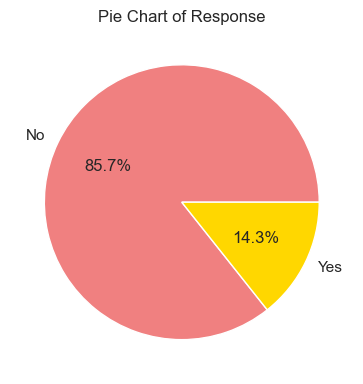

In [166]:
response_counts = clv_df['Response'].value_counts()

response_palette = {'No': 'lightcoral', 'Yes': 'gold'}

plt.figure(figsize=(7, 4))
plt.pie(response_counts, labels=response_counts.index, autopct='%1.1f%%', colors=[response_palette[cat] for cat in response_counts.index])
plt.title('Pie Chart of Response')

plt.tight_layout()
plt.show()


<h2 style="color:orangered">Conclusion : It appears that the outreach efforts through marketing calls garnered responses from a subset of the customer base, totaling fewer than 1,400 individuals.</h2> 

<h3 style="color:darkblue">Encoding The Feature</h3>

In [167]:
clv_df['Response'].replace({'No':0,'Yes':1},inplace=True)
clv_df.head()

,Customer,CLV,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location_Code,...,Renew_Offer_Type,Sales_Channel,Total_Claim_Amount,Vehicle_Class,Vehicle_Size,State_Arizona,State_California,State_Nevada,State_Oregon,State_Washington
0,BU79786,2763.519279,0,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,...,Offer1,Agent,384.811147,Two-Door Car,Medsize,0,0,0,0,1
1,QZ44356,6979.535903,0,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,...,Offer3,Agent,1131.464935,Four-Door Car,Medsize,1,0,0,0,0
2,AI49188,12887.431650,0,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,...,Offer1,Agent,566.472247,Two-Door Car,Medsize,0,0,1,0,0
3,WW63253,7645.861827,0,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,...,Offer1,Call Center,529.881344,SUV,Medsize,0,1,0,0,0
4,HB64268,2813.692575,0,Basic,Bachelor,3/2/2011,Employed,M,43836,Rural,...,Offer1,Agent,138.130879,Four-Door Car,Medsize,0,0,0,0,1


## 3.2.4 Coverage

In [168]:
clv_df['Coverage']

0          Basic
1       Extended
2        Premium
3          Basic
4          Basic
          ...   
9129       Basic
9130    Extended
9131    Extended
9132    Extended
9133    Extended
Name: Coverage, Length: 9134, dtype: object

In [169]:
clv_df['Coverage'].value_counts()

Basic       5568
Extended    2742
Premium      824
Name: Coverage, dtype: int64

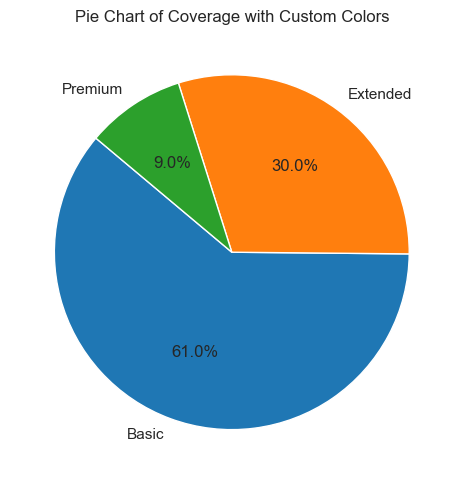

In [170]:
coverage_counts = clv_df['Coverage'].value_counts()

custom_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

plt.figure(figsize=(8, 5))
plt.pie(coverage_counts, labels=coverage_counts.index, autopct='%1.1f%%', startangle=140, colors=custom_colors)
plt.title('Pie Chart of Coverage with Custom Colors')

plt.tight_layout()
plt.show()


<h3 style="color:darkblue">Encoding The Feature</h3>

In [171]:
clv_df = pd.get_dummies(clv_df, columns = ['Coverage'])
clv_df.head()

,Customer,CLV,Response,Education,Effective To Date,EmploymentStatus,Gender,Income,Location_Code,Marital_Status,...,Vehicle_Class,Vehicle_Size,State_Arizona,State_California,State_Nevada,State_Oregon,State_Washington,Coverage_Basic,Coverage_Extended,Coverage_Premium
0,BU79786,2763.519279,0,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,...,Two-Door Car,Medsize,0,0,0,0,1,1,0,0
1,QZ44356,6979.535903,0,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,...,Four-Door Car,Medsize,1,0,0,0,0,0,1,0
2,AI49188,12887.431650,0,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,...,Two-Door Car,Medsize,0,0,1,0,0,0,0,1
3,WW63253,7645.861827,0,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,...,SUV,Medsize,0,1,0,0,0,1,0,0
4,HB64268,2813.692575,0,Bachelor,3/2/2011,Employed,M,43836,Rural,Single,...,Four-Door Car,Medsize,0,0,0,0,1,1,0,0


## 3.2.5 Education

In [172]:
clv_df['Education']

0       Bachelor
1       Bachelor
2       Bachelor
3       Bachelor
4       Bachelor
          ...   
9129    Bachelor
9130     College
9131    Bachelor
9132     College
9133     College
Name: Education, Length: 9134, dtype: object

In [173]:
clv_df['Education'].value_counts()

Bachelor                2748
College                 2681
High School or Below    2622
Master                   741
Doctor                   342
Name: Education, dtype: int64

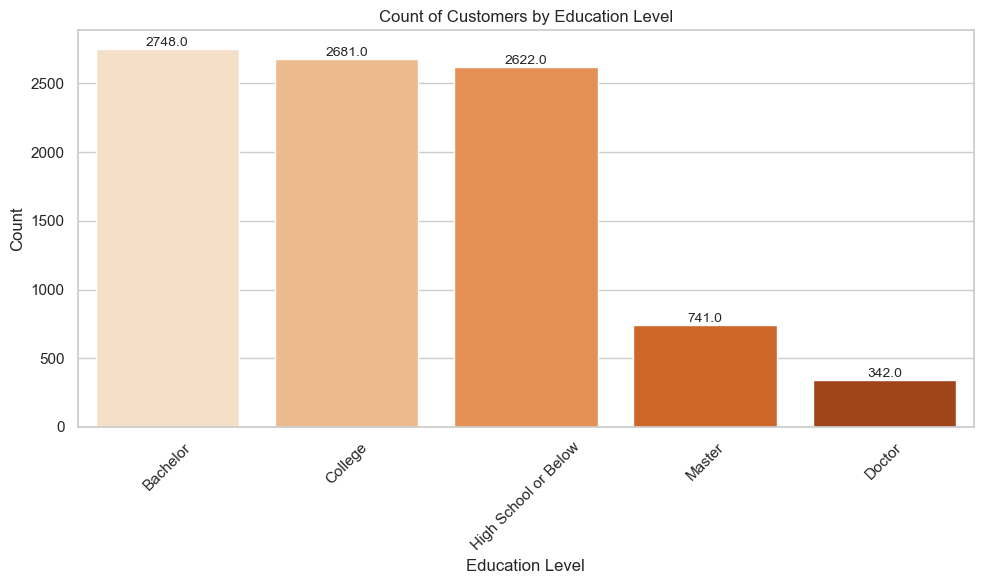

In [174]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
education_order = clv_df['Education'].value_counts().index 
ax = sns.countplot(x=clv_df['Education'], order=education_order, palette='Oranges')

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height}', (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize=10)

plt.xlabel('Education Level')
plt.ylabel('Count')
plt.title('Count of Customers by Education Level')
plt.xticks(rotation=45) 

plt.tight_layout()
plt.show()


<h3 style="color:darkblue">Encoding The Feature</h3>

In [175]:
clv_df['Education'].replace({'High School or Below': 0,'College': 1,'Bachelor': 2,'Master': 3,'Doctor': 4},inplace=True)
clv_df.head()

,Customer,CLV,Response,Education,Effective To Date,EmploymentStatus,Gender,Income,Location_Code,Marital_Status,...,Vehicle_Class,Vehicle_Size,State_Arizona,State_California,State_Nevada,State_Oregon,State_Washington,Coverage_Basic,Coverage_Extended,Coverage_Premium
0,BU79786,2763.519279,0,2,2/24/11,Employed,F,56274,Suburban,Married,...,Two-Door Car,Medsize,0,0,0,0,1,1,0,0
1,QZ44356,6979.535903,0,2,1/31/11,Unemployed,F,0,Suburban,Single,...,Four-Door Car,Medsize,1,0,0,0,0,0,1,0
2,AI49188,12887.431650,0,2,2/19/11,Employed,F,48767,Suburban,Married,...,Two-Door Car,Medsize,0,0,1,0,0,0,0,1
3,WW63253,7645.861827,0,2,1/20/11,Unemployed,M,0,Suburban,Married,...,SUV,Medsize,0,1,0,0,0,1,0,0
4,HB64268,2813.692575,0,2,3/2/2011,Employed,M,43836,Rural,Single,...,Four-Door Car,Medsize,0,0,0,0,1,1,0,0


## 3.2.6 Effective To Date

<h3 style='color:darkblue'>We are going to drop this feature as it doesn't hold much important information.</h3>

## 3.2.7 Employement Status

In [176]:
clv_df['EmploymentStatus']

0         Employed
1       Unemployed
2         Employed
3       Unemployed
4         Employed
           ...    
9129      Employed
9130      Employed
9131    Unemployed
9132      Employed
9133    Unemployed
Name: EmploymentStatus, Length: 9134, dtype: object

In [177]:
clv_df['EmploymentStatus'].value_counts()

Employed         5698
Unemployed       2317
Medical Leave     432
Disabled          405
Retired           282
Name: EmploymentStatus, dtype: int64

<Axes: xlabel='EmploymentStatus', ylabel='count'>

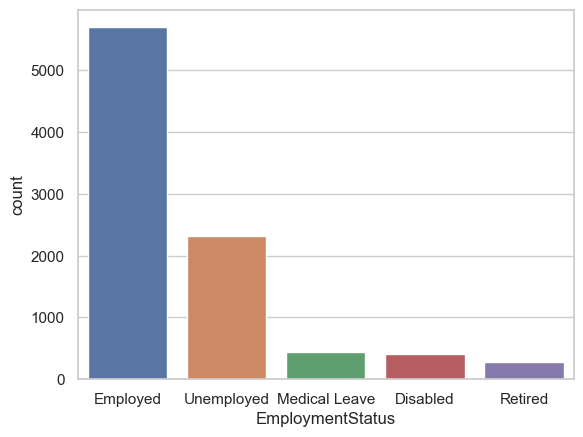

In [178]:
sns.countplot(x=clv_df['EmploymentStatus'])

<Axes: ylabel='EmploymentStatus'>

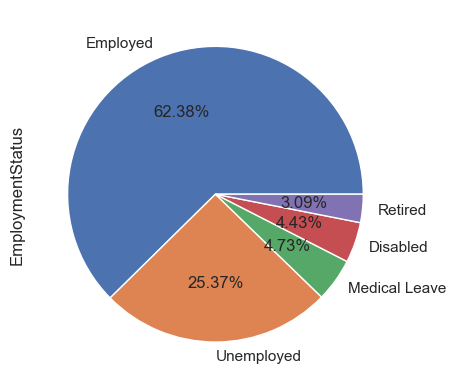

In [179]:
clv_df['EmploymentStatus'].value_counts().plot(kind='pie',autopct='%1.2f%%')

<h2 style="color:orangered">Observation : Total 5698 customers are employeed, which is in turn, more than 50% of our total customers.</h2>

<h3 style="color:darkblue">Encoding The Feature</h3>

In [180]:
clv_df = pd.get_dummies(clv_df,columns=['EmploymentStatus'])
clv_df.head()

,Customer,CLV,Response,Education,Effective To Date,Gender,Income,Location_Code,Marital_Status,Monthly_Premium_Auto,...,State_Oregon,State_Washington,Coverage_Basic,Coverage_Extended,Coverage_Premium,EmploymentStatus_Disabled,EmploymentStatus_Employed,EmploymentStatus_Medical Leave,EmploymentStatus_Retired,EmploymentStatus_Unemployed
0,BU79786,2763.519279,0,2,2/24/11,F,56274,Suburban,Married,69,...,0,1,1,0,0,0,1,0,0,0
1,QZ44356,6979.535903,0,2,1/31/11,F,0,Suburban,Single,94,...,0,0,0,1,0,0,0,0,0,1
2,AI49188,12887.431650,0,2,2/19/11,F,48767,Suburban,Married,108,...,0,0,0,0,1,0,1,0,0,0
3,WW63253,7645.861827,0,2,1/20/11,M,0,Suburban,Married,106,...,0,0,1,0,0,0,0,0,0,1
4,HB64268,2813.692575,0,2,3/2/2011,M,43836,Rural,Single,73,...,0,1,1,0,0,0,1,0,0,0


## 3.2.8 Gender

In [181]:
clv_df['Gender']

0       F
1       F
2       F
3       M
4       M
       ..
9129    M
9130    F
9131    M
9132    M
9133    M
Name: Gender, Length: 9134, dtype: object

In [182]:
clv_df['Gender'].value_counts()

F    4658
M    4476
Name: Gender, dtype: int64

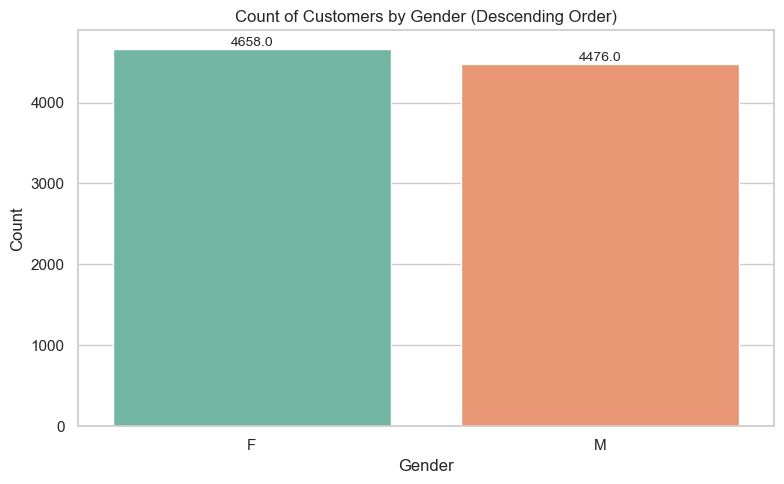

In [183]:
plt.figure(figsize=(8, 5))
sns.set(style="whitegrid")
gender_order = clv_df['Gender'].value_counts().index  
ax = sns.countplot(x=clv_df['Gender'], order=gender_order, palette='Set2')

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height}', (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize=10)

# Add labels and title
plt.xlabel('Gender')
plt.ylabel('Count')
plt.title('Count of Customers by Gender (Descending Order)')
plt.xticks(rotation=0)  # Rotate x-axis labels if needed

plt.tight_layout()
plt.show()


<h3 style="color:darkblue">Feature Encoding</h3>

In [184]:
clv_df['Gender'].replace({'F':1,'M':0},inplace=True)
clv_df.head()

,Customer,CLV,Response,Education,Effective To Date,Gender,Income,Location_Code,Marital_Status,Monthly_Premium_Auto,...,State_Oregon,State_Washington,Coverage_Basic,Coverage_Extended,Coverage_Premium,EmploymentStatus_Disabled,EmploymentStatus_Employed,EmploymentStatus_Medical Leave,EmploymentStatus_Retired,EmploymentStatus_Unemployed
0,BU79786,2763.519279,0,2,2/24/11,1,56274,Suburban,Married,69,...,0,1,1,0,0,0,1,0,0,0
1,QZ44356,6979.535903,0,2,1/31/11,1,0,Suburban,Single,94,...,0,0,0,1,0,0,0,0,0,1
2,AI49188,12887.431650,0,2,2/19/11,1,48767,Suburban,Married,108,...,0,0,0,0,1,0,1,0,0,0
3,WW63253,7645.861827,0,2,1/20/11,0,0,Suburban,Married,106,...,0,0,1,0,0,0,0,0,0,1
4,HB64268,2813.692575,0,2,3/2/2011,0,43836,Rural,Single,73,...,0,1,1,0,0,0,1,0,0,0


## 3.2.9 Location Code

In [185]:
clv_df['Location_Code']

0       Suburban
1       Suburban
2       Suburban
3       Suburban
4          Rural
          ...   
9129       Urban
9130    Suburban
9131    Suburban
9132    Suburban
9133    Suburban
Name: Location_Code, Length: 9134, dtype: object

In [186]:
clv_df['Location_Code'].value_counts()

Suburban    5779
Rural       1773
Urban       1582
Name: Location_Code, dtype: int64

NameError: name 'location_counts' is not defined

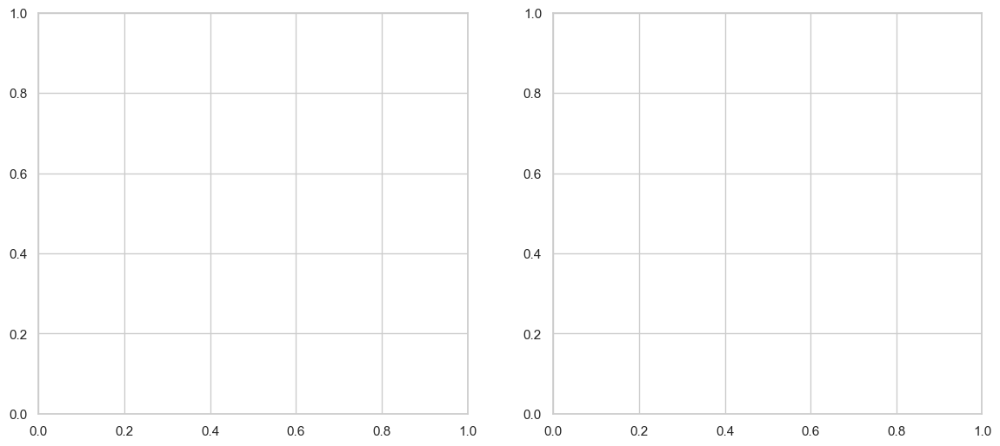

In [187]:
custom_palette = ['#ff9999', '#66b3ff', '#99ff99']

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].pie(location_counts, labels=location_counts.index, autopct='%1.1f%%', startangle=140, colors=custom_palette)
axes[0].set_title('Distribution of Location Code (Pie Chart)')

sns.set(style="whitegrid")
ax = sns.barplot(x=clv_df['Location_Code'], y=clv_df['CLV'], palette=custom_palette, ci=None, ax=axes[1])

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.2f}', (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize=10)

axes[1].set_xlabel('Location Code')
axes[1].set_ylabel('CLV')
axes[1].set_title('CLV by Location Code (Bar Plot)')

plt.tight_layout()
plt.show()


<h2 style="color:orangered">Observation : Most of the customers are from Suburban location but Suburban, Rural & Urban are giving nearly the same CLV value so they'll are equally important for us.</h2>

<h3 style="color:darkblue">Feature Encoding</h3>

In [188]:
clv_df = pd.get_dummies(clv_df,columns=['Location_Code'])
clv_df.head()

,Customer,CLV,Response,Education,Effective To Date,Gender,Income,Marital_Status,Monthly_Premium_Auto,Months_Since_Last_Claim,...,Coverage_Extended,Coverage_Premium,EmploymentStatus_Disabled,EmploymentStatus_Employed,EmploymentStatus_Medical Leave,EmploymentStatus_Retired,EmploymentStatus_Unemployed,Location_Code_Rural,Location_Code_Suburban,Location_Code_Urban
0,BU79786,2763.519279,0,2,2/24/11,1,56274,Married,69,32,...,0,0,0,1,0,0,0,0,1,0
1,QZ44356,6979.535903,0,2,1/31/11,1,0,Single,94,13,...,1,0,0,0,0,0,1,0,1,0
2,AI49188,12887.431650,0,2,2/19/11,1,48767,Married,108,18,...,0,1,0,1,0,0,0,0,1,0
3,WW63253,7645.861827,0,2,1/20/11,0,0,Married,106,18,...,0,0,0,0,0,0,1,0,1,0
4,HB64268,2813.692575,0,2,3/2/2011,0,43836,Single,73,12,...,0,0,0,1,0,0,0,1,0,0


## 3.2.10 Marital Status

In [189]:
clv_df['Marital_Status']

0        Married
1         Single
2        Married
3        Married
4         Single
          ...   
9129     Married
9130    Divorced
9131      Single
9132     Married
9133      Single
Name: Marital_Status, Length: 9134, dtype: object

In [190]:
clv_df['Marital_Status'].value_counts()

Married     5298
Single      2467
Divorced    1369
Name: Marital_Status, dtype: int64

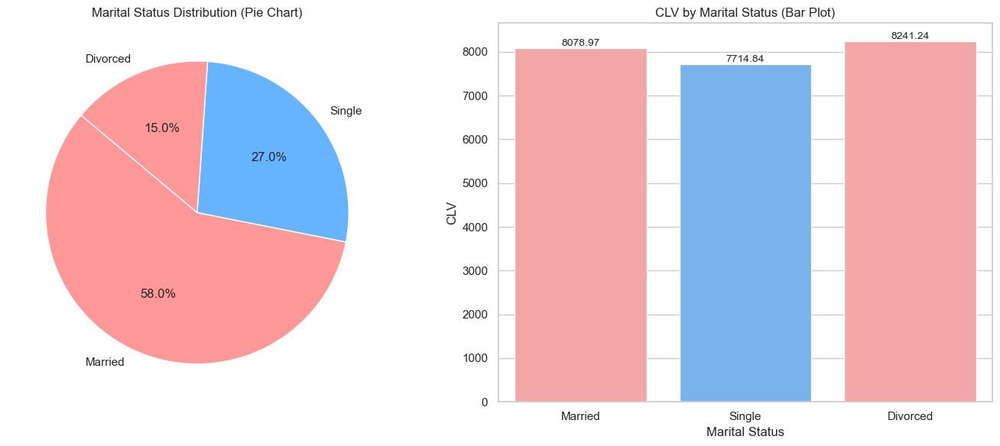

In [191]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

marital_status_counts = clv_df['Marital_Status'].value_counts()
axes[0].pie(marital_status_counts, labels=marital_status_counts.index, autopct='%1.1f%%', startangle=140, colors=['#ff9999', '#66b3ff'])
axes[0].set_title('Marital Status Distribution (Pie Chart)')

custom_palette = ['#ff9999', '#66b3ff']
ax = sns.barplot(x=clv_df['Marital_Status'], y=clv_df['CLV'], palette=custom_palette, ci=None, ax=axes[1])

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.2f}', (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize=10)

axes[1].set_xlabel('Marital Status')
axes[1].set_ylabel('CLV')
axes[1].set_title('CLV by Marital Status (Bar Plot)')

plt.tight_layout()
plt.show()


<h2 style="color:orangered">Observation : The company boasts a predominant clientele of married individuals, surpassing both the single and divorced customer segments. Intriguingly, the married and divorced customer segments exhibit a slightly higher Customer Lifetime Value (CLV) when contrasted with their single counterparts.</h2>

<h3 style="color:darkblue">Feature Encoding</h3>

In [192]:
clv_df = pd.get_dummies(clv_df,columns=['Marital_Status'])
clv_df.head()

,Customer,CLV,Response,Education,Effective To Date,Gender,Income,Monthly_Premium_Auto,Months_Since_Last_Claim,Months_Since_Policy_Inception,...,EmploymentStatus_Employed,EmploymentStatus_Medical Leave,EmploymentStatus_Retired,EmploymentStatus_Unemployed,Location_Code_Rural,Location_Code_Suburban,Location_Code_Urban,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single
0,BU79786,2763.519279,0,2,2/24/11,1,56274,69,32,5,...,1,0,0,0,0,1,0,0,1,0
1,QZ44356,6979.535903,0,2,1/31/11,1,0,94,13,42,...,0,0,0,1,0,1,0,0,0,1
2,AI49188,12887.431650,0,2,2/19/11,1,48767,108,18,38,...,1,0,0,0,0,1,0,0,1,0
3,WW63253,7645.861827,0,2,1/20/11,0,0,106,18,65,...,0,0,0,1,0,1,0,0,1,0
4,HB64268,2813.692575,0,2,3/2/2011,0,43836,73,12,44,...,1,0,0,0,1,0,0,0,0,1


## 3.2.11 Policy Type

In [193]:
clv_df['Policy_Type']

0       Corporate Auto
1        Personal Auto
2        Personal Auto
3       Corporate Auto
4        Personal Auto
             ...      
9129     Personal Auto
9130    Corporate Auto
9131    Corporate Auto
9132     Personal Auto
9133    Corporate Auto
Name: Policy_Type, Length: 9134, dtype: object

In [194]:
clv_df['Policy_Type'].value_counts()

Personal Auto     6788
Corporate Auto    1968
Special Auto       378
Name: Policy_Type, dtype: int64

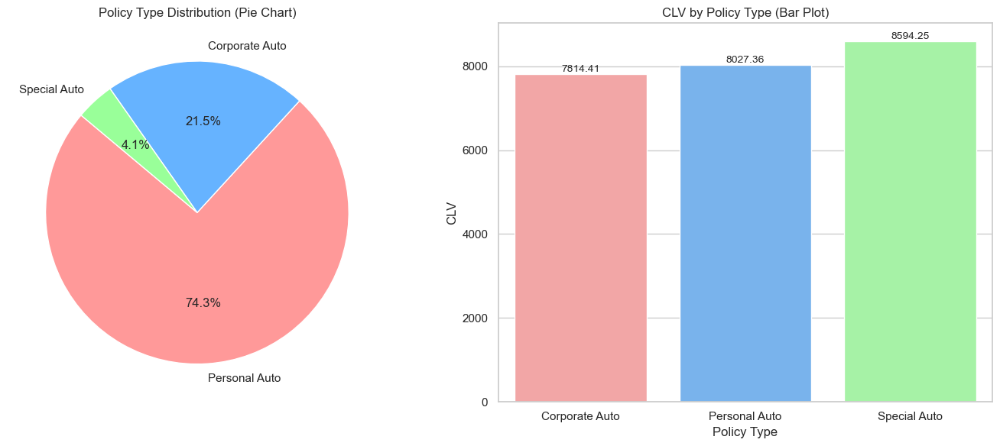

In [195]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

policy_type_counts = clv_df['Policy_Type'].value_counts()
axes[0].pie(policy_type_counts, labels=policy_type_counts.index, autopct='%1.1f%%', startangle=140, colors=['#ff9999', '#66b3ff', '#99ff99'])
axes[0].set_title('Policy Type Distribution (Pie Chart)')

custom_palette = ['#ff9999', '#66b3ff', '#99ff99']
ax = sns.barplot(x=clv_df['Policy_Type'], y=clv_df['CLV'], palette=custom_palette, ci=None, ax=axes[1])

for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.2f}', (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize=10)

axes[1].set_xlabel('Policy Type')
axes[1].set_ylabel('CLV')
axes[1].set_title('CLV by Policy Type (Bar Plot)')

plt.tight_layout()
plt.show()


<h3 style="color:darkblue">Feature Encoding</h3>

In [196]:
clv_df = pd.get_dummies(clv_df,columns=['Policy_Type'])
clv_df.head()

,Customer,CLV,Response,Education,Effective To Date,Gender,Income,Monthly_Premium_Auto,Months_Since_Last_Claim,Months_Since_Policy_Inception,...,EmploymentStatus_Unemployed,Location_Code_Rural,Location_Code_Suburban,Location_Code_Urban,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Policy_Type_Corporate Auto,Policy_Type_Personal Auto,Policy_Type_Special Auto
0,BU79786,2763.519279,0,2,2/24/11,1,56274,69,32,5,...,0,0,1,0,0,1,0,1,0,0
1,QZ44356,6979.535903,0,2,1/31/11,1,0,94,13,42,...,1,0,1,0,0,0,1,0,1,0
2,AI49188,12887.431650,0,2,2/19/11,1,48767,108,18,38,...,0,0,1,0,0,1,0,0,1,0
3,WW63253,7645.861827,0,2,1/20/11,0,0,106,18,65,...,1,0,1,0,0,1,0,1,0,0
4,HB64268,2813.692575,0,2,3/2/2011,0,43836,73,12,44,...,0,1,0,0,0,0,1,0,1,0


## 3.2.12 Policy

In [197]:
clv_df['Policy']

0       Corporate L3
1        Personal L3
2        Personal L3
3       Corporate L2
4        Personal L1
            ...     
9129     Personal L1
9130    Corporate L3
9131    Corporate L2
9132     Personal L2
9133    Corporate L3
Name: Policy, Length: 9134, dtype: object

In [198]:
clv_df['Policy'].value_counts()

Personal L3     3426
Personal L2     2122
Personal L1     1240
Corporate L3    1014
Corporate L2     595
Corporate L1     359
Special L2       164
Special L3       148
Special L1        66
Name: Policy, dtype: int64

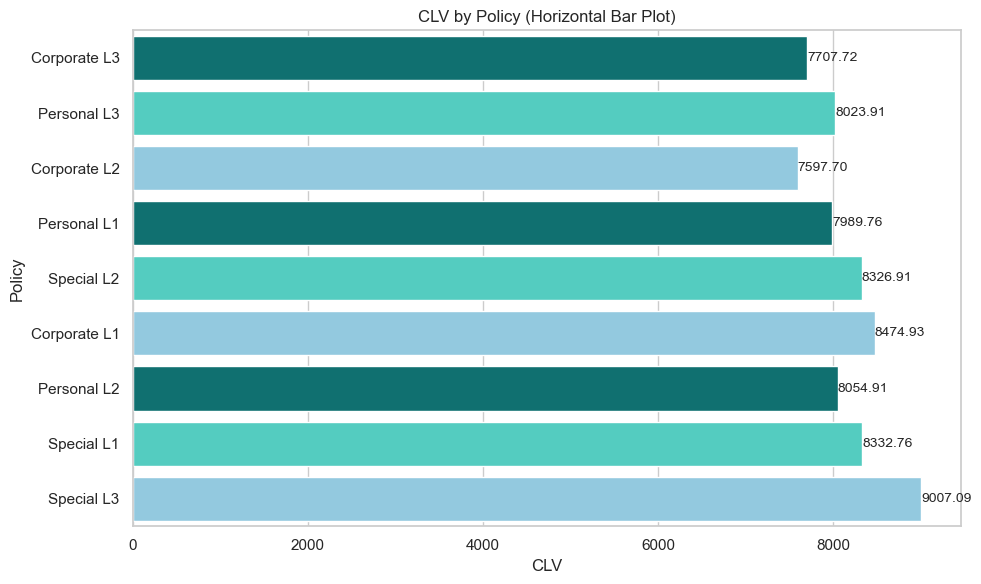

In [199]:
custom_palette = ['teal', 'turquoise', 'skyblue']
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=clv_df['CLV'], y=clv_df['Policy'], palette=custom_palette, ci=None, orient='h')

# Display values over the bars
for p in ax.patches:
    width = p.get_width()
    ax.annotate(f'{width:.2f}', (width, p.get_y() + p.get_height() / 2), va='center', fontsize=10)

plt.xlabel('CLV')
plt.ylabel('Policy')
plt.title('CLV by Policy (Horizontal Bar Plot)')

plt.tight_layout()
plt.show()


<h3 style="color:orangered">Observation : Total 37.51% customers with personal L3 policy as the highest amongst them all.</h3>

<h3 style="color:darkblue">Feature Encoding</h3>

In [200]:
clv_df = pd.get_dummies(clv_df,columns=['Policy'])
clv_df.head()

,Customer,CLV,Response,Education,Effective To Date,Gender,Income,Monthly_Premium_Auto,Months_Since_Last_Claim,Months_Since_Policy_Inception,...,Policy_Type_Special Auto,Policy_Corporate L1,Policy_Corporate L2,Policy_Corporate L3,Policy_Personal L1,Policy_Personal L2,Policy_Personal L3,Policy_Special L1,Policy_Special L2,Policy_Special L3
0,BU79786,2763.519279,0,2,2/24/11,1,56274,69,32,5,...,0,0,0,1,0,0,0,0,0,0
1,QZ44356,6979.535903,0,2,1/31/11,1,0,94,13,42,...,0,0,0,0,0,0,1,0,0,0
2,AI49188,12887.431650,0,2,2/19/11,1,48767,108,18,38,...,0,0,0,0,0,0,1,0,0,0
3,WW63253,7645.861827,0,2,1/20/11,0,0,106,18,65,...,0,0,1,0,0,0,0,0,0,0
4,HB64268,2813.692575,0,2,3/2/2011,0,43836,73,12,44,...,0,0,0,0,1,0,0,0,0,0


## 3.2.13 Renew Offer Type

In [201]:
clv_df['Renew_Offer_Type']

0       Offer1
1       Offer3
2       Offer1
3       Offer1
4       Offer1
         ...  
9129    Offer2
9130    Offer1
9131    Offer1
9132    Offer3
9133    Offer4
Name: Renew_Offer_Type, Length: 9134, dtype: object

In [202]:
clv_df['Renew_Offer_Type'].value_counts()

Offer1    3752
Offer2    2926
Offer3    1432
Offer4    1024
Name: Renew_Offer_Type, dtype: int64

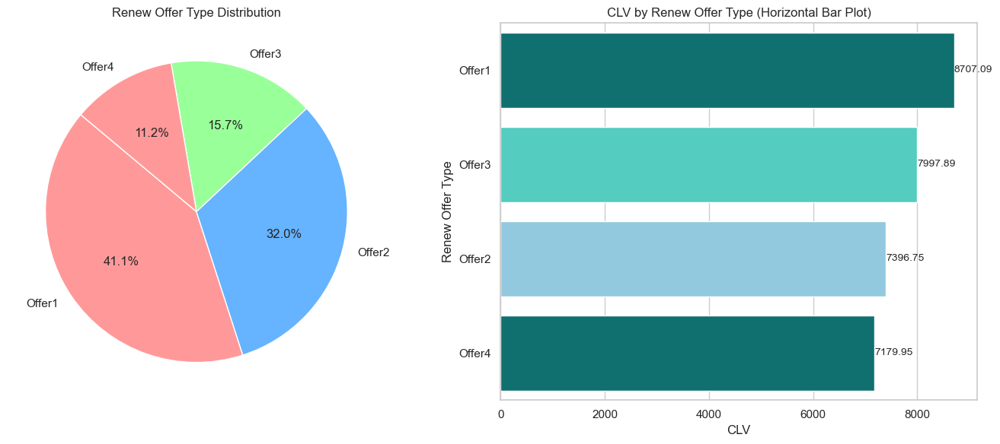

In [203]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

renew_offer_counts = clv_df['Renew_Offer_Type'].value_counts()
axes[0].pie(renew_offer_counts, labels=renew_offer_counts.index, autopct='%1.1f%%', startangle=140, colors=['#ff9999', '#66b3ff', '#99ff99'])
axes[0].set_title('Renew Offer Type Distribution')

custom_palette = ['teal', 'turquoise', 'skyblue']
sns.barplot(x=clv_df['CLV'], y=clv_df['Renew_Offer_Type'], palette=custom_palette, ci=None, orient='h', ax=axes[1])

for p in axes[1].patches:
    width = p.get_width()
    axes[1].annotate(f'{width:.2f}', (width, p.get_y() + p.get_height() / 2), va='center', fontsize=10)

axes[1].set_xlabel('CLV')
axes[1].set_ylabel('Renew Offer Type')
axes[1].set_title('CLV by Renew Offer Type (Horizontal Bar Plot)')

plt.tight_layout()
plt.show()


<h3 style="color:darkblue">Feature Encoding</h3>

In [204]:
clv_df['Renew_Offer_Type'].replace({'Offer1':3,'Offer2': 2 ,'Offer3':1, 'Offer4':0},inplace=True)
clv_df.head()

,Customer,CLV,Response,Education,Effective To Date,Gender,Income,Monthly_Premium_Auto,Months_Since_Last_Claim,Months_Since_Policy_Inception,...,Policy_Type_Special Auto,Policy_Corporate L1,Policy_Corporate L2,Policy_Corporate L3,Policy_Personal L1,Policy_Personal L2,Policy_Personal L3,Policy_Special L1,Policy_Special L2,Policy_Special L3
0,BU79786,2763.519279,0,2,2/24/11,1,56274,69,32,5,...,0,0,0,1,0,0,0,0,0,0
1,QZ44356,6979.535903,0,2,1/31/11,1,0,94,13,42,...,0,0,0,0,0,0,1,0,0,0
2,AI49188,12887.431650,0,2,2/19/11,1,48767,108,18,38,...,0,0,0,0,0,0,1,0,0,0
3,WW63253,7645.861827,0,2,1/20/11,0,0,106,18,65,...,0,0,1,0,0,0,0,0,0,0
4,HB64268,2813.692575,0,2,3/2/2011,0,43836,73,12,44,...,0,0,0,0,1,0,0,0,0,0


## 3.2.14 Sales Channel

In [205]:
clv_df['Sales_Channel']

0             Agent
1             Agent
2             Agent
3       Call Center
4             Agent
           ...     
9129            Web
9130         Branch
9131         Branch
9132         Branch
9133    Call Center
Name: Sales_Channel, Length: 9134, dtype: object

In [206]:
clv_df['Sales_Channel'].value_counts()

Agent          3477
Branch         2567
Call Center    1765
Web            1325
Name: Sales_Channel, dtype: int64

<Axes: ylabel='Sales_Channel'>

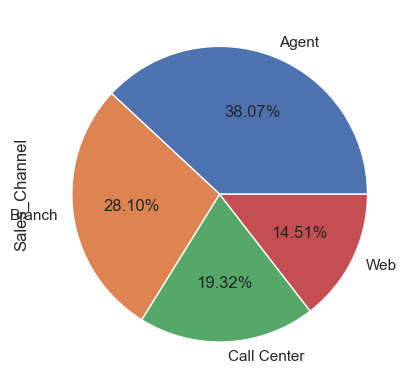

In [207]:
clv_df['Sales_Channel'].value_counts().plot(kind='pie',autopct='%1.2f%%')

<h3 style="color:orangered">Observation : Majority of the customer base is coming from Agents.</h3>

<h3 style="color:darkblue">Feature Encoding</h3>

In [208]:
clv_df = pd.get_dummies(clv_df,columns=['Sales_Channel'])
clv_df.head()

,Customer,CLV,Response,Education,Effective To Date,Gender,Income,Monthly_Premium_Auto,Months_Since_Last_Claim,Months_Since_Policy_Inception,...,Policy_Personal L1,Policy_Personal L2,Policy_Personal L3,Policy_Special L1,Policy_Special L2,Policy_Special L3,Sales_Channel_Agent,Sales_Channel_Branch,Sales_Channel_Call Center,Sales_Channel_Web
0,BU79786,2763.519279,0,2,2/24/11,1,56274,69,32,5,...,0,0,0,0,0,0,1,0,0,0
1,QZ44356,6979.535903,0,2,1/31/11,1,0,94,13,42,...,0,0,1,0,0,0,1,0,0,0
2,AI49188,12887.431650,0,2,2/19/11,1,48767,108,18,38,...,0,0,1,0,0,0,1,0,0,0
3,WW63253,7645.861827,0,2,1/20/11,0,0,106,18,65,...,0,0,0,0,0,0,0,0,1,0
4,HB64268,2813.692575,0,2,3/2/2011,0,43836,73,12,44,...,1,0,0,0,0,0,1,0,0,0


## 3.2.15 Vehicle Class

In [209]:
clv_df['Vehicle_Class']

0        Two-Door Car
1       Four-Door Car
2        Two-Door Car
3                 SUV
4       Four-Door Car
            ...      
9129    Four-Door Car
9130    Four-Door Car
9131    Four-Door Car
9132    Four-Door Car
9133     Two-Door Car
Name: Vehicle_Class, Length: 9134, dtype: object

In [210]:
clv_df['Vehicle_Class'].value_counts()

Four-Door Car    4621
Two-Door Car     1886
SUV              1796
Sports Car        484
Luxury SUV        184
Luxury Car        163
Name: Vehicle_Class, dtype: int64

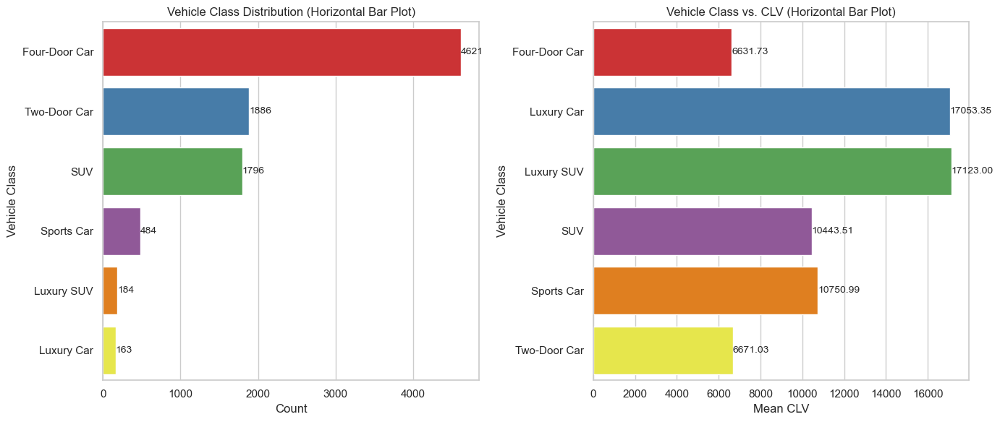

In [211]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.set(style="whitegrid")
ax1 = sns.barplot(x=clv_df['Vehicle_Class'].value_counts().values,
                  y=clv_df['Vehicle_Class'].value_counts().index, palette="Set1", ci=None, orient='h', ax=axes[0])

for p in ax1.patches:
    width = p.get_width()
    ax1.annotate(f'{int(width)}', (width, p.get_y() + p.get_height() / 2), va='center', fontsize=10)

ax1.set_xlabel('Count')
ax1.set_ylabel('Vehicle Class')
ax1.set_title('Vehicle Class Distribution (Horizontal Bar Plot)')

sns.set(style="whitegrid")
ax2 = sns.barplot(x=clv_df.groupby('Vehicle_Class')['CLV'].mean().values,
                  y=clv_df.groupby('Vehicle_Class')['CLV'].mean().index, palette="Set1", ci=None, orient='h', ax=axes[1])

for p in ax2.patches:
    width = p.get_width()
    ax2.annotate(f'{width:.2f}', (width, p.get_y() + p.get_height() / 2), va='center', fontsize=10)

ax2.set_xlabel('Mean CLV')
ax2.set_ylabel('Vehicle Class')
ax2.set_title('Vehicle Class vs. CLV (Horizontal Bar Plot)')

plt.tight_layout()

plt.show()


<h3 style="color:darkblue">Feature Encoding</h3>

In [212]:
clv_df = pd.get_dummies(clv_df,columns=['Vehicle_Class'])
clv_df.head()

,Customer,CLV,Response,Education,Effective To Date,Gender,Income,Monthly_Premium_Auto,Months_Since_Last_Claim,Months_Since_Policy_Inception,...,Sales_Channel_Agent,Sales_Channel_Branch,Sales_Channel_Call Center,Sales_Channel_Web,Vehicle_Class_Four-Door Car,Vehicle_Class_Luxury Car,Vehicle_Class_Luxury SUV,Vehicle_Class_SUV,Vehicle_Class_Sports Car,Vehicle_Class_Two-Door Car
0,BU79786,2763.519279,0,2,2/24/11,1,56274,69,32,5,...,1,0,0,0,0,0,0,0,0,1
1,QZ44356,6979.535903,0,2,1/31/11,1,0,94,13,42,...,1,0,0,0,1,0,0,0,0,0
2,AI49188,12887.431650,0,2,2/19/11,1,48767,108,18,38,...,1,0,0,0,0,0,0,0,0,1
3,WW63253,7645.861827,0,2,1/20/11,0,0,106,18,65,...,0,0,1,0,0,0,0,1,0,0
4,HB64268,2813.692575,0,2,3/2/2011,0,43836,73,12,44,...,1,0,0,0,1,0,0,0,0,0


## 3.2.16 Vehicle Size

In [213]:
clv_df['Vehicle_Size']

0       Medsize
1       Medsize
2       Medsize
3       Medsize
4       Medsize
         ...   
9129    Medsize
9130    Medsize
9131    Medsize
9132      Large
9133    Medsize
Name: Vehicle_Size, Length: 9134, dtype: object

In [214]:
clv_df['Vehicle_Size'].value_counts()

Medsize    6424
Small      1764
Large       946
Name: Vehicle_Size, dtype: int64

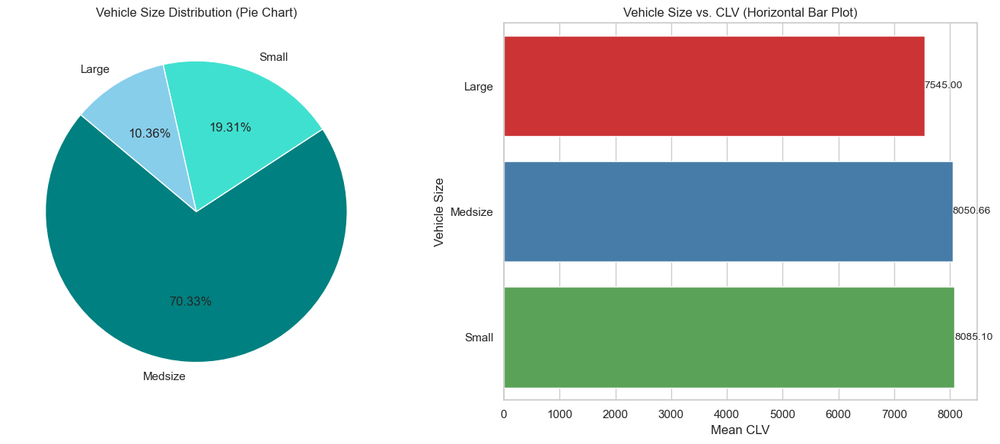

In [215]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

vehicle_size_counts = clv_df['Vehicle_Size'].value_counts()
axes[0].pie(vehicle_size_counts, labels=vehicle_size_counts.index, autopct='%1.2f%%', startangle=140, colors=['teal', 'turquoise', 'skyblue'])
axes[0].set_title('Vehicle Size Distribution (Pie Chart)')

sns.set(style="whitegrid")
ax2 = sns.barplot(x=clv_df.groupby('Vehicle_Size')['CLV'].mean().values,
                  y=clv_df.groupby('Vehicle_Size')['CLV'].mean().index, palette="Set1", ci=None, orient='h', ax=axes[1])

for p in ax2.patches:
    width = p.get_width()
    ax2.annotate(f'{width:.2f}', (width, p.get_y() + p.get_height() / 2), va='center', fontsize=10)

ax2.set_xlabel('Mean CLV')
ax2.set_ylabel('Vehicle Size')
ax2.set_title('Vehicle Size vs. CLV (Horizontal Bar Plot)')

plt.tight_layout()

plt.show()


<h3 style="color:darkblue">Feature Encoding</h3>

In [216]:
clv_df = pd.get_dummies(clv_df,columns=['Vehicle_Size'])
clv_df.head()

,Customer,CLV,Response,Education,Effective To Date,Gender,Income,Monthly_Premium_Auto,Months_Since_Last_Claim,Months_Since_Policy_Inception,...,Sales_Channel_Web,Vehicle_Class_Four-Door Car,Vehicle_Class_Luxury Car,Vehicle_Class_Luxury SUV,Vehicle_Class_SUV,Vehicle_Class_Sports Car,Vehicle_Class_Two-Door Car,Vehicle_Size_Large,Vehicle_Size_Medsize,Vehicle_Size_Small
0,BU79786,2763.519279,0,2,2/24/11,1,56274,69,32,5,...,0,0,0,0,0,0,1,0,1,0
1,QZ44356,6979.535903,0,2,1/31/11,1,0,94,13,42,...,0,1,0,0,0,0,0,0,1,0
2,AI49188,12887.431650,0,2,2/19/11,1,48767,108,18,38,...,0,0,0,0,0,0,1,0,1,0
3,WW63253,7645.861827,0,2,1/20/11,0,0,106,18,65,...,0,0,0,0,1,0,0,0,1,0
4,HB64268,2813.692575,0,2,3/2/2011,0,43836,73,12,44,...,0,1,0,0,0,0,0,0,1,0


In [ ]:
clv_df.head(1).T

# 4. Feature Selection

## 4.1 Feature Selection

### 4.1.1 Filter Method

In [264]:
ken_corr = clv_df.corr(method='kendall').head(1).T
# plt.figure(figsize=(1,8))
# sns.heatmap(ken_corr, annot=True)
ken_corr

,CLV
CLV,1.000000
Response,-0.005538
Education,-0.017625
Gender,0.005933
Income,0.038081
Monthly_Premium_Auto,0.350830
Months_Since_Last_Claim,0.003478
Months_Since_Policy_Inception,-0.001684
Number_of_Open_Complaints,-0.024689
Number_of_Policies,0.302811


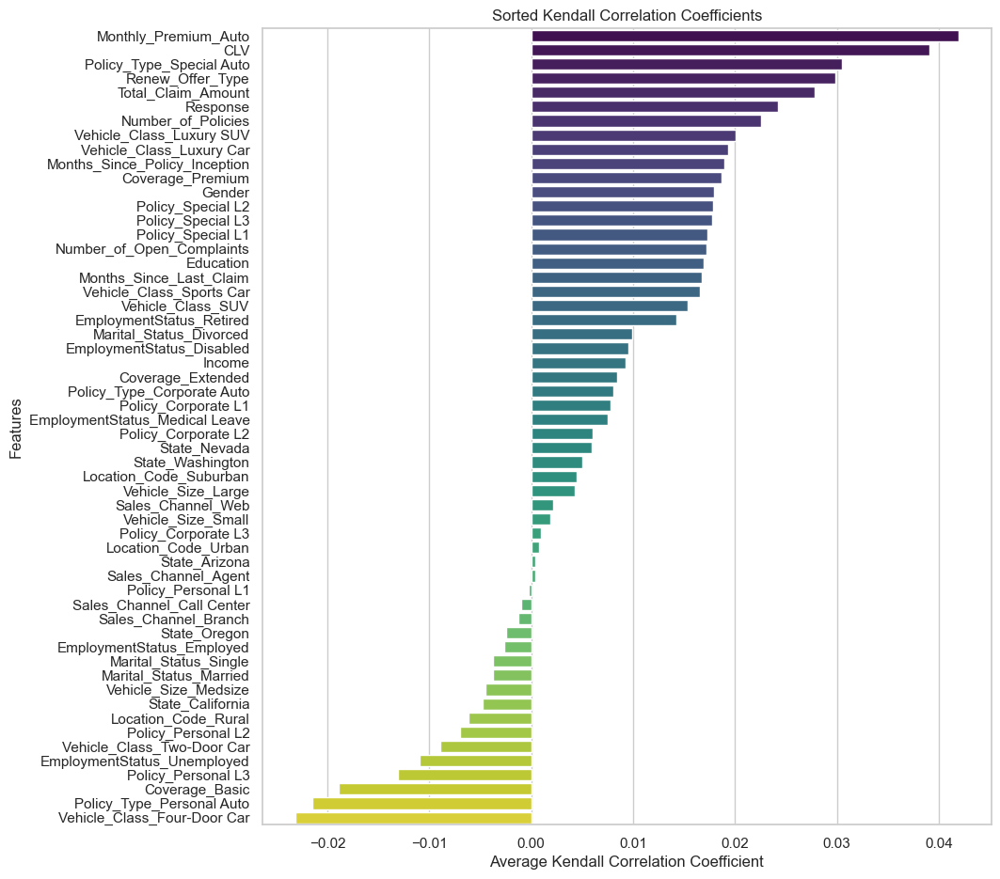

In [218]:
average_kendall_corr = ken_corr.mean(axis=1)

sorted_kendall_corr = average_kendall_corr.sort_values(ascending=False)

plt.figure(figsize=(10, 11))  
sns.barplot(x=sorted_kendall_corr, y=sorted_kendall_corr.index, orient='h', palette='viridis')

plt.xlabel('Average Kendall Correlation Coefficient')
plt.ylabel('Features')
plt.title('Sorted Kendall Correlation Coefficients')

plt.show()


In [228]:
clv_df.drop(['Effective To Date'],axis=1,inplace=True)

In [229]:
clv_df.drop(['Customer'],axis=1,inplace=True)

In [ ]:
clv_df['CLV']

In [230]:
outcome = np.log(clv_df['CLV'])
outcome

0        7.924260
1        8.850738
2        9.464008
3        8.941920
4        7.942253
          ...    
9129    10.060747
9130     8.038031
9131     9.007476
9132     8.925912
9133     7.867809
Name: CLV, Length: 9134, dtype: float64

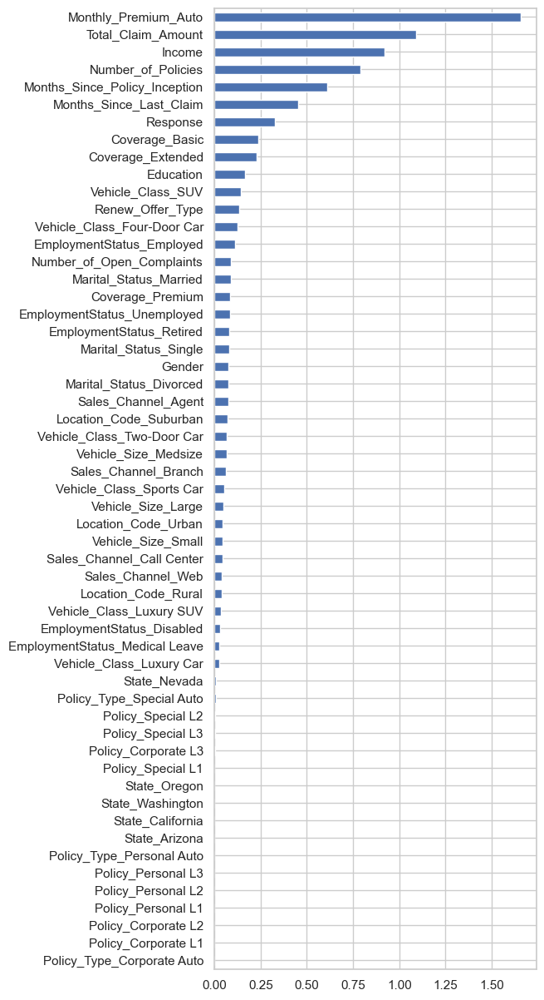

In [271]:
Ind_var = clv_df.drop('CLV', axis=1)
Outcome = clv_df['CLV']

arrray1 = mutual_info_regression(Ind_var, Outcome)
s1 = pd.Series(arrray1, index= Ind_var.columns)
plt.figure(figsize=(5,15))
s1.sort_values().plot(kind='barh')

file_path = 'vif.png'
plt.savefig(file_path,dpi=300, bbox_inches='tight')
plt.show(file_path)

# 5.Model Building

### 5.1 Train Test Split

In [272]:
from sklearn.preprocessing import FunctionTransformer, PowerTransformer
from scipy.stats import boxcox
import pickle

In [273]:
x = clv_df.drop(['CLV'],axis=1)
y1 = clv_df['CLV']

In [274]:
power_trans = PowerTransformer(method='box-cox') 
power_trans_fit = power_trans.fit(np.array(y1).reshape(-1,1))
y = power_trans_fit.transform(np.array(y1).reshape(-1, 1))
# y = power_trans.fit_transform([y1])[:,0]

In [275]:
with open('transform.pkl','wb') as f:
    pickle.dump(power_trans_fit,f)

In [276]:
# y = np.log(clv_df['CLV'])
# y

In [277]:
x1 = sm.add_constant(x)
x1

,const,Response,Education,Gender,Income,Monthly_Premium_Auto,Months_Since_Last_Claim,Months_Since_Policy_Inception,Number_of_Open_Complaints,Number_of_Policies,...,Sales_Channel_Web,Vehicle_Class_Four-Door Car,Vehicle_Class_Luxury Car,Vehicle_Class_Luxury SUV,Vehicle_Class_SUV,Vehicle_Class_Sports Car,Vehicle_Class_Two-Door Car,Vehicle_Size_Large,Vehicle_Size_Medsize,Vehicle_Size_Small
0,1.0,0,2,1,56274,69,32,5,0,1,...,0,0,0,0,0,0,1,0,1,0
1,1.0,0,2,1,0,94,13,42,0,8,...,0,1,0,0,0,0,0,0,1,0
2,1.0,0,2,1,48767,108,18,38,0,2,...,0,0,0,0,0,0,1,0,1,0
3,1.0,0,2,0,0,106,18,65,0,7,...,0,0,0,0,1,0,0,0,1,0
4,1.0,0,2,0,43836,73,12,44,0,1,...,0,1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,1.0,0,2,0,71941,73,18,89,0,2,...,1,1,0,0,0,0,0,0,1,0
9130,1.0,1,1,1,21604,79,14,28,0,1,...,0,1,0,0,0,0,0,0,1,0
9131,1.0,0,2,0,0,85,9,37,3,2,...,0,1,0,0,0,0,0,0,1,0
9132,1.0,0,1,0,21941,96,34,3,0,3,...,0,1,0,0,0,0,0,1,0,0


In [278]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=2)
x_train.head()

,Response,Education,Gender,Income,Monthly_Premium_Auto,Months_Since_Last_Claim,Months_Since_Policy_Inception,Number_of_Open_Complaints,Number_of_Policies,Renew_Offer_Type,...,Sales_Channel_Web,Vehicle_Class_Four-Door Car,Vehicle_Class_Luxury Car,Vehicle_Class_Luxury SUV,Vehicle_Class_SUV,Vehicle_Class_Sports Car,Vehicle_Class_Two-Door Car,Vehicle_Size_Large,Vehicle_Size_Medsize,Vehicle_Size_Small
3650,0,1,1,75090,63,10,67,1,7,0,...,0,1,0,0,0,0,0,0,1,0
8872,0,1,0,17301,105,1,11,0,5,2,...,0,1,0,0,0,0,0,0,0,1
5726,0,2,0,10517,92,14,65,0,3,3,...,0,1,0,0,0,0,0,0,1,0
3284,0,3,1,43657,66,21,74,0,2,3,...,0,0,0,0,0,0,1,1,0,0
2449,1,2,1,48567,130,12,15,0,1,2,...,0,0,0,0,1,0,0,0,1,0


In [279]:
x_train.shape

(7307, 55)

In [ ]:
x_test.shape

# 1.Ordinary Least Square (OLS) 

In [ ]:
ols_mod = sm.OLS(y_train,x_train)
lin_reg_ols = ols_mod.fit()
lin_reg_ols

In [ ]:
print(lin_reg_ols.summary())

# 2.Linear Regression

In [281]:
lin_reg = LinearRegression()
lin_reg.fit(x_train,y_train)
lin_reg

LinearRegression()

### Evaluation on Testing data and Training Data

In [282]:
def evaluation(model, ind_var, act):
    pred = model.predict(ind_var)
    
    mse = mean_squared_error(act, pred)
    print('MSE :', mse)
    
    rmse = np.sqrt(mse)
    print('RMSE :', rmse)
    
    mae = mean_absolute_error(act, pred)
    print('MAE :', mae)
    
    r_squared = r2_score(act, pred)
    print('R-Squared Value :', r_squared)
    
    adj_r2 = 1 - (((1-r_squared)*(y_test.shape[0] - 1))/ (y_test.shape[0]-x_test.shape[1]-1))
    print('Adj R Squared Value :', adj_r2)
    
print('Testing Data Evaluation'.center(50, '*'))
evaluation(lin_reg, x_test, y_test)

print()

print('Training Data Evaluation'.center(50, '*'))
evaluation(lin_reg, x_train, y_train)

*************Testing Data Evaluation**************
MSE : 0.7085612731773302
RMSE : 0.8417608170836477
MAE : 0.6774303092547908
R-Squared Value : 0.2781059064905388
Adj R Squared Value : 0.25568683526353686

*************Training Data Evaluation*************
MSE : 0.710505664731753
RMSE : 0.8429149807256678
MAE : 0.6808914055709376
R-Squared Value : 0.29274635002222604
Adj R Squared Value : 0.27078195095459334


## Wrapper Method

In [ ]:
from sklearn.feature_selection import SequentialFeatureSelector

### 1.Wrapper Method on Linear Regression

In [ ]:
lr_model = LinearRegression()
sfs = SequentialFeatureSelector(lr_model,n_features_to_select=None,direction='forward',n_jobs=-1,cv=3)
sfs.fit(x,y)
sfs.get_support()

In [ ]:
ar1 = sfs.get_support()
s1 = pd.Series(ar1,index=x.columns)
features = x.columns[ar1]
len(features)
print('Important Features after applying the wrapper method:-\n\n',features)

### Build model using Important Features

In [ ]:
x2 = x[features]
y2 = np.log(clv_df['CLV'])

In [ ]:
x_train2,x_test2,y_train2,y_test2 = train_test_split(x2,y2,test_size=0.2,random_state=2)
x_train.head()

In [ ]:
lr_model_2 = LinearRegression()
lr_model_2.fit(x_train2,y_train2)
lr_model_2

In [ ]:
print('Testing Data Evaluation'.center(50, '*'))
evaluation(lr_model_2, x_test2, y_test2)

print()

print('Training Data Evaluation'.center(50, '*'))
evaluation(lr_model_2, x_train2, y_train2)

### Conclusion : No Big Differance in Linear regression after applying the wrapper methods also.

# 3.Decision Tree

In [283]:
dt_reg = DecisionTreeRegressor(random_state=1)
dt_reg.fit(x_train,y_train)
dt_reg

DecisionTreeRegressor(random_state=1)

In [284]:
print('Testing Data Evaluation'.center(50, '*'))
evaluation(dt_reg, x_test, y_test)

print()

print('Training Data Evaluation'.center(50, '*'))
evaluation(dt_reg, x_train, y_train)

*************Testing Data Evaluation**************
MSE : 0.09291971814037996
RMSE : 0.3048273579263842
MAE : 0.1333978004069361
R-Squared Value : 0.9053318347539484
Adj R Squared Value : 0.9023918296220834

*************Training Data Evaluation*************
MSE : 3.948253592396188e-20
RMSE : 1.9870212863470254e-10
MAE : 3.2873678746085957e-12
R-Squared Value : 1.0
Adj R Squared Value : 1.0


## Hyperparameter Tunning

In [ ]:
hyp = {'criterion':['squared_error', 'absolute_error','friedman_mse'],
      'splitter':['best','random'],
      'max_depth': np.arange(5,12),
      'min_samples_split': np.arange(6,12),
      'min_samples_leaf': np.arange(6,12)}

gscv_dt_model = GridSearchCV(dt_reg, hyp, cv=3)
gscv_dt_model.fit(x_train, y_train)
gscv_dt_model.best_estimator_
gscv_dt_model.best_params_

In [285]:
dt_reg_hyp = DecisionTreeRegressor(criterion='squared_error',max_depth=6,min_samples_leaf=9,min_samples_split=6,splitter='best')
dt_reg_hyp.fit(x_train, y_train)

DecisionTreeRegressor(max_depth=6, min_samples_leaf=9, min_samples_split=6)

In [286]:
print('Testing Data Evaluation'.center(50, '*'))
evaluation(dt_reg_hyp, x_test, y_test)

print()

print('Training Data Evaluation'.center(50, '*'))
evaluation(dt_reg_hyp, x_train, y_train)

*************Testing Data Evaluation**************
MSE : 0.06418107045310707
RMSE : 0.25333983195128845
MAE : 0.15422656392849646
R-Squared Value : 0.9346112503898909
Adj R Squared Value : 0.9325805438802601

*************Training Data Evaluation*************
MSE : 0.059231747849808794
RMSE : 0.24337573389680572
MAE : 0.14928398093007336
R-Squared Value : 0.9410393583882876
Adj R Squared Value : 0.9392082825618369


### Decision Tree Plot

In [ ]:
plt.figure(figsize=(100,80))
plot_tree(dt_reg_hyp, feature_names= x.columns, filled=True,)
plt.savefig('Decision_tree.png', dpi=400)

# 4.Random Forest

In [287]:
rf = RandomForestRegressor(random_state=1)
rf.fit(x_train,y_train)

RandomForestRegressor(random_state=1)

In [288]:
print('Testing Data Evaluation'.center(50, '*'))
evaluation(rf, x_test, y_test)

print()

print('Training Data Evaluation'.center(50, '*'))
evaluation(rf, x_train, y_train)

*************Testing Data Evaluation**************
MSE : 0.04728779137190537
RMSE : 0.2174575622320488
MAE : 0.10852314541827855
R-Squared Value : 0.9518224060801262
Adj R Squared Value : 0.950326207511186

*************Training Data Evaluation*************
MSE : 0.007362928284154272
RMSE : 0.08580750715499356
MAE : 0.04236210386444806
R-Squared Value : 0.992670772152874
Adj R Squared Value : 0.9924431563812242


## Hyperparameter Tunning

In [ ]:
# Define the Random Forest regressor
rf_regressor = RandomForestRegressor()

# Define the hyperparameters you want to tune
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

# Create a GridSearchCV object
grid_search = GridSearchCV(estimator=rf_regressor, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')

# Fit the GridSearchCV to your data
grid_search.fit(x_train,y_train)

# Print the best hyperparameters
print("Best hyperparameters:", grid_search.best_params_)

# Get the best model
best_rf_regressor = grid_search.best_estimator_

# Make predictions using the best model
y_pred = best_rf_regressor.predict(x)


In [289]:
rf_hyp = RandomForestRegressor(max_depth=30,max_features='auto',min_samples_leaf=1,min_samples_split=5,n_estimators=200)
rf_hyp.fit(x_train, y_train)

InvalidParameterError: The 'max_features' parameter of RandomForestRegressor must be an int in the range [1, inf), a float in the range (0.0, 1.0], a str among {'sqrt', 'log2'} or None. Got 'auto' instead.

In [290]:
print('Testing Data Evaluation'.center(50, '*'))
evaluation(rf_hyp, x_test, y_test)

print()

print('Training Data Evaluation'.center(50, '*'))
evaluation(rf_hyp, x_train, y_train)

*************Testing Data Evaluation**************


NotFittedError: This RandomForestRegressor instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

## 5.AdaBoost

In [291]:
ada_reg = AdaBoostRegressor(random_state=2,learning_rate=0.5)
ada_reg.fit(x_train,y_train)

AdaBoostRegressor(learning_rate=0.5, random_state=2)

In [292]:
print('Testing Data Evaluation'.center(50, '*'))
evaluation(ada_reg, x_test, y_test)

print()

print('Training Data Evaluation'.center(50, '*'))
evaluation(ada_reg, x_train, y_train)

*************Testing Data Evaluation**************
MSE : 0.09002916853935382
RMSE : 0.30004861029398855
MAE : 0.22658991271685738
R-Squared Value : 0.9082767751041595
Adj R Squared Value : 0.9054282277471458

*************Training Data Evaluation*************
MSE : 0.09271304695185931
RMSE : 0.304488172105025
MAE : 0.23212837178533693
R-Squared Value : 0.9077113046213089
Adj R Squared Value : 0.9048451960691757


# 6.K-Nearest Neighbour Algorithm

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
norm_scaler = MinMaxScaler()
train = norm_scaler.fit_transform(x_train)
train_df = pd.DataFrame(train, columns=x.columns)
train_df.head(2)

In [ ]:
test = norm_scaler.transform(x_test)
test_df = pd.DataFrame(test, columns=x.columns)
test_df.head(2)

In [ ]:
knn_reg = KNeighborsRegressor()
knn_reg.fit(train_df,y_train)

In [ ]:
def evaluation(string, model, ind_var, y_act):
    print(string.center(50, '*'))
    pred = model.predict(ind_var)
    
    mae = mean_absolute_error(y_act, pred)
    print('MAE :', round(mae, 3))
    
    mse = mean_squared_error(y_act, pred)
    print('MSE :', round(mse, 3))
    
    rmse = np.sqrt(mse)
    print('RMSE :', round(rmse, 3))
    
    r2_val = r2_score(y_act, pred)
    print('R2-Score :', round(r2_val, 3))
    
    n = ind_var.shape[0]
    k = ind_var.shape[1]
    
    adj_r2 = 1 - ((1-r2_val)* (n-1))/ (n-k-1)
    print('Adjusted R2 Score :', round(adj_r2, 3))
    
evaluation('Train Data Accuracy', knn_reg, train_df, y_train)

## Hyperparameter Tunning

In [ ]:
knn_model = KNeighborsRegressor()

hyperparameters = {'n_neighbors': np.arange(3,20), 'p': [1,2]}

gscv_knn_model = GridSearchCV(knn_model, hyperparameters, cv = 3)
gscv_knn_model.fit(train_df, y_train)
gscv_knn_model.best_estimator_
gscv_knn_model.best_params_

In [ ]:
knn_reg = gscv_knn_model.best_estimator_
knn_reg.fit(train_df, y_train)

In [ ]:
def evaluation(string, model, ind_var, y_act):
    print(string.center(50, '*'))
    pred = model.predict(ind_var)
    
    mae = mean_absolute_error(y_act, pred)
    print('MAE :', round(mae, 3))
    
    mse = mean_squared_error(y_act, pred)
    print('MSE :', round(mse, 3))
    
    rmse = np.sqrt(mse)
    print('RMSE :', round(rmse, 3))
    
    r2_val = r2_score(y_act, pred)
    print('R2-Score :', round(r2_val, 3))
    
    n = ind_var.shape[0]
    k = ind_var.shape[1]
    
    adj_r2 = 1 - ((1-r2_val)* (n-1))/ (n-k-1)
    print('Adjusted R2 Score :', round(adj_r2, 3))
    
evaluation('Train Data Accuracy', knn_reg, train_df, y_train)

In [ ]:
train_accuracy_list = []
test_accuracy_list = []

for k in range(3,20):
    knn_reg_model = KNeighborsRegressor(n_neighbors=k)
    knn_reg_model.fit(train_df, y_train)
    
    train_accuracy = knn_reg_model.score(train_df, y_train)
    train_accuracy_list.append(train_accuracy)
    
    test_accuracy = knn_reg_model.score(test_df, y_test)
    test_accuracy_list.append(test_accuracy)
    
report = pd.DataFrame({'K Neighbors': range(3,20),'Training Accuracy':train_accuracy_list})

In [ ]:
report

In [ ]:
k = np.arange(3,20)
plt.plot(k, train_accuracy_list)
plt.plot(k, test_accuracy_list,)
plt.title('Train and Test Accuracy on p=1')
plt.xlabel('k Values')
plt.ylabel('Accuracy')

## Model Report

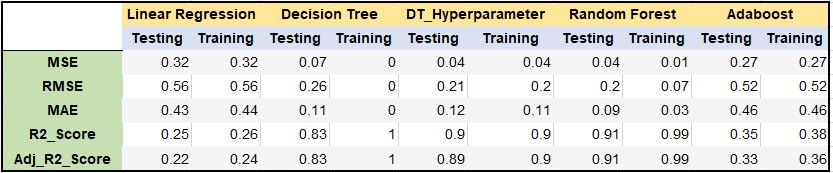

In [ ]:
Model_Name = ['Linear Regression', 'Decision tree', 'Random Forest','Adaboost']
Training_Accuracy = np.around([lin_reg.score(x_train,y_train), dt_reg.score(x_train,y_train),rf_reg.score(x_train, y_train),ada_reg.score(x_train,y_train)],2)*100
Testing_Accuracy = np.around([lin_reg.score(x_test,y_test), dt_reg.score(x_test,y_test),rf_reg.score(x_test, y_test),ada_reg.score(x_test,y_test)],2)*100
Result = pd.DataFrame([Model_Name,Training_Accuracy,Testing_Accuracy])
Result

In [ ]:
X_axis = np.arange(len(Model_Name))
plt.bar(X_axis - 0.2, Training_Accuracy, 0.4, label = 'Training_Accuracy')
plt.bar(X_axis + 0.2, Testing_Accuracy, 0.4, label = 'Testing_Accuracy')
plt.xticks(X_axis, Model_Name)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Models Accuracy Barchart")
plt.legend(loc='lower right')
plt.grid()

# Add percentage labels on top of the bars
for i in range(len(Model_Name)):
    plt.text(X_axis[i] - 0.2, Training_Accuracy[i] + 0.01, f'{Training_Accuracy[i]*1:.1f}%', ha='center', va='bottom')
    plt.text(X_axis[i] + 0.2, Testing_Accuracy[i] + 0.01, f'{Testing_Accuracy[i]*1:.1f}%', ha='center', va='bottom')
    
    
file_path = 'accuracy_plot.png'
plt.savefig(file_path)
plt.show(file_path)


plt.show()


# Embedded Method

## Lasso

In [ ]:
lasso_model = model_building(Lasso(alpha=5), x_train, y_train)
lasso_model

In [ ]:
def evaluation(model, ind_var, act):
    pred = model.predict(ind_var)
    
    mse = mean_squared_error(act, pred)
    print('MSE :', mse)
    
    rmse = np.sqrt(mse)
    print('RMSE :', rmse)
    
    mae = mean_absolute_error(act, pred)
    print('MAE :', mae)
    
    r_squared = r2_score(act, pred)
    print('R-Squared Value :', r_squared)
    
    adj_r2 = 1 - (((1-r_squared)*(y_test.shape[0] - 1))/ (y_test.shape[0]-x_test.shape[1]-1))
    print('Adj R Squared Value :', adj_r2)
    
print('Testing Data Evaluation'.center(50, '*'))
evaluation(lasso_model, x_test, y_test)

print()

print('Training Data Evaluation'.center(50, '*'))
evaluation(lasso_model, x_train, y_train)

In [ ]:
ridge_model = model_building(Ridge(alpha=5), x_train, y_train)
ridge_model

In [ ]:
def evaluation(model, ind_var, act):
    pred = model.predict(ind_var)
    
    mse = mean_squared_error(act, pred)
    print('MSE :', mse)
    
    rmse = np.sqrt(mse)
    print('RMSE :', rmse)
    
    mae = mean_absolute_error(act, pred)
    print('MAE :', mae)
    
    r_squared = r2_score(act, pred)
    print('R-Squared Value :', r_squared)
    
    adj_r2 = 1 - (((1-r_squared)*(y_test.shape[0] - 1))/ (y_test.shape[0]-x_test.shape[1]-1))
    print('Adj R Squared Value :', adj_r2)
    
print('Testing Data Evaluation'.center(50, '*'))
evaluation(ridge_model, x_test, y_test)

print()

print('Training Data Evaluation'.center(50, '*'))
evaluation(ridge_model, x_train, y_train)

In [ ]:
plt.figure(figsize=(10,11))
ls_feat = pd.Series(lasso_model.coef_, index = x.columns)
ls_feat.sort_values().plot(kind='barh')

In [ ]:
plt.figure(figsize=(10,11))
rm_feat = pd.Series(ridge_model.coef_, index = x.columns)
rm_feat.sort_values().plot(kind='barh')

## Cheack Prediction on any single row in dataset

In [295]:
columns_name = x.columns
columns_name

Index(['Response', 'Education', 'Gender', 'Income', 'Monthly_Premium_Auto',
       'Months_Since_Last_Claim', 'Months_Since_Policy_Inception',
       'Number_of_Open_Complaints', 'Number_of_Policies', 'Renew_Offer_Type',
       'Total_Claim_Amount', 'State_Arizona', 'State_California',
       'State_Nevada', 'State_Oregon', 'State_Washington', 'Coverage_Basic',
       'Coverage_Extended', 'Coverage_Premium', 'EmploymentStatus_Disabled',
       'EmploymentStatus_Employed', 'EmploymentStatus_Medical Leave',
       'EmploymentStatus_Retired', 'EmploymentStatus_Unemployed',
       'Location_Code_Rural', 'Location_Code_Suburban', 'Location_Code_Urban',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Policy_Type_Corporate Auto',
       'Policy_Type_Personal Auto', 'Policy_Type_Special Auto',
       'Policy_Corporate L1', 'Policy_Corporate L2', 'Policy_Corporate L3',
       'Policy_Personal L1', 'Policy_Personal L2', 'Policy_Personal L3',
       'P

In [296]:
project_data = {'Response':{'Yes':1,'No':0},
                 'Education':{'High School or Below': 0,'College': 1,'Bachelor': 2,'Master': 3,'Doctor': 4},
                 'Gender':{'F':1,'M':0},
                 'Renew_Offer_Type':{'Offer1':3,'Offer2': 2 ,'Offer3':1, 'Offer4':0},
                 'columns':list(columns_name)
                  }
project_data

{'Response': {'Yes': 1, 'No': 0},
 'Education': {'High School or Below': 0,
  'College': 1,
  'Bachelor': 2,
  'Master': 3,
  'Doctor': 4},
 'Gender': {'F': 1, 'M': 0},
 'Renew_Offer_Type': {'Offer1': 3, 'Offer2': 2, 'Offer3': 1, 'Offer4': 0},
 'columns': ['Response',
  'Education',
  'Gender',
  'Income',
  'Monthly_Premium_Auto',
  'Months_Since_Last_Claim',
  'Months_Since_Policy_Inception',
  'Number_of_Open_Complaints',
  'Number_of_Policies',
  'Renew_Offer_Type',
  'Total_Claim_Amount',
  'State_Arizona',
  'State_California',
  'State_Nevada',
  'State_Oregon',
  'State_Washington',
  'Coverage_Basic',
  'Coverage_Extended',
  'Coverage_Premium',
  'EmploymentStatus_Disabled',
  'EmploymentStatus_Employed',
  'EmploymentStatus_Medical Leave',
  'EmploymentStatus_Retired',
  'EmploymentStatus_Unemployed',
  'Location_Code_Rural',
  'Location_Code_Suburban',
  'Location_Code_Urban',
  'Marital_Status_Divorced',
  'Marital_Status_Married',
  'Marital_Status_Single',
  'Policy_Type

### Create Test Array

In [297]:
Response= 'No'
Education ='College'
Gender = 'M'
Income = 0
Monthly_Premium_Auto = 67
Months_Since_Last_Claim = 23
Months_Since_Policy_Inception = 5
Number_of_Open_Complaints = 0
Number_of_Policies = 3
Renew_Offer_Type = 'Offer1'
Total_Claim_Amount= 482.4
Cumulative_Percentage = 0
State = 'California'
Coverage = 'Basic'
EmploymentStatus = 'Unemployed'
Location_Code = 'Suburban'
Marital_Status = 'Single'
Policy_Type = 'Personal Auto'
Policy = 'Personal L3'
Sales_Channel = 'Agent'
Vehicle_Class = 'Four-Door Car'
Vehicle_Size = 'Small'

# 

In [298]:
test_array = np.zeros(x.shape[1])

test_array[0] = project_data['Response'][Response]
test_array[1] = project_data['Gender'][Gender]
test_array[2] = Income
test_array[3] = Monthly_Premium_Auto
test_array[4] = Months_Since_Last_Claim
test_array[5] = Months_Since_Policy_Inception
test_array[6] = Number_of_Open_Complaints
test_array[7] = Number_of_Policies
test_array[8] = project_data['Renew_Offer_Type'][Renew_Offer_Type]
test_array[9] = Total_Claim_Amount

state_val = 'State_'+ State
State_index = project_data['columns'].index(state_val)
test_array[State_index] = 1

Coverage_val = 'Coverage_'+ Coverage
Coverage_index = project_data['columns'].index(Coverage_val)
test_array[Coverage_index] = 1

EmploymentStatus_val = 'EmploymentStatus_'+ EmploymentStatus
EmploymentStatus_index = project_data['columns'].index(EmploymentStatus_val)
test_array[EmploymentStatus_index] = 1

Location_Code_val = 'Location_Code_'+ Location_Code
Location_Code_index = project_data['columns'].index(Location_Code_val)
test_array[Location_Code_index] = 1

Marital_Status_val = 'Marital_Status_'+ Marital_Status
Marital_Status_index = project_data['columns'].index(Marital_Status_val)
test_array[Marital_Status_index] = 1

Policy_Type_val = 'Policy_Type_'+ Policy_Type
Policy_Type_index = project_data['columns'].index(Policy_Type_val)
test_array[Policy_Type_index] = 1

Policy_val = 'Policy_'+ Policy
Policy_index = project_data['columns'].index(Policy_val)
test_array[Policy_index] = 1

Sales_Channel_val = 'Sales_Channel_'+ Sales_Channel
Sales_Channel_index = project_data['columns'].index(Sales_Channel_val)
test_array[Sales_Channel_index] = 1

Vehicle_Class_val = 'Vehicle_Class_'+ Vehicle_Class
Vehicle_Class_index = project_data['columns'].index(Vehicle_Class_val)
test_array[Vehicle_Class_index] = 1

Vehicle_Size_val = 'Vehicle_Size_'+ Vehicle_Size
Vehicle_Size_index = project_data['columns'].index(Vehicle_Size_val)
test_array[Vehicle_Size_index] = 1


print('Test Array :', test_array)


Test Array : [  0.    0.    0.   67.   23.    5.    0.    3.    3.  482.4   0.    0.
   1.    0.    0.    0.    1.    0.    0.    0.    0.    0.    0.    1.
   0.    1.    0.    0.    0.    1.    0.    1.    0.    0.    0.    0.
   0.    0.    1.    0.    0.    0.    1.    0.    0.    0.    1.    0.
   0.    0.    0.    0.    0.    0.    1. ]


In [299]:
result = dt_reg_hyp.predict([test_array])
print(f'CLV for the customer is :{result[0]}')

CLV for the customer is :-0.4056661023595402


In [300]:
power_trans.inverse_transform(np.array(result).reshape(-1,1))

array([[4618.44659354]])

actual value = 4738.992

In [313]:
result = ada_reg.predict([test_array])
print(f'CLV for the customer is :{result[0]}')

CLV for the customer is :1.4663152549497263


In [314]:
power_trans.inverse_transform(np.array(result).reshape(-1,1))

array([[17393.22609991]])

In [301]:
result = rf.predict([test_array])
print(f'CLV for the customer is :{result[0]}')

CLV for the customer is :-0.5885081670463213


In [302]:
power_trans.inverse_transform(np.array(result).reshape(-1,1))

array([[4170.39018232]])

In [303]:
result = rf_hyp.predict([test_array])
print(f'CLV for the customer is :{result[0]}')

NotFittedError: This RandomForestRegressor instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

In [304]:
power_trans.inverse_transform(np.array(result).reshape(-1,1))

array([[4170.39018232]])

## Create Pickle and Json file

In [305]:
import pickle
import json

In [306]:
with open('Decision_Tree_Model.pkl','wb') as f:
    pickle.dump(dt_reg_hyp,f)

In [315]:
with open('Random_Forest.pkl','wb') as f:
    pickle.dump(rf,f)

In [307]:
with open('project_data.json','w') as f:
    json.dump(project_data,f)

In [308]:
clv_df.columns

Index(['CLV', 'Response', 'Education', 'Gender', 'Income',
       'Monthly_Premium_Auto', 'Months_Since_Last_Claim',
       'Months_Since_Policy_Inception', 'Number_of_Open_Complaints',
       'Number_of_Policies', 'Renew_Offer_Type', 'Total_Claim_Amount',
       'State_Arizona', 'State_California', 'State_Nevada', 'State_Oregon',
       'State_Washington', 'Coverage_Basic', 'Coverage_Extended',
       'Coverage_Premium', 'EmploymentStatus_Disabled',
       'EmploymentStatus_Employed', 'EmploymentStatus_Medical Leave',
       'EmploymentStatus_Retired', 'EmploymentStatus_Unemployed',
       'Location_Code_Rural', 'Location_Code_Suburban', 'Location_Code_Urban',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Policy_Type_Corporate Auto',
       'Policy_Type_Personal Auto', 'Policy_Type_Special Auto',
       'Policy_Corporate L1', 'Policy_Corporate L2', 'Policy_Corporate L3',
       'Policy_Personal L1', 'Policy_Personal L2', 'Policy_Personal 

In [ ]:
import joblib

In [ ]:
joblib.dump(dt_reg_hyp, 'Decision_Tree_Model.joblib')

In [309]:
Response = 'Yes'
Education = 'Doctor'
Gender = 'F'
Income = 56274
Monthly_Premium_Auto = 93
Months_Since_Last_Claim = 18
Months_Since_Policy_Inception = 50
Number_of_Open_Complaints = 0
Number_of_Policies = 2
Renew_Offer_Type = 'Offer2'
Total_Claim_Amount = 511.2
State = 'Washington'
Coverage = 'Premium'
EmploymentStatus = 'Employed'
Location_Code = 'Suburban'
Marital_Status = 'Married'
Policy_Type = 'Special Auto'
Policy = 'Special L2'
Sales_Channel = 'Branch'
Vehicle_Class = 'SUV'
Vehicle_Size = 'Medsize'

# clv=

In [ ]:
test_array = np.zeros(len(project_data['columns']))
test_array[0] = project_data['Response'][Response]
test_array[1] = project_data['Education'][Education]
test_array[2] = project_data['Gender'][Gender]
test_array[3] = Income
test_array[4] = Monthly_Premium_Auto
test_array[5] = Months_Since_Last_Claim
test_array[6] = Months_Since_Policy_Inception
test_array[7] = Number_of_Open_Complaints
test_array[8] = Number_of_Policies
test_array[9] = project_data['Renew_Offer_Type'][Renew_Offer_Type]
test_array[10] = self.Total_Claim_Amount

State_index = project_data['columns'].index(State)
test_array[State_index] = 1

Coverage_index = project_data['columns'].index(Coverage)
test_array[Coverage_index] = 1

EmploymentStatus_index = project_data['columns'].index(EmploymentStatus)
test_array[EmploymentStatus_index] = 1

Location_Code_index = project_data['columns'].index(Location_Code)
test_array[Location_Code_index] = 1

Marital_Status_index = project_data['columns'].index(Marital_Status)
test_array[Marital_Status_index] = 1

Policy_Type_index = project_data['columns'].index(Policy_Type)
test_array[Policy_Type_index] = 1

Policy_index = project_data['columns'].index(Policy)
test_array[Policy_index] = 1

Sales_Channel_index = project_data['columns'].index(self.Sales_Channel)
test_array[Sales_Channel_index] = 1

Vehicle_Class_index = project_data['columns'].index(self.Vehicle_Class)
test_array[Vehicle_Class_index] = 1

Vehicle_Size_index = project_data['columns'].index(self.Vehicle_Size)
test_array[Vehicle_Size_index] = 1

print('Test Array :', test_array)

predicted_clv = self.model.predict([test_array])
print('We Are In Precdiction Method')